# RTC-PFNC

In [404]:
import numpy as np
import random
import scipy.io

def ten2mat(tensor, mode):
    return np.reshape(np.moveaxis(tensor, mode, 0), (tensor.shape[mode], -1), order = 'F')

def mat2ten(mat, tensor_size, mode):
    index = list()
    index.append(mode)
    for i in range(tensor_size.shape[0]):
        if i != mode:
            index.append(i)
    return np.moveaxis(np.reshape(mat, list(tensor_size[index]), order = 'F'), 0, mode)
    
def mySVD(mat):
    ## faster SVD
    [m, n] = mat.shape
    if 2 * m < n:
        u, s, v = np.linalg.svd(mat @ mat.T, full_matrices = 0)
        s = np.sqrt(s)
        tol = n * np.finfo(float).eps * np.max(s)
        idx = np.sum(s > tol)
        return u[:,:idx] , s[:idx],  np.diag(1/s[:idx]) @ u[:,:idx].T @ mat
    elif m > 2 * n:
        v,s,u = mySVD(mat.T)
        return u, s ,v
    u, s, v = np.linalg.svd(mat, full_matrices = 0)
    return u,s,v
    
def svt_NC(mat, L_l, k, α, ε, ρ):

    τ = α[k]/ρ
    _,σ,_ = mySVD(ten2mat(L_l,k))    
    ωk =  1/σ +ε[k]
    u,s,v =  mySVD(mat)                
    ss = s- τ * ωk
    idx = np.sum(ss>0 )
    vec = ss[:idx].copy()

    return u[:, :idx] @ np.diag(vec) @ v[:idx, :]
    
def compute_mape(var, var_hat):
    return np.sum(np.abs(var - var_hat) / var) / var.shape[0]

def compute_rmse(var, var_hat):
    return  np.sqrt(np.sum((var - var_hat) ** 2) / var.shape[0])

In [418]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
def plot_time_series(ground_dense_tensor,outlier_tensor,outlier_sparse_tensor,tensor_hat_np,dataset):
    dim = ground_dense_tensor.shape

    ground_dense_tensor = ground_dense_tensor.swapaxes(1,2)
    #outlier_tensor = outlier_tensor.swapaxes(1,2)
    outlier_sparse_tensor = outlier_sparse_tensor.swapaxes(1,2)
    tensor_hat_np = tensor_hat_np.swapaxes(1,2)

    #for i in range(20):
    if dataset == 1:
        ground_dense_mat = ground_dense_tensor.reshape([dim[0],dim[1]*dim[2]])[0,0:2880]
        #outlier_mat = outlier_tensor.reshape([dim[0],dim[1]*dim[2]])[0,0:2880] #missing
        outlier_missing_mat = outlier_sparse_tensor.reshape([dim[0],dim[1]*dim[2]])[0,0:2880] #missing_outlier
        tensor_hat_mat = tensor_hat_np.reshape([dim[0],dim[1]*dim[2]])[0,0:2880]
        #E_mat = E.reshape([dim[0],dim[1]*dim[2]])[0,0:1440]
        #dense_mat = dense_tensor.reshape([dim[0],dim[1]*dim[2]])[0,0:1440]
    elif dataset == 2:
        ground_dense_mat = ground_dense_tensor.reshape([dim[0],dim[1]*dim[2]])[0,0:2016]
        #outlier_mat = outlier_tensor.reshape([dim[0],dim[1]*dim[2]])[0,0:2016] #missing
        outlier_missing_mat = outlier_sparse_tensor.reshape([dim[0],dim[1]*dim[2]])[0,0:2016] #missing_outlier
        tensor_hat_mat = tensor_hat_np.reshape([dim[0],dim[1]*dim[2]])[0,0:2016]
        #E_mat = E.reshape([dim[0],dim[1]*dim[2]])[0,0:1440]
        #dense_mat = dense_tensor.reshape([dim[0],dim[1]*dim[2]])[0,0:1440]
    plt.style.use('classic')
    fig = plt.figure(figsize=(14, 2))
    #ax = fig.add_axes([0.05,0.22,0.92,0.75])

    plt.rc('font',family='Times New Roman')
    plt.plot(ground_dense_mat,color='#006ea3',linewidth = 0.8,label='Ground_Truth')
    #plt.plot(outlier_mat,color='#f79b5f',linewidth = 0.8,label='outlier')
    plt.plot(outlier_missing_mat,color='purple',linewidth = 0.8,label='Outlier&Missing')
    plt.plot(tensor_hat_mat,color='#e3120b',linewidth = 0.8,label='RTC-PFNC')
   
    #ax.set_ylim([0, 60])
    #ax.grid(color='gray', linestyle='-', linewidth=0.2, alpha=0.5)

    #someX, someY = 828, 0
    #currentAxis = plt.gca()
    #ax.add_patch(patches.Rectangle((someX, someY), 24, 60,alpha=0.1, facecolor='green'))

    if dataset == 1:
        plt.xlim(0,2880)
        plt.xticks(np.arange(0, 10*288+144, 144),["","05-01", "","05-02","", "05-03", "","05-04","","05-07","","05-08",
                                                     "","05-09","","05-10","","05-11","","05-14",""])
        plt.ylabel('Volume')
    elif dataset == 2:
        plt.xlim(0,2016)
        plt.xticks(np.arange(0, 14*144+72, 72),["","08-01","", "08-02","", "08-03","", "08-04","",
                    "08-05", "","08-06", "","08-07","", "08-08","","08-09","","08-10","","08-11","","08-12","","08-13","","08-14",""])
        plt.ylabel('Speed')
    #plt.plot(E_mat,color='green',linewidth = 0.8,label='E')
    plt.grid(color='gray', linestyle='-', linewidth=0.2, alpha=0.5)
    plt.legend(loc='upper left',fontsize=10)
    #fig.savefig("G_RM_0.2_0.2.pdf")  

def plot_missing(rmse,mape,dataset,missing_rate,mode,duration):
    fig = plt.figure(figsize=(6, 5))
    plt.rc('font',family='Times New Roman')
    ax1= fig.add_subplot(111)
    ax1.plot(mape,label='MAPE_missing')
    
    ax2=ax1.twinx()
    ax2.plot(rmse,color='orange',label='RMSE_missing')
    plt.title('%s - %s - missing_rate:%.2f ' %(mode,dataset,missing_rate),size=15)
    ax1.text( 0.1,0.4, ' MAPE(min): %.3f  loc: %d \n RMSE(min): %.3f  loc: %d \n \n MAPE(last): %.3f \n RMSE(last): %.3f  \n Duration: %d seconds'
             %(mape.min()*100, mape.argmin()+1, rmse.min(), rmse.argmin()+1, mape[-1]*100, rmse[-1],duration), transform=ax1.transAxes, size=15 )
    ax1.legend(loc='upper left',fontsize=14)
    ax2.legend(loc='upper right',fontsize=14)
    
def plot_outlier(rmse,mape,dataset,outlier_rate,mode,duration):
    fig = plt.figure(figsize=(6, 5))
    plt.rc('font',family='Times New Roman')
    ax1= fig.add_subplot(111)
    ax1.plot(mape,label='MAPE_outlier')
    
    ax2=ax1.twinx()
    ax2.plot(rmse,color='orange',label='RMSE_outlier')
    plt.title('%s - %s - intensity:%.2f ' %(mode,dataset,outlier_rate),size=15)
    ax1.text( 0.1,0.4, ' MAPE(min): %.3f  loc: %d \n RMSE(min): %.3f  loc: %d \n \n MAPE(last): %.3f \n RMSE(last): %.3f  \n Duration: %d seconds'
             %(mape.min()*100, mape.argmin()+1, rmse.min(), rmse.argmin()+1, mape[-1]*100, rmse[-1],duration), transform=ax1.transAxes, size=15 )
    ax1.legend(loc='upper left',fontsize=14)
    ax2.legend(loc='upper right',fontsize=14)

def plot_outlier_site(outlier_sparse_tensor,L,dataset,outlier_time,pos_outlier,threshold):
    outlier_time_dim = outlier_time.shape
    dim = np.array(outlier_sparse_tensor.shape)
    P = np.zeros(dim)
    P2 = np.zeros(dim)
    P3 = np.zeros(dim)
    P3[pos_outlier] = 1
    pos_nonoutlier = np.where(P3 != 1)
    pos_nonzero = np.where(outlier_sparse_tensor != 0)
    P2[pos_nonzero] = np.abs(outlier_sparse_tensor[pos_nonzero]-L[pos_nonzero])/outlier_sparse_tensor[pos_nonzero]
    pos_outlier_site = np.where(P2>threshold)
    P[pos_outlier_site] = 1
    TP,FN = 0,0
    detect_num = 0
    #for i in range(1):
    #for i in range(10):
    for i in range(dim[0]):
        for j in range(outlier_time_dim[0]):
            flag = 0 
            for k in range(outlier_time[0,1]):
                if P[i,outlier_time[j,0]+k,outlier_time[j,2]] == 1:
                    flag = 1
                    TP += 1
                elif P[i,outlier_time[j,0]+k,outlier_time[j,2]] == 0:
                    FN += 1
            if flag == 1:
                detect_num += 1
    FP = np.sum(P[pos_nonoutlier]==1)
    Precision = TP/(TP+FP)
    Recall = TP/(TP+FN)
    F1_Score = 2*Precision*Recall/(Precision+Recall)
    #detect_rate =  detect_num/(1*outlier_time_dim[0])
    #detect_rate =  detect_num/(10*outlier_time_dim[0])
    detect_rate =  detect_num/(dim[0]*outlier_time_dim[0])
    false_detect_rate = FP/np.sum(P[pos_nonoutlier]>=0)
    print('Detect_rate: %.3f%% '%(detect_rate*100))
    print('False_Detect_rate: %.3f%% '%(false_detect_rate*100))
    print('Precision: %.3f%% '%(Precision*100))
    print('Recall: %.3f%% '%(Recall*100))
    print('F1_Score: %.3f'%(F1_Score))
    
    P = P.swapaxes(1,2)   
    fig = plt.figure(figsize=(14,2))
    if dataset == 1:
        P = P.reshape([dim[0],dim[1]*dim[2]])[0,0:2880]
    elif dataset == 2:
        P = P.reshape([dim[0],dim[1]*dim[2]])[0,0:2016]
    plt.rc('font',family='Times New Roman')
    plt.subplot(111)
    plt.plot(P,'o',color='blue',markersize=1, linestyle='-',linewidth=0.4,label='Outlier_site')
    plt.ylim(-0.5,1.5)
    if dataset == 1:
        plt.xlim(0,2880)
        plt.xticks(np.arange(0, 10*288+144, 144),["","05-01", "","05-02","", "05-03", "","05-04","","05-07","","05-08",
                                                     "","05-09","","05-10","","05-11","","05-14",""])
        plt.ylabel('Detect')
    elif dataset == 2:
        plt.xlim(0,2016)
        plt.xticks(np.arange(0, 14*144+72, 72),["","08-01","", "08-02","", "08-03","", "08-04","",
                    "08-05", "","08-06", "","08-07","", "08-08","","08-09","","08-10","","08-11","","08-12","","08-13","","08-14",""])
        plt.ylabel('Detect')
    plt.grid(color='gray', linestyle='-', linewidth=0.2, alpha=0.5)
    plt.legend(loc='upper left',fontsize=10)

In [406]:
def RLRTC_PFNC(dense_tensor, corrsparse_tensor, ρ, λ, ε, α, tol, K, pos_missing, pos_test_missing , pos_test_outlier,pos_no_missing_outlier):
    ''' dense_tensor:  ground truth tensor
        corrsparse_tensor: observed corrupted sparse tensor
        λ : weight parameter of term E
        ε : a small constant
        α : weight parameters of each mode
        tol : tolerance
        K : max iteration
        
        '''
    ## tensor shape
    dim = np.array(corrsparse_tensor.shape)
    
    ## Initialization：
    ## observed tensor 
    M = corrsparse_tensor.copy()                          # shape: n1*n2*n3
    ## low-rank term
    L = corrsparse_tensor.copy()                          # shape: n1*n2*n3
    L3 = np.zeros(np.insert(dim, 0, len(dim)))            # shape: 3*n1*n2*n3
    ## outlier term
    E = np.zeros(dim)
    E3 = np.zeros(np.insert(dim, 0, len(dim)))            # shape: 3*n1*n2*n3
    ## multiplier tensor
    T3 = np.zeros(np.insert(dim, 0, len(dim)))            # shape: 3*n1*n2*n3
    ## RMSE and MAPE
    RMSE_missing = np.zeros(K)
    MAPE_missing = np.zeros(K)
    RMSE_outlier = np.zeros(K)
    MAPE_outlier = np.zeros(K)
    RMSE_no_missing_outlier = np.zeros(K)
    MAPE_no_missing_outlier = np.zeros(K)
    
    it = 0
    while True:
        
        ## Update Lk
        L_t = L.copy()
        for k in range(3):
            L3[k] = mat2ten(svt_NC(ten2mat((M - E3[k] - T3[k]/ρ), k), L_t, k, α, ε, ρ ),dim,k)
        
        ## Update M
        M[pos_missing] = np.mean(L3 + E3 + T3/ρ, axis=0)[pos_missing]
        
        ## Update Ek
        for k in range(3):
            H = M - L3[k] - T3[k]/ρ
            E3[k] = np.multiply(np.sign(H), np.maximum(0, np.abs(H)-λ/ρ ))
        
        ## Update L
        L = np.einsum('k, kmnt -> mnt', α, L3)
        ## Update E
        E = np.einsum('k, kmnt -> mnt', α, E3)

        ## update T
        T3 = T3 + ρ*( L3 + E3 - np.broadcast_to( M, np.insert(dim, 0, len(dim))))
        
        ## compute the tolerance                                        
        tole = np.sqrt(np.sum((L - L_t) ** 2)) / np.sqrt(np.sum((L_t) ** 2))
        
        ## compute the MAPE, RMSE 
        mape_missing = compute_mape(dense_tensor[pos_test_missing], L[pos_test_missing])
        rmse_missing = compute_rmse(dense_tensor[pos_test_missing], L[pos_test_missing])
        mape_outlier = compute_mape(dense_tensor[pos_test_outlier], L[pos_test_outlier])
        rmse_outlier = compute_rmse(dense_tensor[pos_test_outlier], L[pos_test_outlier])
        mape_no_missing_outlier = compute_mape(dense_tensor[pos_no_missing_outlier], L[pos_no_missing_outlier])
        rmse_no_missing_outlier = compute_rmse(dense_tensor[pos_no_missing_outlier], L[pos_no_missing_outlier])
        MAPE_missing[it] = mape_missing
        RMSE_missing[it] = rmse_missing
        MAPE_outlier[it] = mape_outlier
        RMSE_outlier[it] = rmse_outlier
        MAPE_no_missing_outlier[it] = mape_no_missing_outlier
        RMSE_no_missing_outlier[it] = rmse_no_missing_outlier
        
        if (it + 1) % 100 == 0:
            print('Iter: {}'.format(it + 1))
            print('MAPE_missing: {:.6}'.format(mape_missing))
            print('RMSE_missing: {:.6}'.format(rmse_missing))
            print('MAPE_outlier: {:.6}'.format(mape_outlier))
            print('RMSE_outlier: {:.6}'.format(rmse_outlier))
            print('MAPE_no_missing_outlier: {:.6}'.format(mape_no_missing_outlier))
            print('RMSE_no_missing_outlier: {:.6}'.format(rmse_no_missing_outlier))
            print()        
        
        if (tole < tol) or (it+1 >= K):
            break

        ## update iteration
        it +=1                 
    
    print('Total iteration: {}'.format(it+1))
    print('Tolerance: {:.6}'.format(tole))
    print('Imputation MAPE_missing: {:.6}'.format(mape_missing))
    print('Imputation RMSE_missing: {:.6}'.format(rmse_missing))
    print('Imputation MAPE_outlier: {:.6}'.format(mape_outlier))
    print('Imputation RMSE_outlier: {:.6}'.format(rmse_outlier))
    print('Imputation MAPE_no_missing_outlier: {:.6}'.format(mape_no_missing_outlier))
    print('Imputation RMSE_no_missing_outlier: {:.6}'.format(rmse_no_missing_outlier))
    print()
    
    return L,E,MAPE_missing,RMSE_missing,MAPE_outlier,RMSE_outlier,MAPE_no_missing_outlier,RMSE_no_missing_outlier

In [419]:
def add_outlier_1storder(ground_dense_tensor, s, intensity, duration, frequency, dataset):
 
    random.seed(1000)
    pos_missing = np.where(ground_dense_tensor == 0)
    corrsparse_tensor = ground_dense_tensor.copy()
    dim = ground_dense_tensor.shape
    outlier_time=[]
    
    if dataset == 1:
        outlier_day = random.sample(range(0, dim[2]),frequency)
        duration_len = duration*12
        duration_len_semi = int(duration_len/2)
        intensity_h = 2*intensity/duration_len
        for j in range(len(outlier_day)):
            for i in range(duration_len_semi):
                corrsparse_tensor[:,96+i,outlier_day[j]] *= (1+intensity_h*(i+1))
            for i in range(duration_len_semi):
                corrsparse_tensor[:,96+duration_len_semi+i,outlier_day[j]] *= (1+intensity_h*(duration_len_semi-i))
            outlier_time.append([96,duration_len,outlier_day[j]])
    elif dataset == 2:
        outlier_day = random.sample(range(0, dim[2]),frequency)
        duration_len = duration*6
        duration_len_semi = int(duration_len/2)
        intensity_h = 2*intensity/duration_len
        for j in range(len(outlier_day)):
            for i in range(duration_len_semi):
                corrsparse_tensor[:,48+i,outlier_day[j]] *= (1-intensity_h*(i+1))
            for i in range(duration_len_semi):
                corrsparse_tensor[:,48+duration_len_semi+i,outlier_day[j]] *= (1-intensity_h*(duration_len_semi-i))
            outlier_time.append([48,duration_len,outlier_day[j]])
    
    outlier_time = np.array(outlier_time)
    corrsparse_tensor[pos_missing] = 0
    corrsparse_tensor = np.maximum(corrsparse_tensor,0)
    
    return corrsparse_tensor,outlier_time

In [408]:
def add_outlier_2storder(ground_dense_tensor, s, intensity, duration, frequency, dataset):
 
    random.seed(1000)
    pos_missing = np.where(ground_dense_tensor == 0)
    corrsparse_tensor = ground_dense_tensor.copy()
    dim = ground_dense_tensor.shape
    outlier_time=[]
    
    if dataset == 1:
        outlier_day = random.sample(range(0, dim[2]),frequency)
        outlier_hour = random.choices(range(0,int(dim[1]-duration*12)),k=frequency)
        duration_len = duration*12
        duration_len_semi = int(duration_len/2)
        intensity_h = 2*intensity/duration_len
        for j in range(len(outlier_day)):
            for i in range(duration_len_semi):
                corrsparse_tensor[0:10,outlier_hour[j]+i,outlier_day[j]] *= (1+intensity_h*(i+1))
            for i in range(duration_len_semi):
                corrsparse_tensor[0:10,outlier_hour[j]+duration_len_semi+i,outlier_day[j]] *= (1+intensity_h*(duration_len_semi-i))
            outlier_time.append([outlier_hour[j],duration_len,outlier_day[j]])
    elif dataset == 2:
        outlier_day = random.sample(range(0, dim[2]),frequency)
        outlier_hour = random.choices(range(0,int(dim[1]-duration*6)),k=frequency)
        duration_len = duration*6
        duration_len_semi = int(duration_len/2)
        intensity_h = 2*intensity/duration_len
        for j in range(len(outlier_day)):
            for i in range(duration_len_semi):
                corrsparse_tensor[0:10,outlier_hour[j]+i,outlier_day[j]] *= (1-intensity_h*(i+1))
            for i in range(duration_len_semi):
                corrsparse_tensor[0:10,outlier_hour[j]+duration_len_semi+i,outlier_day[j]] *= (1-intensity_h*(duration_len_semi-i))
            outlier_time.append([outlier_hour[j],duration_len,outlier_day[j]])
    
    outlier_time = np.array(outlier_time)
    corrsparse_tensor[pos_missing] = 0
    corrsparse_tensor = np.maximum(corrsparse_tensor,0)
    
    return corrsparse_tensor,outlier_time

In [409]:
def add_outlier_4storder(ground_dense_tensor, s, intensity, duration, frequency, dataset):
    np.random.seed(1000)
    random.seed(1000)
    pos_missing = np.where(ground_dense_tensor == 0)
    corrsparse_tensor = ground_dense_tensor.copy()
    dim = ground_dense_tensor.shape
    outlier_time=[]
      
    if dataset == 1:
        hour_datascale = 12
    elif dataset == 2:
        hour_datascale = 6
    A = intensity * s
    
    outlier_day = random.sample(range(0, dim[2]),frequency)
    outlier_hour = random.choices(range(0,int(dim[1]-duration*hour_datascale)),k=frequency)

    for i in range(len(outlier_day)):
        corr = np.random.uniform(low = -1*A, high= A, size = duration * hour_datascale)
        for j in range(int(duration*hour_datascale)):
            corrsparse_tensor[0,outlier_hour[i]+j,outlier_day[i]] += corr[j]    
        outlier_time.append([outlier_hour[i],duration * hour_datascale,outlier_day[i]])
        
    outlier_time = np.array(outlier_time)
    corrsparse_tensor[pos_missing] = 0
    corrsparse_tensor = np.maximum(corrsparse_tensor,0)
    
    return corrsparse_tensor,outlier_time    

In [452]:
def G_DO(ms,intensity,duration,frequency):
    ''' ms: missing_rate
        intensity：outlier_intensity'''
    
    ground_dense_tensor = scipy.io.loadmat('../datasets/Guangzhou-data-set/tensor.mat')['tensor']
    random_tensor = scipy.io.loadmat('../datasets/Guangzhou-data-set/random_tensor.mat')['random_tensor']
    dataset = 2
    
    ground_dense_tensor = ground_dense_tensor.swapaxes(1,2)
    random_tensor = random_tensor.swapaxes(1,2)
    
    #ground_dense_tensor=moving_mean(ground_dense_tensor)
    pos_upzero = np.where(ground_dense_tensor > 0)
    s = np.max(ground_dense_tensor[pos_upzero]) - np.min(ground_dense_tensor[pos_upzero])
    outlier_tensor,outlier_time = add_outlier_1storder(ground_dense_tensor, s, intensity ,duration, frequency,dataset)#不同outlier形式要修改
    dis_tensor = outlier_tensor-ground_dense_tensor
    binary_tensor = np.round(random_tensor + 0.5 - ms)
    outlier_sparse_tensor = np.multiply(outlier_tensor, binary_tensor)

    pos_outlier = np.where(dis_tensor != 0)
    pos_test_outlier = np.where((dis_tensor != 0) & (binary_tensor != 0)) 
    pos_missing = np.where(outlier_sparse_tensor == 0)
    pos_test_missing = np.where((ground_dense_tensor != 0) & (outlier_sparse_tensor == 0))
    pos_no_missing_outlier = np.where((outlier_sparse_tensor != 0) & (dis_tensor == 0))
     
    import time
    start = time.time()
    
    ρ = 1e-5
    λ = 1e-6
    ε = np.ones(3) * 1e-6
    α = np.ones(3) / 3
    tol = 1e-6
    K = 100
    
    #alpha = 200
    #rho = 1.01
    #dim1, dim2, dim3 = outlier_tensor.shape
    #beta = alpha / np.sqrt(max(dim1, dim2) * dim3)
    #maxiter = 100
    
    threshold = 0.2
    tensor_hat_np, E, MAPE_missing, RMSE_missing,MAPE_outlier,RMSE_outlier,MAPE_no_missing_outlier,RMSE_no_missing_outlier = RLRTC_PFNC(ground_dense_tensor, outlier_sparse_tensor, ρ, λ, ε, α,
                                                                            tol, K, pos_missing, pos_test_missing, pos_test_outlier,pos_no_missing_outlier)
    #tensor_hat_np,E,MAPE_missing,RMSE_missing,MAPE_outlier,RMSE_outlier= trpca(ground_dense_tensor, outlier_sparse_tensor, dis_tensor,alpha, beta, rho, maxiter,pos_missing, pos_test_missing , pos_test_outlier)
    end = time.time()
    plot_missing(RMSE_missing, MAPE_missing, 'G', ms, 'DO', end - start)
    plot_outlier(RMSE_outlier, MAPE_outlier, ' G', intensity, 'DO', end - start)
    plot_time_series(ground_dense_tensor,outlier_tensor,outlier_sparse_tensor,tensor_hat_np,dataset)
    plot_outlier_site(outlier_sparse_tensor,tensor_hat_np,dataset,outlier_time,pos_outlier,threshold)#不同outlier形式要修改
    print('Running time: %d seconds'%(end - start))

In [450]:
def P_DO(ms,intensity,duration,frequency):
    ''' ms: missing_rate
        intensity：outlier_intensity'''
    
    ground_mat = np.load('../datasets/PeMS-data-set/pems.npy')
    random_tensor = np.load('../datasets/PeMS-data-set/random_tensor.npy')
    ground_dense_tensor = mat2ten(ground_mat, np.array(random_tensor.shape), 0)
    dataset = 1
    
    #ground_dense_tensor=moving_mean(ground_dense_tensor)
    pos_upzero = np.where(ground_dense_tensor > 0)
    s = np.max(ground_dense_tensor[pos_upzero]) - np.min(ground_dense_tensor[pos_upzero])
    outlier_tensor,outlier_time = add_outlier_1storder(ground_dense_tensor, s, intensity ,duration, frequency,dataset)#不同outlier形式要修改
    dis_tensor = outlier_tensor-ground_dense_tensor
    binary_tensor = np.round(random_tensor + 0.5 - ms)
    outlier_sparse_tensor = np.multiply(outlier_tensor, binary_tensor)

    pos_outlier = np.where(dis_tensor != 0)
    pos_test_outlier = np.where((dis_tensor != 0) & (binary_tensor != 0)) 
    pos_missing = np.where(outlier_sparse_tensor == 0)
    pos_test_missing = np.where((ground_dense_tensor != 0) & (outlier_sparse_tensor == 0))
    pos_no_missing_outlier = np.where((outlier_sparse_tensor != 0) & (dis_tensor == 0))
    
    import time
    start = time.time()

    ρ = 1e-5
    λ = 1e-6
    ε = np.ones(3) * 1e-6
    α = np.ones(3) / 3
    tol = 1e-6
    K = 100
    
    #alpha = 200
    #rho = 1.01
    #dim1, dim2, dim3 = outlier_tensor.shape
    #beta = alpha / np.sqrt(max(dim1, dim2) * dim3)
    #maxiter = 100
    
    threshold = 0.2
    tensor_hat_np, E, MAPE_missing, RMSE_missing,MAPE_outlier,RMSE_outlier,MAPE_no_missing_outlier,RMSE_no_missing_outlier = RLRTC_PFNC(ground_dense_tensor, outlier_sparse_tensor, ρ, λ, ε, α,
                                                                            tol, K, pos_missing, pos_test_missing, pos_test_outlier,pos_no_missing_outlier)
    #tensor_hat_np,E,MAPE_missing,RMSE_missing,MAPE_outlier,RMSE_outlier= trpca(ground_dense_tensor, outlier_sparse_tensor, dis_tensor,alpha, beta, rho, maxiter,pos_missing, pos_test_missing , pos_test_outlier)
    end = time.time()
    plot_missing(RMSE_missing, MAPE_missing, 'P', ms, 'DO', end - start)
    plot_outlier(RMSE_outlier, MAPE_outlier, ' P', intensity, 'DO', end - start)
    plot_time_series(ground_dense_tensor,outlier_tensor,outlier_sparse_tensor,tensor_hat_np,dataset)
    plot_outlier_site(outlier_sparse_tensor,tensor_hat_np,dataset,outlier_time,pos_outlier,threshold)#不同outlier形式要修改
    print('Running time: %d seconds'%(end - start))

In [453]:
def moving_mean(ground_dense_tensor):
    ground_dense_tensor.swapaxes(1,2)
    dim = ground_dense_tensor.shape
    ground_dense_mat = ground_dense_tensor.reshape([dim[0],dim[1]*dim[2]])
    dim2 = ground_dense_mat.shape
    ground_dense_mat2 = np.zeros(dim2)
    for i in range(dim2[0]):
        for j in range(dim2[1]-2):
            ground_dense_mat2[i,j+1] = (ground_dense_mat[i,j]+ground_dense_mat[i,j+1]+ground_dense_mat[i,j+2])/3
        ground_dense_mat2[i,0] = ground_dense_mat[i,0]
        ground_dense_mat2[i,dim[1]*dim[2]-1] = ground_dense_mat[i,dim[1]*dim[2]-1]
    ground_dense_tensor=ground_dense_mat2.reshape([dim[0],dim[1],dim[2]])
    ground_dense_tensor.swapaxes(1,2)
    return ground_dense_tensor

# Experiments

Iter: 100
MAPE_missing: 0.0455241
RMSE_missing: 3.5368
MAPE_outlier: 0.213831
RMSE_outlier: 12.9227
MAPE_no_missing_outlier: 0.04064
RMSE_no_missing_outlier: 3.16874

Total iteration: 100
Tolerance: 0.000178462
Imputation MAPE_missing: 0.0455241
Imputation RMSE_missing: 3.5368
Imputation MAPE_outlier: 0.213831
Imputation RMSE_outlier: 12.9227
Imputation MAPE_no_missing_outlier: 0.04064
Imputation RMSE_no_missing_outlier: 3.16874

Detect_rate: 35.234% 
False_Detect_rate: 3.712% 
Precision: 1.918% 
Recall: 4.187% 
F1_Score: 0.026
Running time: 138 seconds


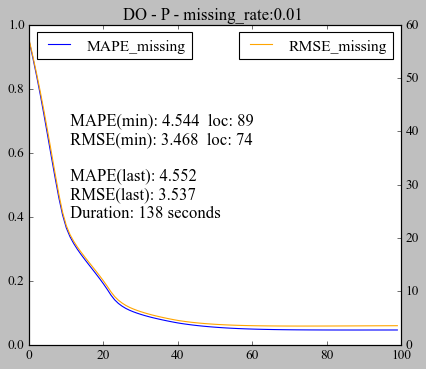

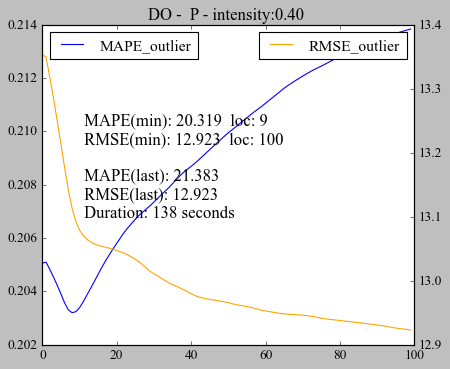

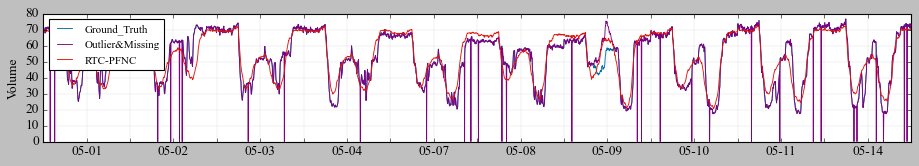

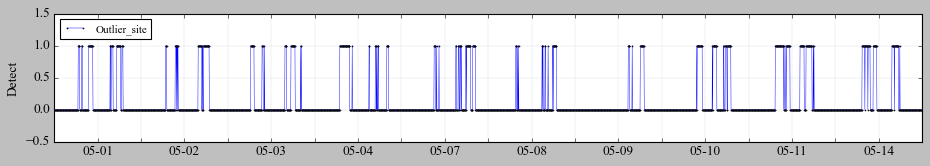

In [451]:
P_DO(0.01,0.4,6,3)#0.2

Iter: 100
MAPE_missing: 0.0593747
RMSE_missing: 2.69773
MAPE_outlier: 0.0902113
RMSE_outlier: 3.73353
MAPE_no_missing_outlier: 0.0581015
RMSE_no_missing_outlier: 2.67655

Total iteration: 100
Tolerance: 0.000200649
Imputation MAPE_missing: 0.0593747
Imputation RMSE_missing: 2.69773
Imputation MAPE_outlier: 0.0902113
Imputation RMSE_outlier: 3.73353
Imputation MAPE_no_missing_outlier: 0.0581015
Imputation RMSE_no_missing_outlier: 2.67655

Detect_rate: 59.034% 
False_Detect_rate: 5.083% 
Precision: 2.296% 
Recall: 9.597% 
F1_Score: 0.037
Running time: 93 seconds


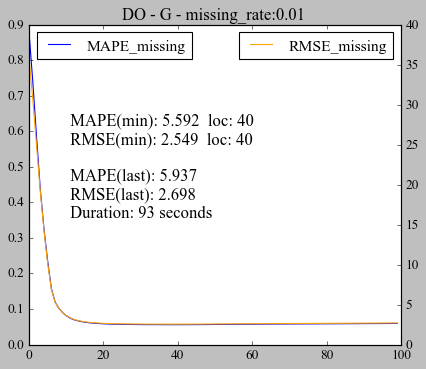

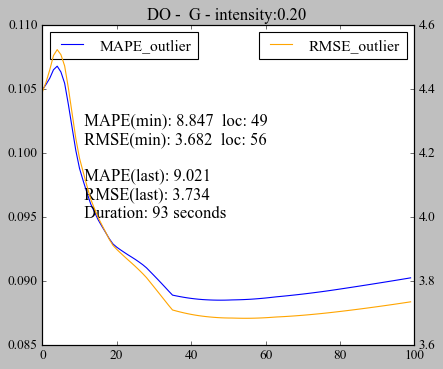

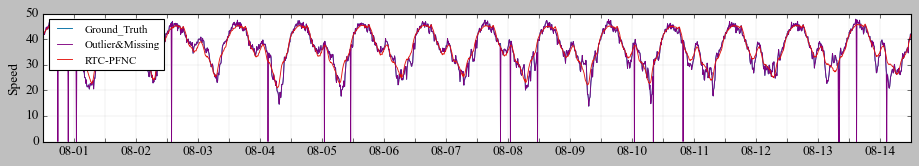

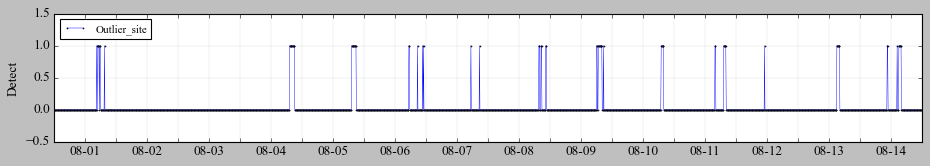

In [454]:
G_DO(0.01,0.2,6,3)#0.2

## 场景1

### 大型活动 通畅

Iter: 100
MAPE_missing: 0.0791188
RMSE_missing: 5.66668
MAPE_outlier: 0.237632
RMSE_outlier: 13.6284

Total iteration: 100
Tolerance: 0.000365497
Imputation MAPE_missing: 0.0791188
Imputation RMSE_missing: 5.66668
Imputation MAPE_outlier: 0.237632
Imputation RMSE_outlier: 13.6284

Detect_rate: 39.474% 
False_Detect_rate: 4.227% 
Running time: 57 seconds


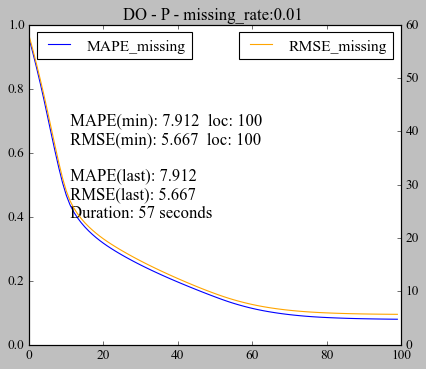

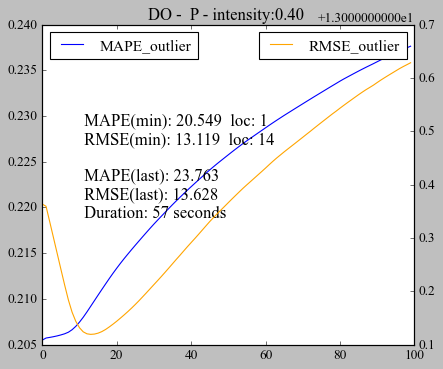

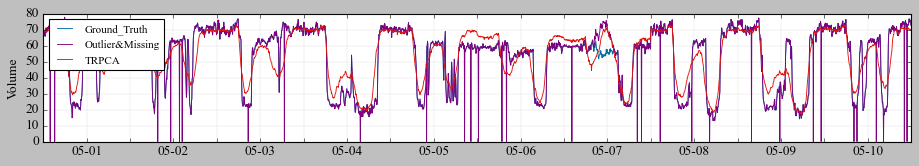

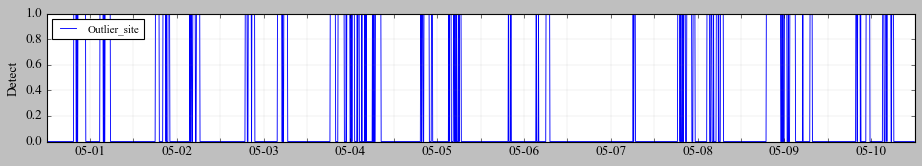

In [43]:
P_DO(0.01,0.4,6,3)

Iter: 100
MAPE_missing: 0.0791188
RMSE_missing: 5.66668
MAPE_outlier: 0.237632
RMSE_outlier: 13.6284
MAPE_no_missing_outlier: 0.0660612
RMSE_no_missing_outlier: 4.80278

Total iteration: 100
Tolerance: 0.000365497
Imputation MAPE_missing: 0.0791188
Imputation RMSE_missing: 5.66668
Imputation MAPE_outlier: 0.237632
Imputation RMSE_outlier: 13.6284
Imputation MAPE_no_missing_outlier: 0.0660612
Imputation RMSE_no_missing_outlier: 4.80278

Detect_rate: 50.000% 
False_Detect_rate: 6.869% 
Running time: 69 seconds


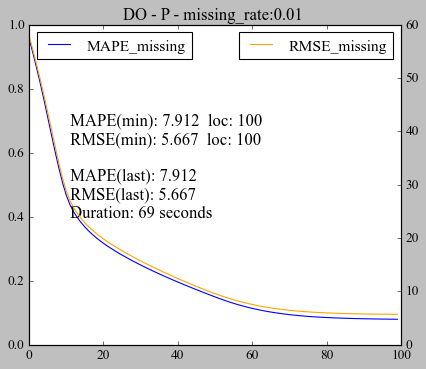

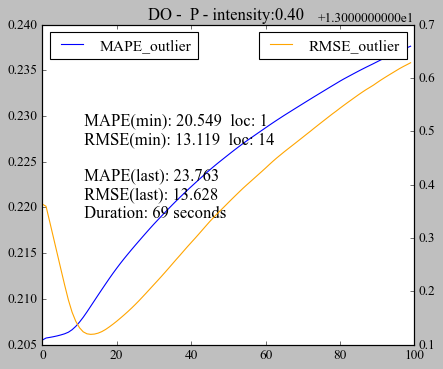

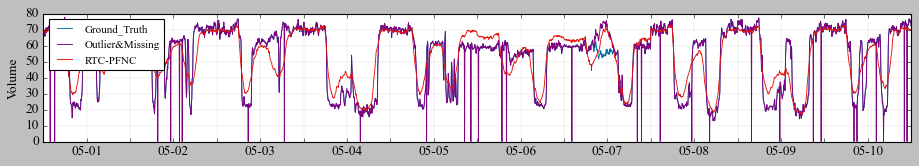

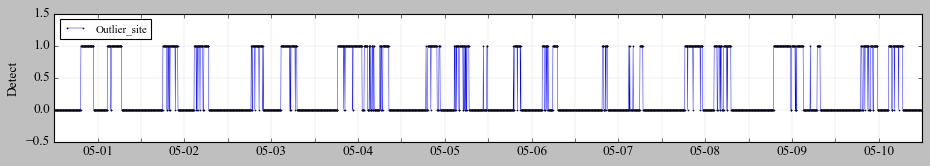

In [297]:
P_DO(0.01,0.4,6,3)#0.2

Iter: 100
MAPE_missing: 0.080342
RMSE_missing: 5.82063
MAPE_outlier: 0.395354
RMSE_outlier: 22.8696

Total iteration: 100
Tolerance: 0.000361567
Imputation MAPE_missing: 0.080342
Imputation RMSE_missing: 5.82063
Imputation MAPE_outlier: 0.395354
Imputation RMSE_outlier: 22.8696

Detect_rate: 31.871% 
False_Detect_rate: 4.191% 
Running time: 57 seconds


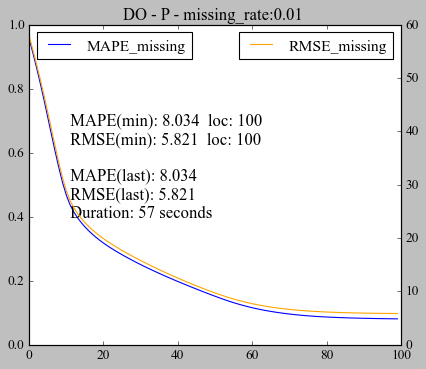

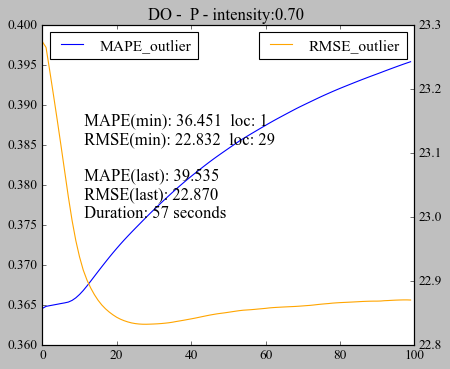

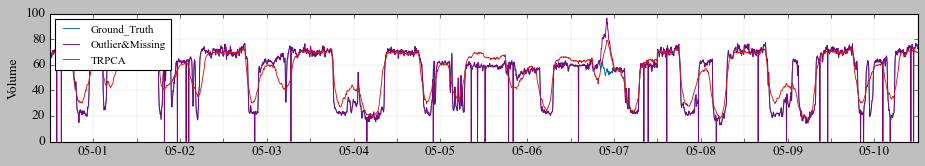

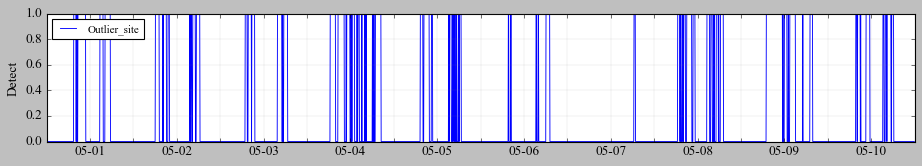

In [44]:
P_DO(0.01,0.7,4,3)

Iter: 100
MAPE_missing: 0.080342
RMSE_missing: 5.82063
MAPE_outlier: 0.395354
RMSE_outlier: 22.8696
MAPE_no_missing_outlier: 0.065754
RMSE_no_missing_outlier: 4.78371

Total iteration: 100
Tolerance: 0.000361567
Imputation MAPE_missing: 0.080342
Imputation RMSE_missing: 5.82063
Imputation MAPE_outlier: 0.395354
Imputation RMSE_outlier: 22.8696
Imputation MAPE_no_missing_outlier: 0.065754
Imputation RMSE_no_missing_outlier: 4.78371

Detect_rate: 43.421% 
False_Detect_rate: 6.815% 
Running time: 69 seconds


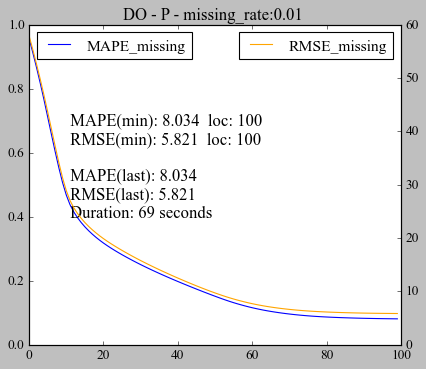

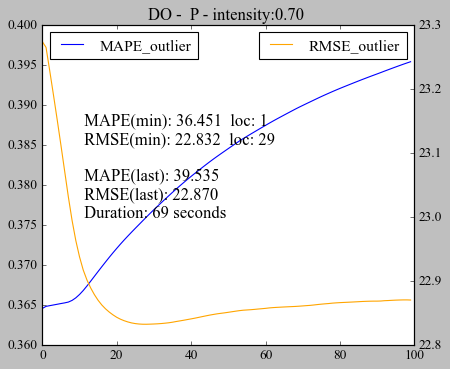

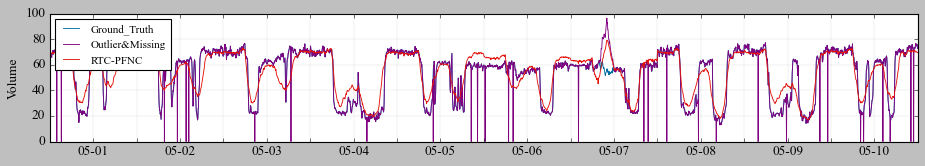

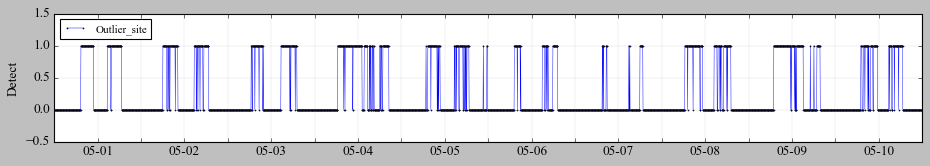

In [298]:
P_DO(0.01,0.7,4,3)#0.2

Iter: 100
MAPE_missing: 0.0799665
RMSE_missing: 5.81916
MAPE_outlier: 0.561731
RMSE_outlier: 31.706

Total iteration: 100
Tolerance: 0.000356289
Imputation MAPE_missing: 0.0799665
Imputation RMSE_missing: 5.81916
Imputation MAPE_outlier: 0.561731
Imputation RMSE_outlier: 31.706

Detect_rate: 22.953% 
False_Detect_rate: 4.206% 
Running time: 57 seconds


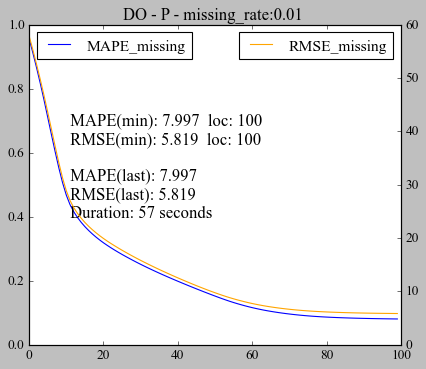

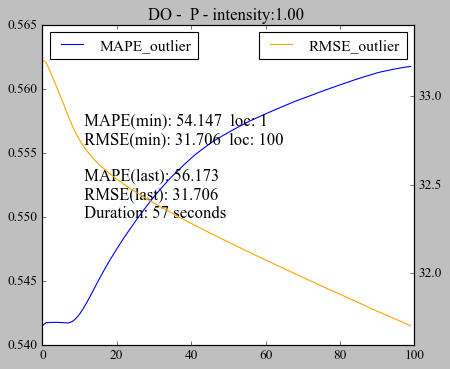

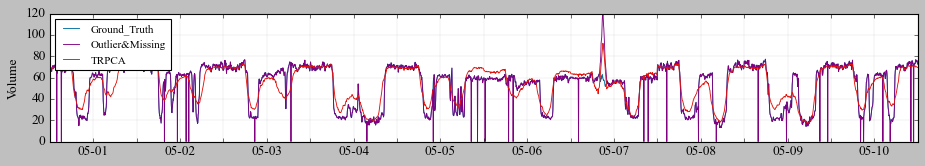

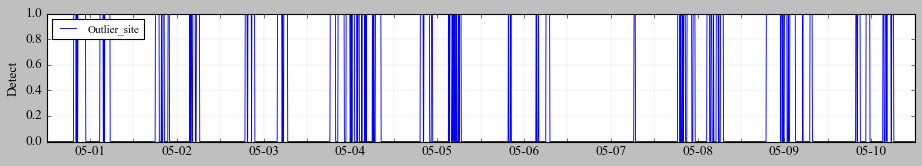

In [45]:
P_DO(0.01,1,2,3)

Iter: 100
MAPE_missing: 0.0799665
RMSE_missing: 5.81916
MAPE_outlier: 0.561731
RMSE_outlier: 31.706
MAPE_no_missing_outlier: 0.0658243
RMSE_no_missing_outlier: 4.78632

Total iteration: 100
Tolerance: 0.000356289
Imputation MAPE_missing: 0.0799665
Imputation RMSE_missing: 5.81916
Imputation MAPE_outlier: 0.561731
Imputation RMSE_outlier: 31.706
Imputation MAPE_no_missing_outlier: 0.0658243
Imputation RMSE_no_missing_outlier: 4.78632

Detect_rate: 35.819% 
False_Detect_rate: 6.826% 
Running time: 69 seconds


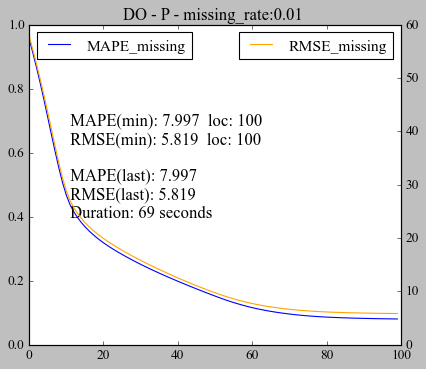

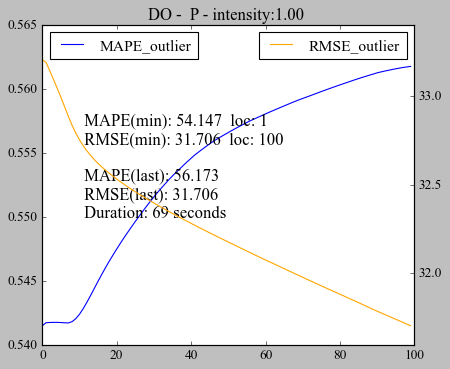

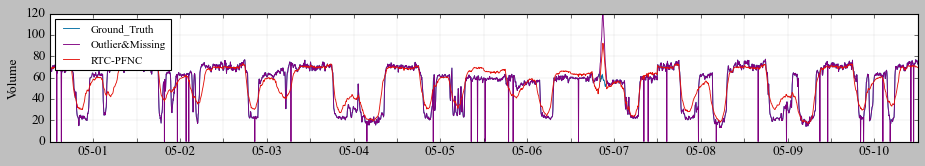

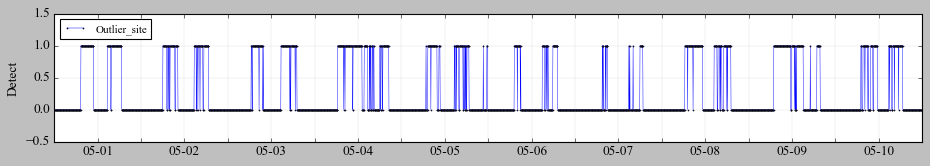

In [299]:
P_DO(0.01,1,2,3)#0.2

Iter: 100
MAPE_missing: 0.100478
RMSE_missing: 4.11922
MAPE_outlier: 0.126262
RMSE_outlier: 4.76707

Total iteration: 100
Tolerance: 0.000208197
Imputation MAPE_missing: 0.100478
Imputation RMSE_missing: 4.11922
Imputation MAPE_outlier: 0.126262
Imputation RMSE_outlier: 4.76707

Detect_rate: 52.492% 
False_Detect_rate: 5.926% 
Running time: 36 seconds


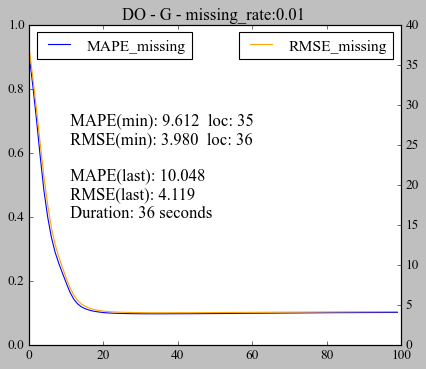

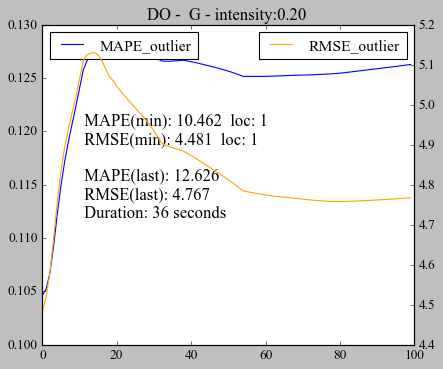

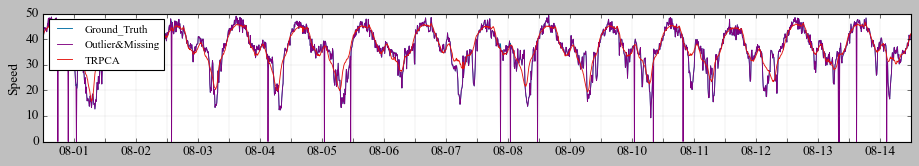

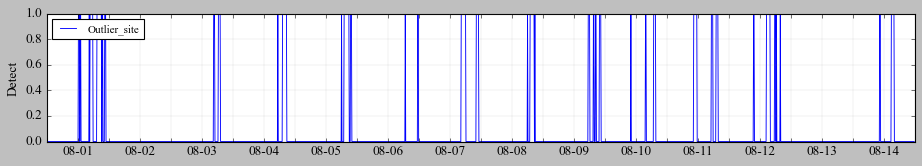

In [46]:
G_DO(0.01,0.2,6,3)

Iter: 100
MAPE_missing: 0.100478
RMSE_missing: 4.11922
MAPE_outlier: 0.126262
RMSE_outlier: 4.76707
MAPE_no_missing_outlier: 0.0973149
RMSE_no_missing_outlier: 4.05093

Total iteration: 100
Tolerance: 0.000208197
Imputation MAPE_missing: 0.100478
Imputation RMSE_missing: 4.11922
Imputation MAPE_outlier: 0.126262
Imputation RMSE_outlier: 4.76707
Imputation MAPE_no_missing_outlier: 0.0973149
Imputation RMSE_no_missing_outlier: 4.05093

Detect_rate: 69.938% 
False_Detect_rate: 9.364% 
Running time: 44 seconds


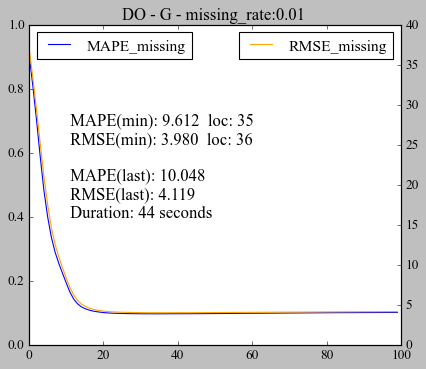

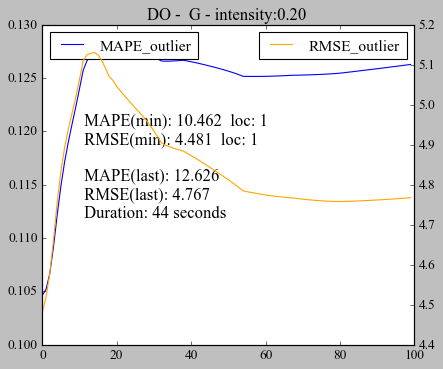

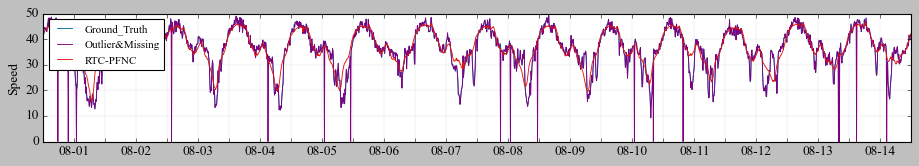

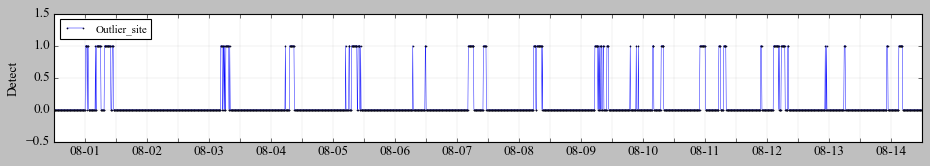

In [300]:
G_DO(0.01,0.2,6,3)#0.2

Iter: 100
MAPE_missing: 0.100508
RMSE_missing: 4.12327
MAPE_outlier: 0.153387
RMSE_outlier: 5.66325

Total iteration: 100
Tolerance: 0.000208036
Imputation MAPE_missing: 0.100508
Imputation RMSE_missing: 4.12327
Imputation MAPE_outlier: 0.153387
Imputation RMSE_outlier: 5.66325

Detect_rate: 58.879% 
False_Detect_rate: 5.918% 
Running time: 36 seconds


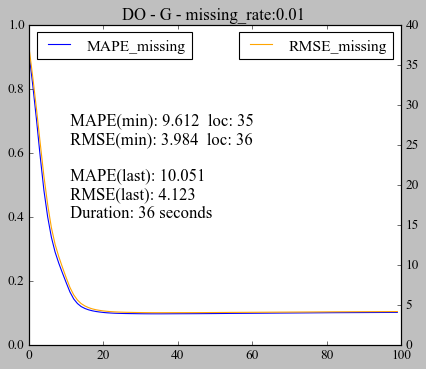

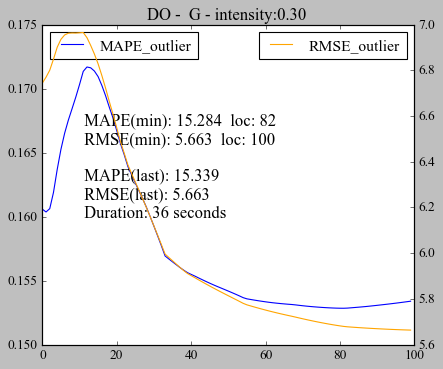

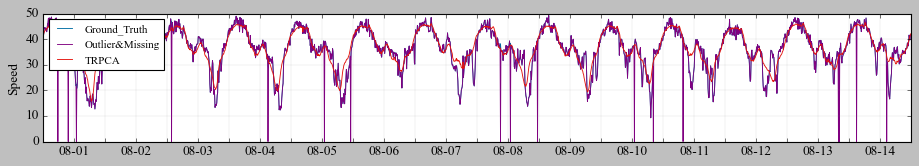

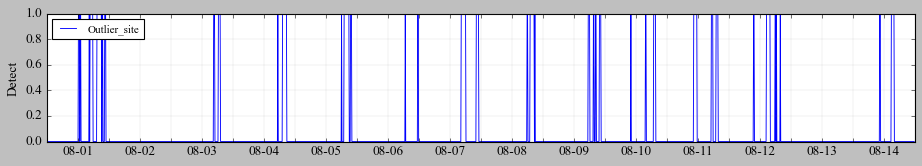

In [47]:
G_DO(0.01,0.3,4,3)

Iter: 100
MAPE_missing: 0.100508
RMSE_missing: 4.12327
MAPE_outlier: 0.153387
RMSE_outlier: 5.66325
MAPE_no_missing_outlier: 0.0972147
RMSE_no_missing_outlier: 4.04852

Total iteration: 100
Tolerance: 0.000208036
Imputation MAPE_missing: 0.100508
Imputation RMSE_missing: 4.12327
Imputation MAPE_outlier: 0.153387
Imputation RMSE_outlier: 5.66325
Imputation MAPE_no_missing_outlier: 0.0972147
Imputation RMSE_no_missing_outlier: 4.04852

Detect_rate: 91.121% 
False_Detect_rate: 9.353% 
Running time: 45 seconds


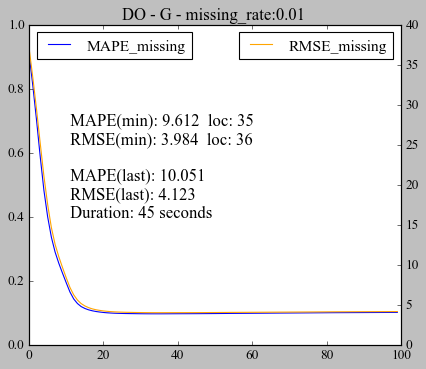

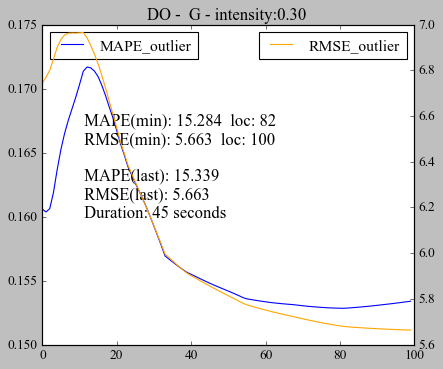

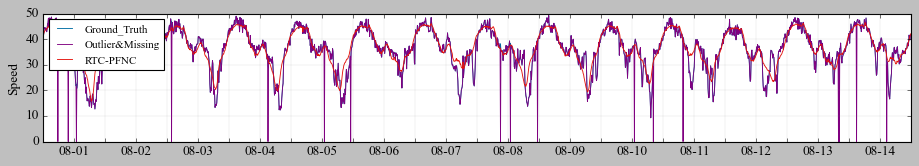

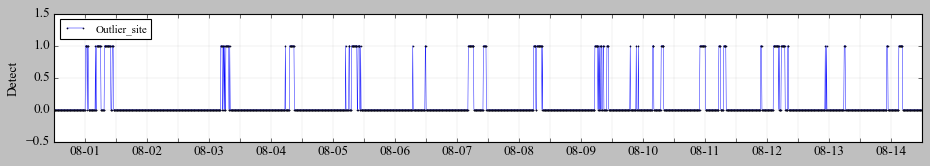

In [301]:
G_DO(0.01,0.3,4,3)#0.2

Iter: 100
MAPE_missing: 0.100452
RMSE_missing: 4.12236
MAPE_outlier: 0.180331
RMSE_outlier: 6.70532

Total iteration: 100
Tolerance: 0.00020731
Imputation MAPE_missing: 0.100452
Imputation RMSE_missing: 4.12236
Imputation MAPE_outlier: 0.180331
Imputation RMSE_outlier: 6.70532

Detect_rate: 86.604% 
False_Detect_rate: 5.932% 
Running time: 36 seconds


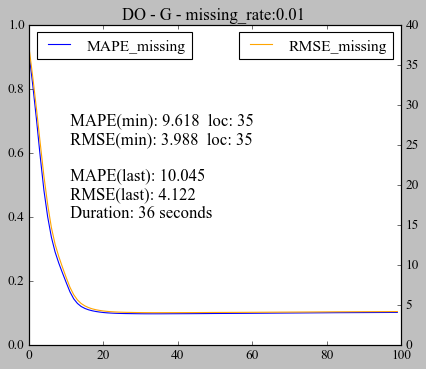

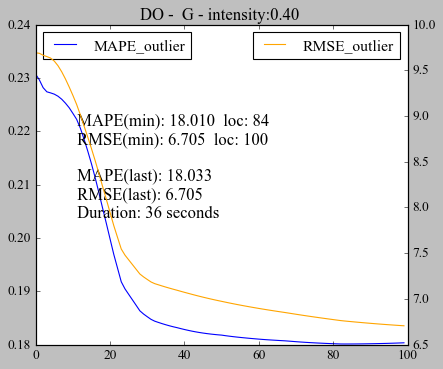

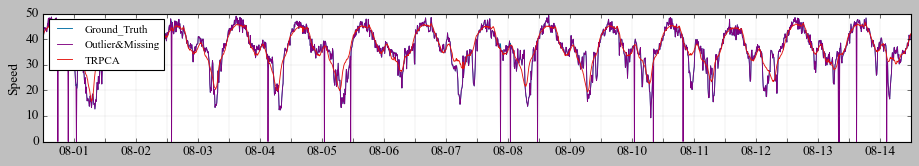

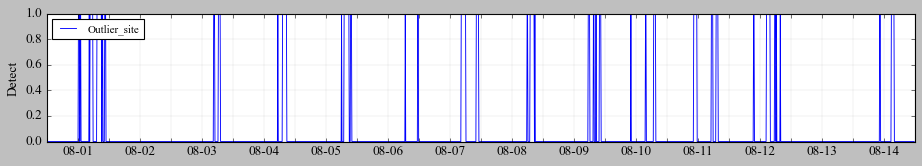

In [48]:
G_DO(0.01,0.4,2,3)

Iter: 100
MAPE_missing: 0.100452
RMSE_missing: 4.12236
MAPE_outlier: 0.180331
RMSE_outlier: 6.70532
MAPE_no_missing_outlier: 0.0972457
RMSE_no_missing_outlier: 4.04934

Total iteration: 100
Tolerance: 0.00020731
Imputation MAPE_missing: 0.100452
Imputation RMSE_missing: 4.12236
Imputation MAPE_outlier: 0.180331
Imputation RMSE_outlier: 6.70532
Imputation MAPE_no_missing_outlier: 0.0972457
Imputation RMSE_no_missing_outlier: 4.04934

Detect_rate: 98.910% 
False_Detect_rate: 9.363% 
Running time: 44 seconds


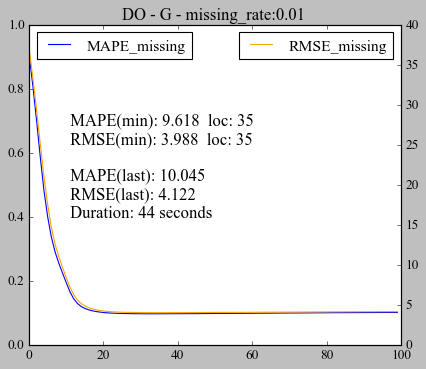

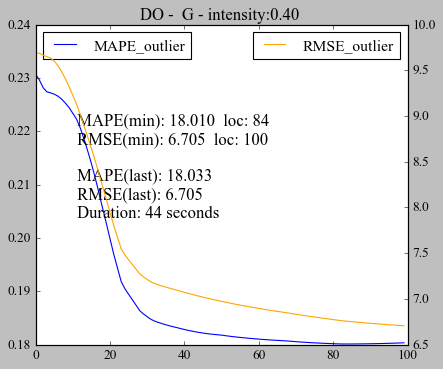

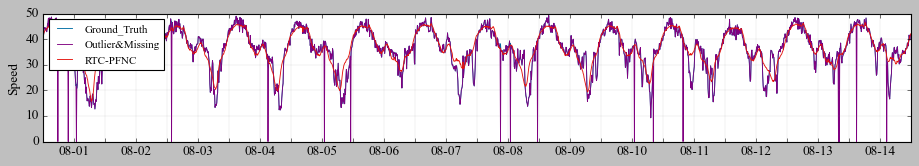

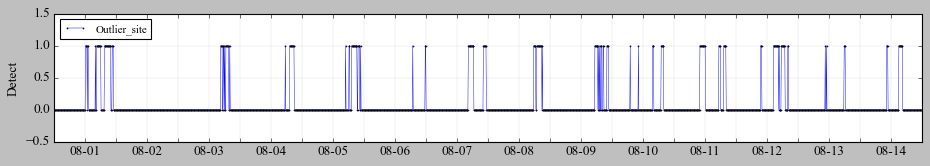

In [302]:
G_DO(0.01,0.4,2,3)#0.2

### 大型活动 拥堵

Iter: 100
MAPE_missing: 0.0771679
RMSE_missing: 5.55928
MAPE_outlier: 0.148848
RMSE_outlier: 8.00437

Total iteration: 100
Tolerance: 0.00036267
Imputation MAPE_missing: 0.0771679
Imputation RMSE_missing: 5.55928
Imputation MAPE_outlier: 0.148848
Imputation RMSE_outlier: 8.00437

Detect_rate: 26.901% 
False_Detect_rate: 4.276% 
Running time: 58 seconds


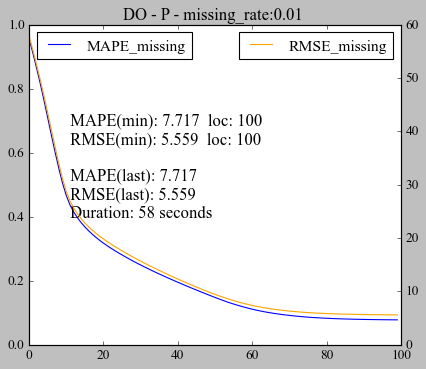

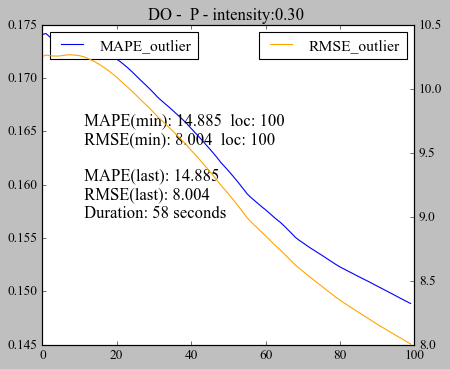

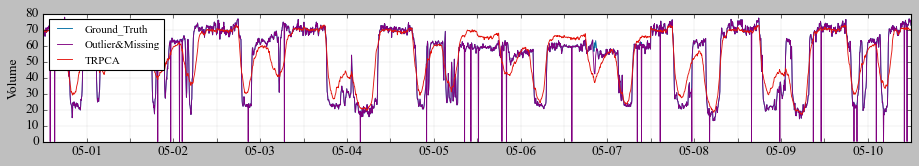

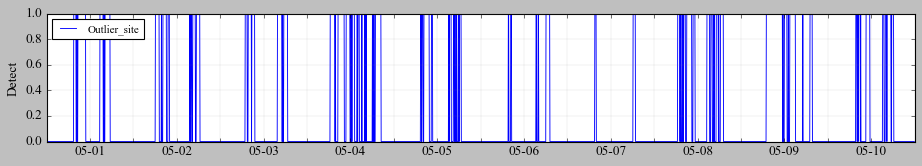

In [61]:
P_DO(0.01,0.3,1,3)

Iter: 100
MAPE_missing: 0.0771679
RMSE_missing: 5.55928
MAPE_outlier: 0.148848
RMSE_outlier: 8.00437
MAPE_no_missing_outlier: 0.0667299
RMSE_no_missing_outlier: 4.84506

Total iteration: 100
Tolerance: 0.00036267
Imputation MAPE_missing: 0.0771679
Imputation RMSE_missing: 5.55928
Imputation MAPE_outlier: 0.148848
Imputation RMSE_outlier: 8.00437
Imputation MAPE_no_missing_outlier: 0.0667299
Imputation RMSE_no_missing_outlier: 4.84506

Detect_rate: 63.889% 
False_Detect_rate: 6.940% 
Running time: 70 seconds


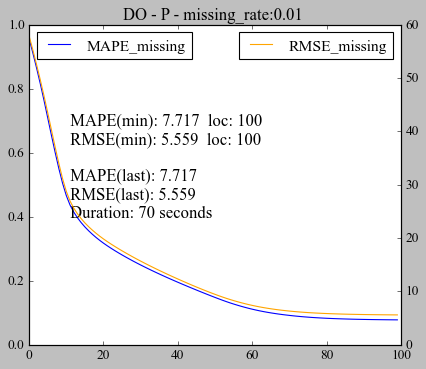

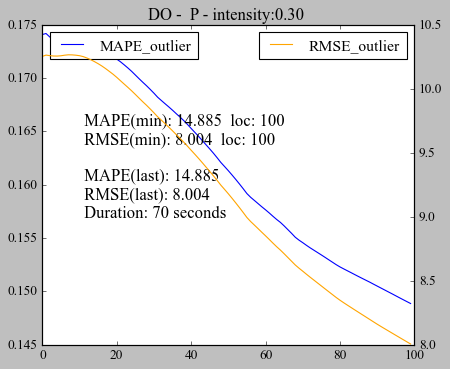

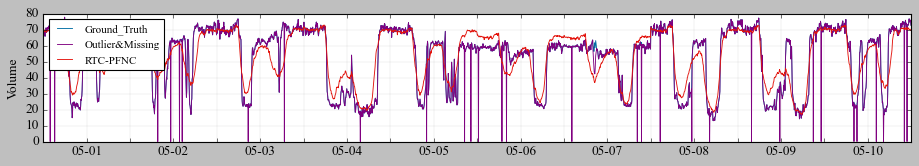

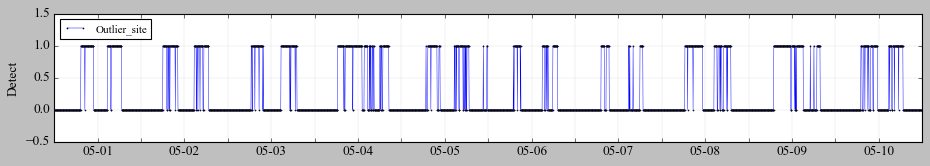

In [308]:
P_DO(0.01,0.3,1,3)#0.2

Iter: 100
MAPE_missing: 0.077492
RMSE_missing: 5.58502
MAPE_outlier: 0.22481
RMSE_outlier: 12.6676

Total iteration: 100
Tolerance: 0.00036138
Imputation MAPE_missing: 0.077492
Imputation RMSE_missing: 5.58502
Imputation MAPE_outlier: 0.22481
Imputation RMSE_outlier: 12.6676

Detect_rate: 81.579% 
False_Detect_rate: 4.268% 
Running time: 58 seconds


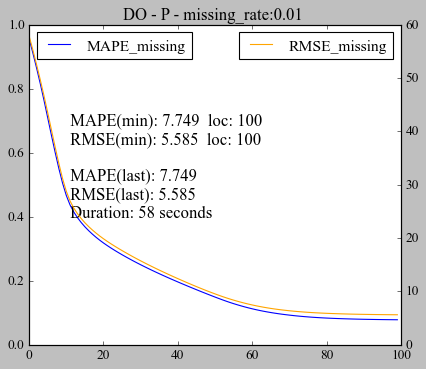

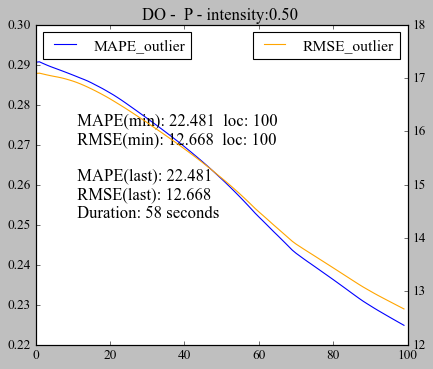

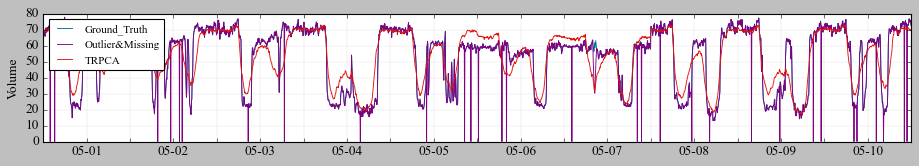

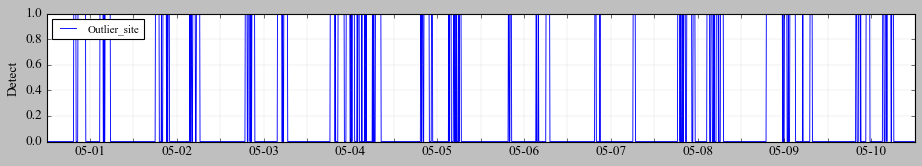

In [62]:
P_DO(0.01,0.5,1,3)

Iter: 100
MAPE_missing: 0.077492
RMSE_missing: 5.58502
MAPE_outlier: 0.22481
RMSE_outlier: 12.6676
MAPE_no_missing_outlier: 0.0666365
RMSE_no_missing_outlier: 4.83667

Total iteration: 100
Tolerance: 0.00036138
Imputation MAPE_missing: 0.077492
Imputation RMSE_missing: 5.58502
Imputation MAPE_outlier: 0.22481
Imputation RMSE_outlier: 12.6676
Imputation MAPE_no_missing_outlier: 0.0666365
Imputation RMSE_no_missing_outlier: 4.83667

Detect_rate: 95.760% 
False_Detect_rate: 6.925% 
Running time: 69 seconds


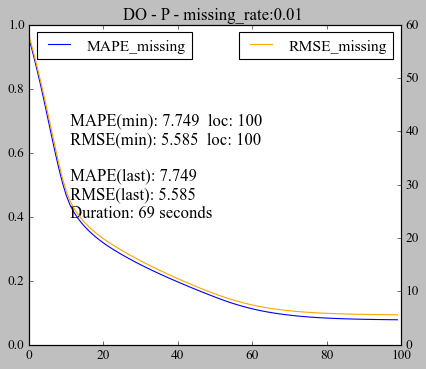

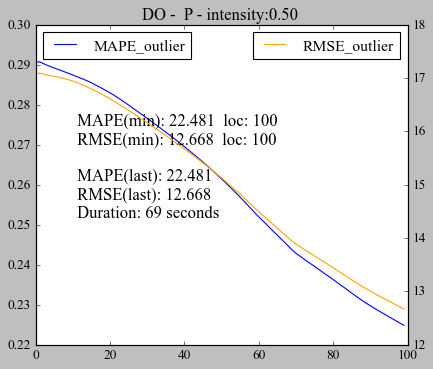

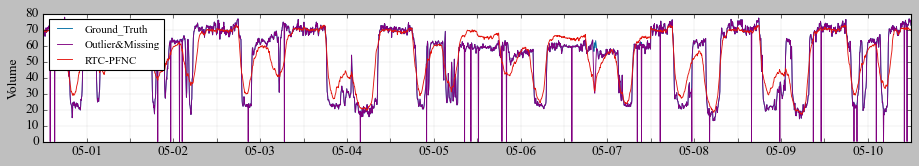

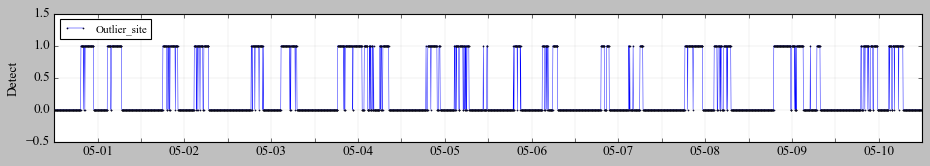

In [309]:
P_DO(0.01,0.5,1,3)#0.2

Iter: 100
MAPE_missing: 0.0780608
RMSE_missing: 5.64328
MAPE_outlier: 0.335728
RMSE_outlier: 19.1318

Total iteration: 100
Tolerance: 0.000358226
Imputation MAPE_missing: 0.0780608
Imputation RMSE_missing: 5.64328
Imputation MAPE_outlier: 0.335728
Imputation RMSE_outlier: 19.1318

Detect_rate: 97.368% 
False_Detect_rate: 4.253% 
Running time: 58 seconds


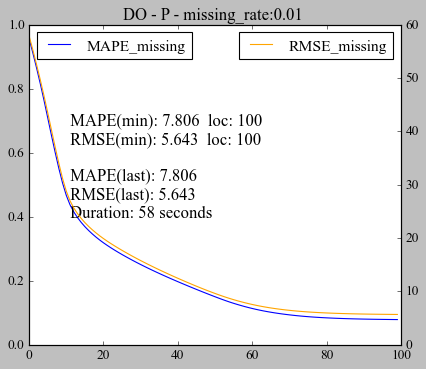

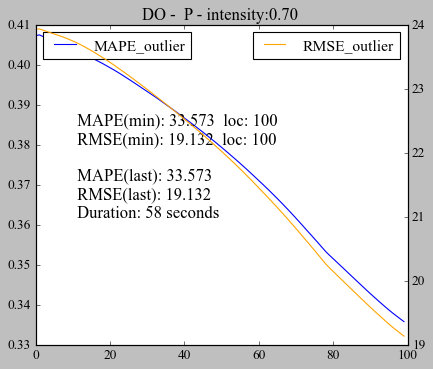

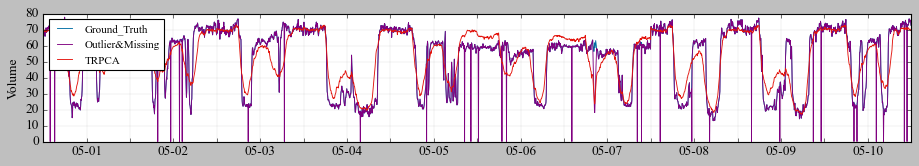

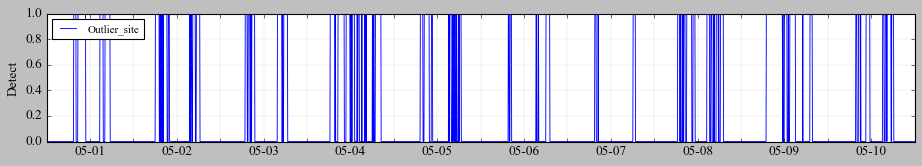

In [63]:
P_DO(0.01,0.7,1,3)

Iter: 100
MAPE_missing: 0.0780608
RMSE_missing: 5.64328
MAPE_outlier: 0.335728
RMSE_outlier: 19.1318
MAPE_no_missing_outlier: 0.06649
RMSE_no_missing_outlier: 4.82564

Total iteration: 100
Tolerance: 0.000358226
Imputation MAPE_missing: 0.0780608
Imputation RMSE_missing: 5.64328
Imputation MAPE_outlier: 0.335728
Imputation RMSE_outlier: 19.1318
Imputation MAPE_no_missing_outlier: 0.06649
Imputation RMSE_no_missing_outlier: 4.82564

Detect_rate: 99.415% 
False_Detect_rate: 6.904% 
Running time: 68 seconds


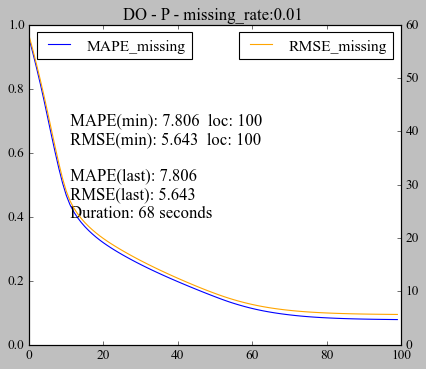

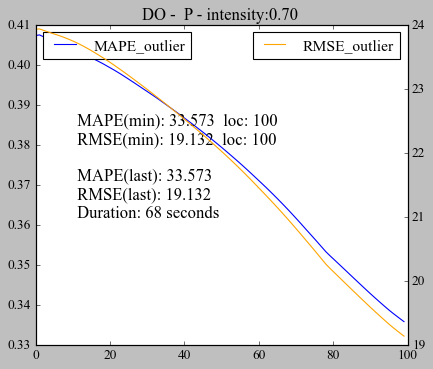

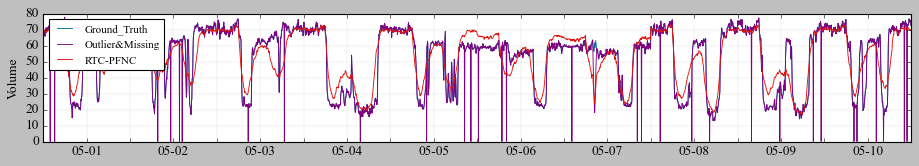

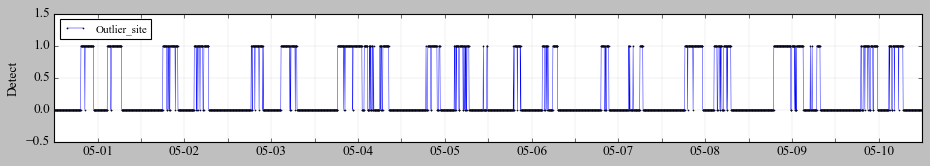

In [310]:
P_DO(0.01,0.7,1,3)#0.2

Iter: 100
MAPE_missing: 0.10041
RMSE_missing: 4.1222
MAPE_outlier: 0.200402
RMSE_outlier: 7.41109

Total iteration: 100
Tolerance: 0.000208158
Imputation MAPE_missing: 0.10041
Imputation RMSE_missing: 4.1222
Imputation MAPE_outlier: 0.200402
Imputation RMSE_outlier: 7.41109

Detect_rate: 98.131% 
False_Detect_rate: 5.939% 
Running time: 36 seconds


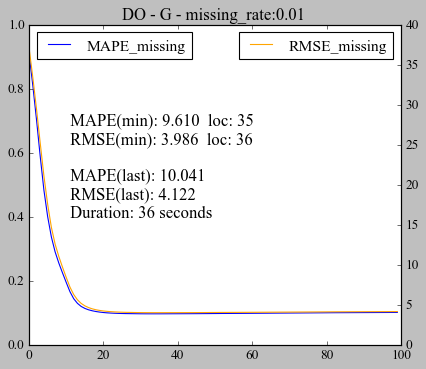

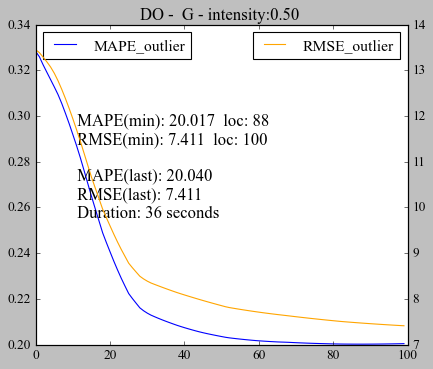

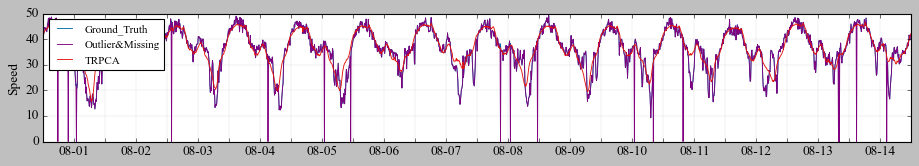

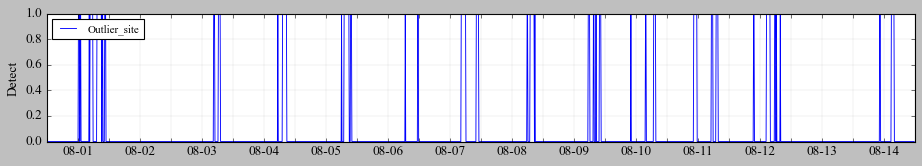

In [64]:
G_DO(0.01,0.5,1,3)

Iter: 100
MAPE_missing: 0.10041
RMSE_missing: 4.1222
MAPE_outlier: 0.200402
RMSE_outlier: 7.41109
MAPE_no_missing_outlier: 0.0973014
RMSE_no_missing_outlier: 4.05078

Total iteration: 100
Tolerance: 0.000208158
Imputation MAPE_missing: 0.10041
Imputation RMSE_missing: 4.1222
Imputation MAPE_outlier: 0.200402
Imputation RMSE_outlier: 7.41109
Imputation MAPE_no_missing_outlier: 0.0973014
Imputation RMSE_no_missing_outlier: 4.05078

Detect_rate: 99.065% 
False_Detect_rate: 9.376% 
Running time: 45 seconds


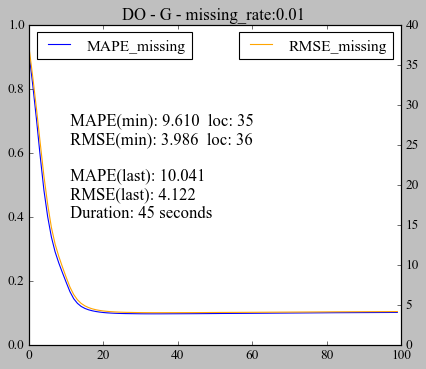

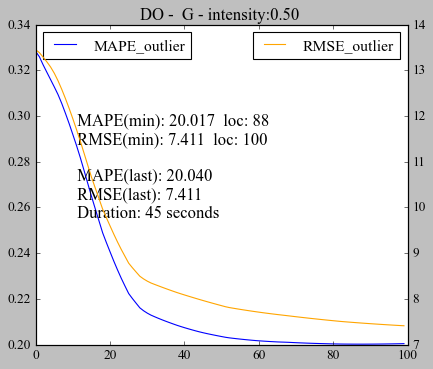

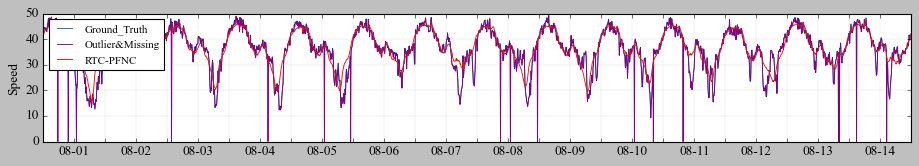

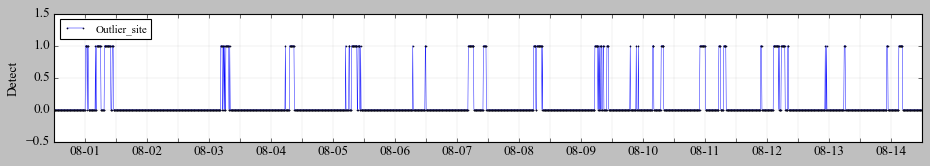

In [311]:
G_DO(0.01,0.5,1,3)#0.2

Iter: 100
MAPE_missing: 0.100443
RMSE_missing: 4.12658
MAPE_outlier: 0.218996
RMSE_outlier: 8.38136

Total iteration: 100
Tolerance: 0.000208525
Imputation MAPE_missing: 0.100443
Imputation RMSE_missing: 4.12658
Imputation MAPE_outlier: 0.218996
Imputation RMSE_outlier: 8.38136

Detect_rate: 99.065% 
False_Detect_rate: 5.937% 
Running time: 36 seconds


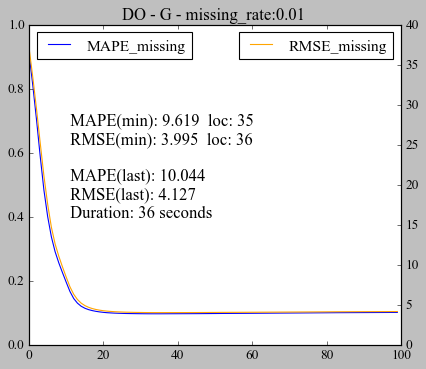

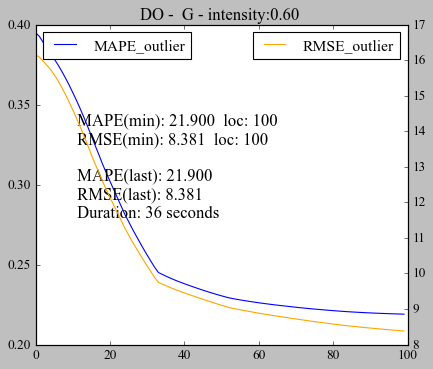

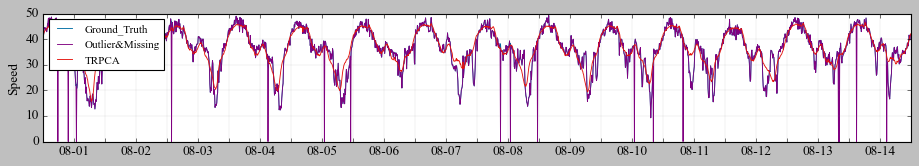

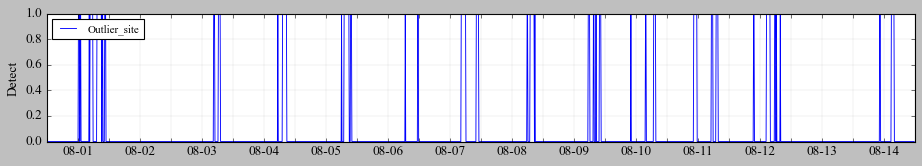

In [65]:
G_DO(0.01,0.6,1,3)

Iter: 100
MAPE_missing: 0.100443
RMSE_missing: 4.12658
MAPE_outlier: 0.218996
RMSE_outlier: 8.38136
MAPE_no_missing_outlier: 0.0973016
RMSE_no_missing_outlier: 4.05082

Total iteration: 100
Tolerance: 0.000208525
Imputation MAPE_missing: 0.100443
Imputation RMSE_missing: 4.12658
Imputation MAPE_outlier: 0.218996
Imputation RMSE_outlier: 8.38136
Imputation MAPE_no_missing_outlier: 0.0973016
Imputation RMSE_no_missing_outlier: 4.05082

Detect_rate: 99.221% 
False_Detect_rate: 9.375% 
Running time: 44 seconds


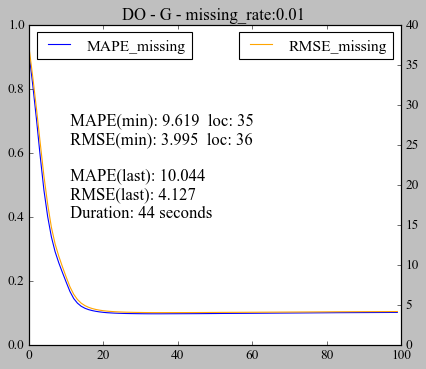

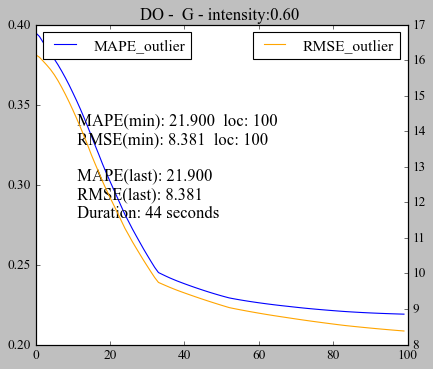

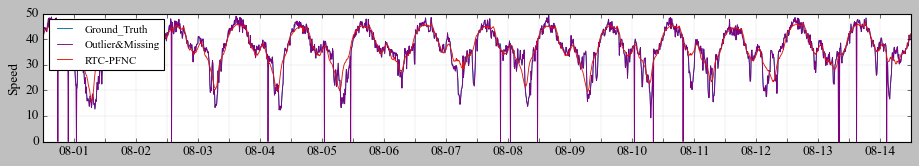

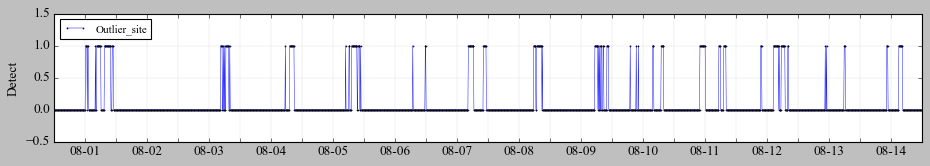

In [312]:
G_DO(0.01,0.6,1,3)#0.2

Iter: 100
MAPE_missing: 0.100481
RMSE_missing: 4.13186
MAPE_outlier: 0.240518
RMSE_outlier: 9.4634

Total iteration: 100
Tolerance: 0.000209017
Imputation MAPE_missing: 0.100481
Imputation RMSE_missing: 4.13186
Imputation MAPE_outlier: 0.240518
Imputation RMSE_outlier: 9.4634

Detect_rate: 99.221% 
False_Detect_rate: 5.938% 
Running time: 36 seconds


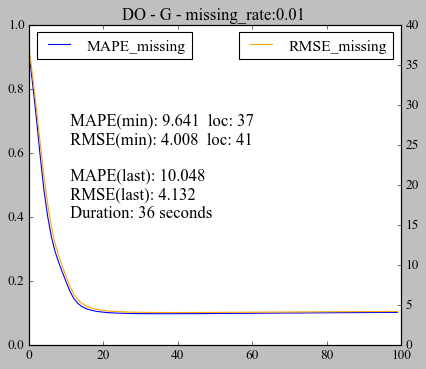

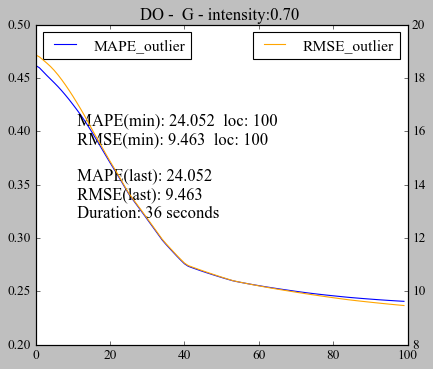

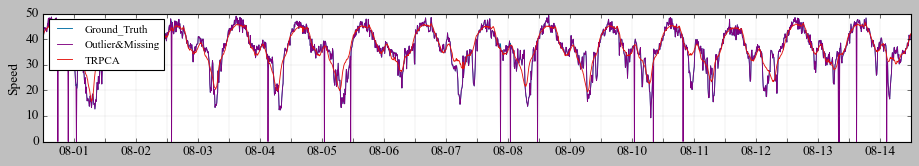

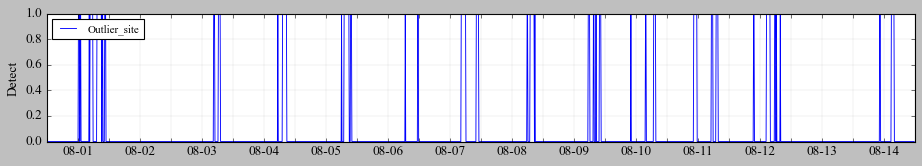

In [66]:
G_DO(0.01,0.7,1,3)

Iter: 100
MAPE_missing: 0.100481
RMSE_missing: 4.13186
MAPE_outlier: 0.240518
RMSE_outlier: 9.4634
MAPE_no_missing_outlier: 0.0973043
RMSE_no_missing_outlier: 4.05093

Total iteration: 100
Tolerance: 0.000209017
Imputation MAPE_missing: 0.100481
Imputation RMSE_missing: 4.13186
Imputation MAPE_outlier: 0.240518
Imputation RMSE_outlier: 9.4634
Imputation MAPE_no_missing_outlier: 0.0973043
Imputation RMSE_no_missing_outlier: 4.05093

Detect_rate: 99.221% 
False_Detect_rate: 9.373% 
Running time: 44 seconds


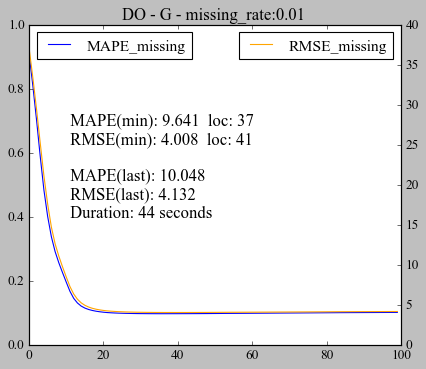

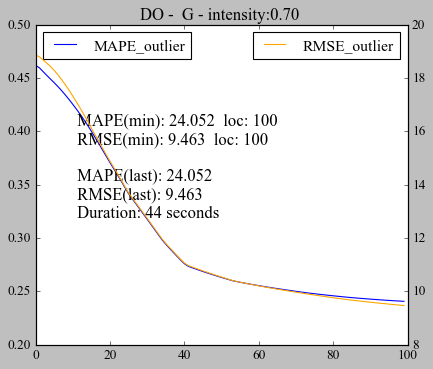

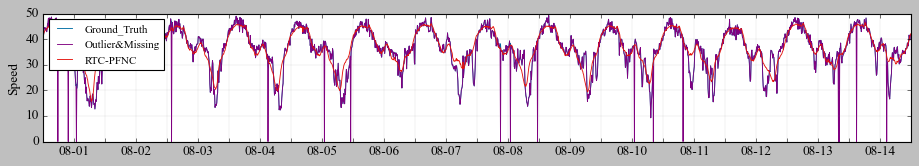

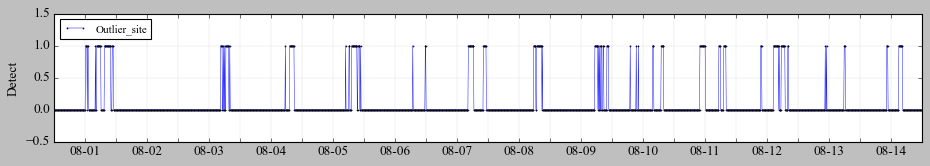

In [313]:
G_DO(0.01,0.7,1,3)#0.2

## 场景2

### 活动（畅通）

Iter: 100
MAPE_missing: 0.0770001
RMSE_missing: 5.54884
MAPE_outlier: 0.13537
RMSE_outlier: 7.56125

Total iteration: 100
Tolerance: 0.000365079
Imputation MAPE_missing: 0.0770001
Imputation RMSE_missing: 5.54884
Imputation MAPE_outlier: 0.13537
Imputation RMSE_outlier: 7.56125

Detect_rate: 50.000% 
False_Detect_rate: 4.292% 
Running time: 58 seconds


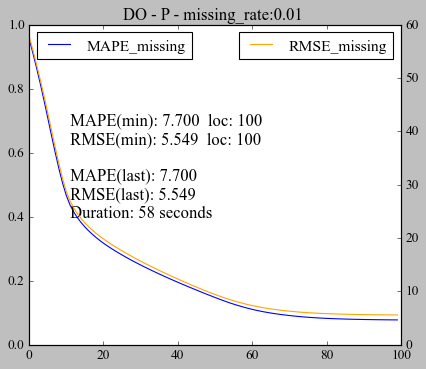

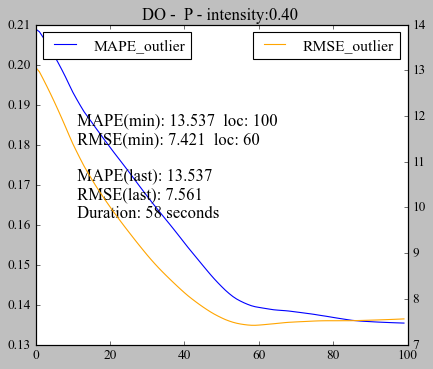

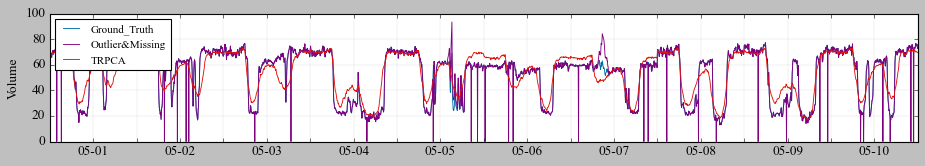

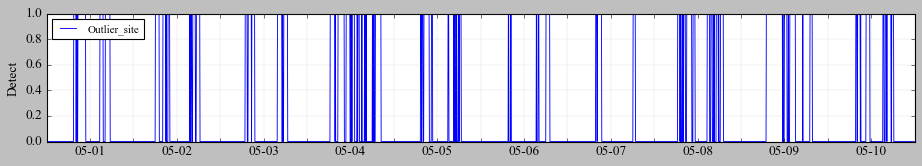

In [76]:
P_DO(0.01,0.4,3,10)

Iter: 100
MAPE_missing: 0.0770001
RMSE_missing: 5.54884
MAPE_outlier: 0.13537
RMSE_outlier: 7.56125
MAPE_no_missing_outlier: 0.066792
RMSE_no_missing_outlier: 4.84724

Total iteration: 100
Tolerance: 0.000365079
Imputation MAPE_missing: 0.0770001
Imputation RMSE_missing: 5.54884
Imputation MAPE_outlier: 0.13537
Imputation RMSE_outlier: 7.56125
Imputation MAPE_no_missing_outlier: 0.066792
Imputation RMSE_no_missing_outlier: 4.84724

Detect_rate: 99.000% 
False_Detect_rate: 6.960% 
Running time: 70 seconds


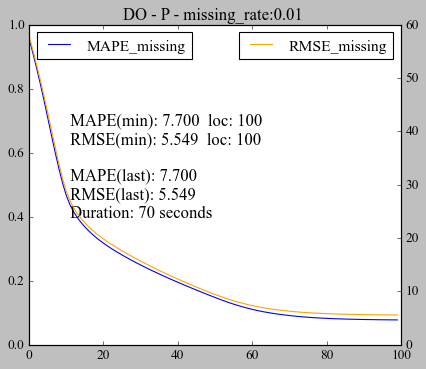

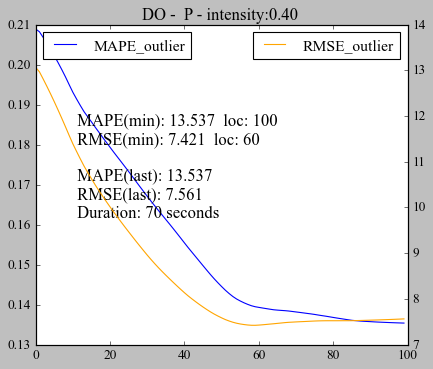

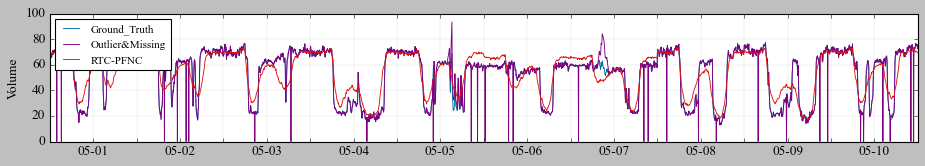

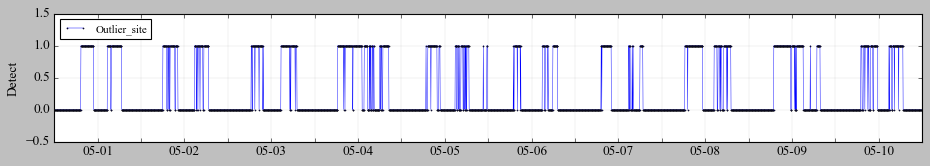

In [321]:
P_DO(0.01,0.4,3,10)#0.2

Iter: 100
MAPE_missing: 0.0770102
RMSE_missing: 5.54751
MAPE_outlier: 0.15228
RMSE_outlier: 8.24034

Total iteration: 100
Tolerance: 0.000366123
Imputation MAPE_missing: 0.0770102
Imputation RMSE_missing: 5.54751
Imputation MAPE_outlier: 0.15228
Imputation RMSE_outlier: 8.24034

Detect_rate: 97.000% 
False_Detect_rate: 4.290% 
Running time: 58 seconds


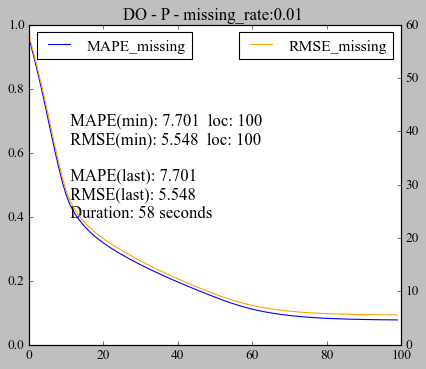

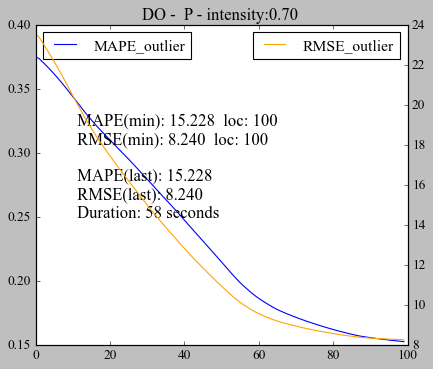

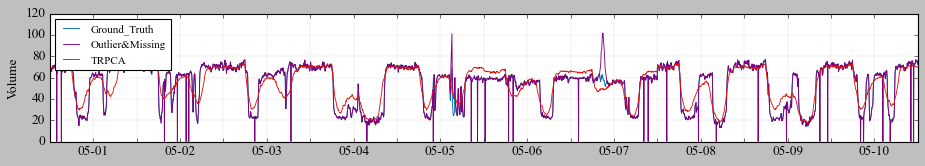

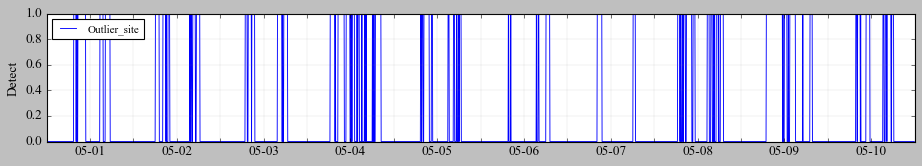

In [77]:
P_DO(0.01,0.7,2,10)

Iter: 100
MAPE_missing: 0.0770102
RMSE_missing: 5.54751
MAPE_outlier: 0.15228
RMSE_outlier: 8.24034
MAPE_no_missing_outlier: 0.0667748
RMSE_no_missing_outlier: 4.84528

Total iteration: 100
Tolerance: 0.000366123
Imputation MAPE_missing: 0.0770102
Imputation RMSE_missing: 5.54751
Imputation MAPE_outlier: 0.15228
Imputation RMSE_outlier: 8.24034
Imputation MAPE_no_missing_outlier: 0.0667748
Imputation RMSE_no_missing_outlier: 4.84528

Detect_rate: 100.000% 
False_Detect_rate: 6.960% 
Running time: 69 seconds


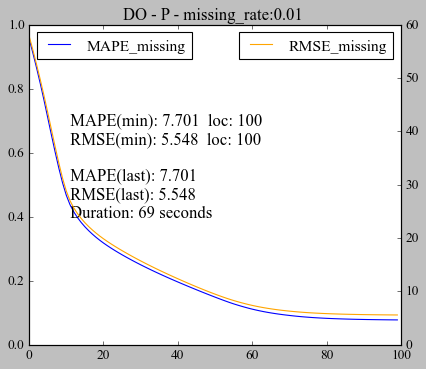

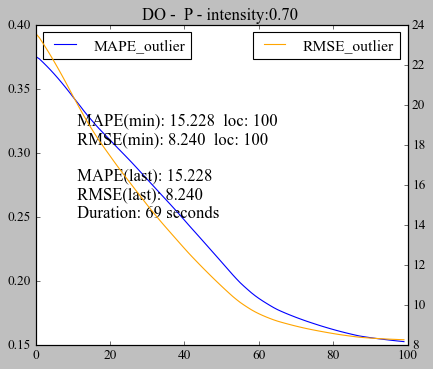

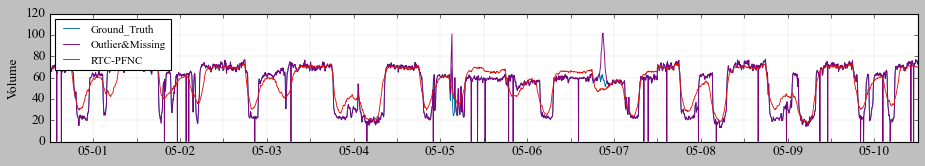

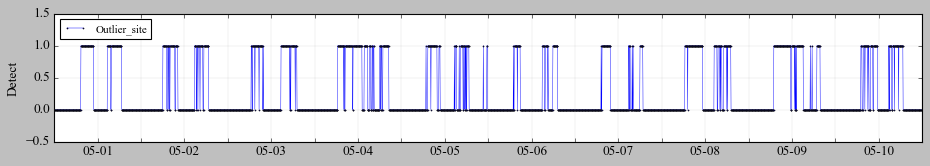

In [322]:
P_DO(0.01,0.7,2,10)#0.2

Iter: 100
MAPE_missing: 0.0770136
RMSE_missing: 5.54785
MAPE_outlier: 0.159234
RMSE_outlier: 8.63514

Total iteration: 100
Tolerance: 0.000366378
Imputation MAPE_missing: 0.0770136
Imputation RMSE_missing: 5.54785
Imputation MAPE_outlier: 0.159234
Imputation RMSE_outlier: 8.63514

Detect_rate: 99.000% 
False_Detect_rate: 4.291% 
Running time: 58 seconds


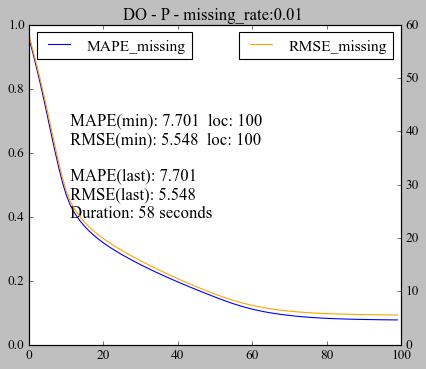

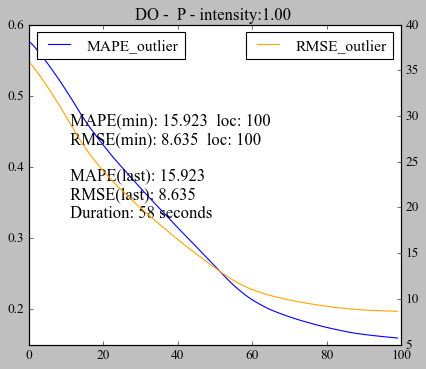

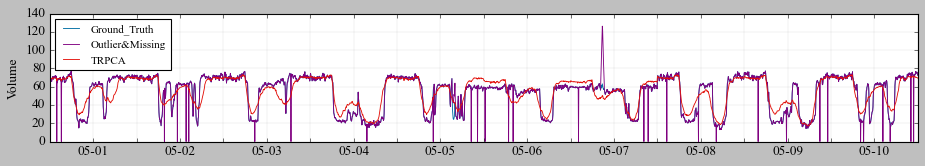

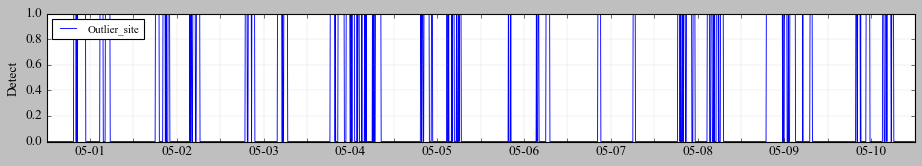

In [78]:
P_DO(0.01,1,1,10)

Iter: 100
MAPE_missing: 0.0770136
RMSE_missing: 5.54785
MAPE_outlier: 0.159234
RMSE_outlier: 8.63514
MAPE_no_missing_outlier: 0.0667969
RMSE_no_missing_outlier: 4.84627

Total iteration: 100
Tolerance: 0.000366378
Imputation MAPE_missing: 0.0770136
Imputation RMSE_missing: 5.54785
Imputation MAPE_outlier: 0.159234
Imputation RMSE_outlier: 8.63514
Imputation MAPE_no_missing_outlier: 0.0667969
Imputation RMSE_no_missing_outlier: 4.84627

Detect_rate: 100.000% 
False_Detect_rate: 6.962% 
Running time: 69 seconds


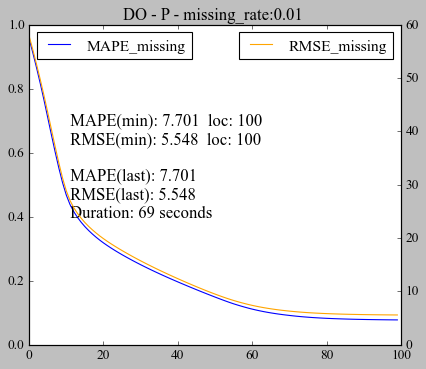

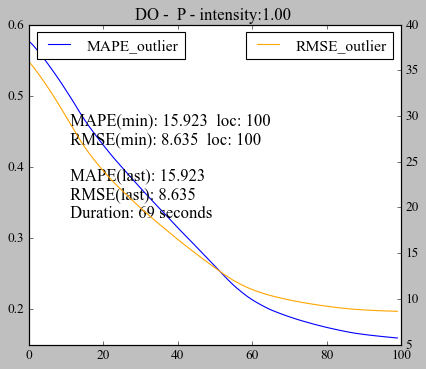

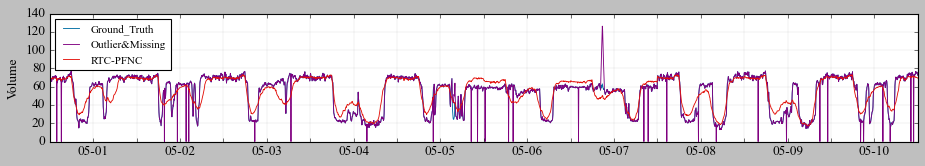

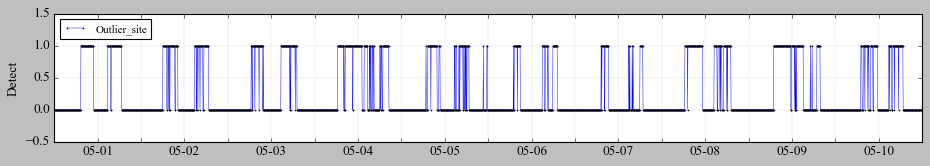

In [323]:
P_DO(0.01,1,1,10)#0.2

Iter: 100
MAPE_missing: 0.10028
RMSE_missing: 4.11133
MAPE_outlier: 0.103525
RMSE_outlier: 4.69484

Total iteration: 100
Tolerance: 0.0002079
Imputation MAPE_missing: 0.10028
Imputation RMSE_missing: 4.11133
Imputation MAPE_outlier: 0.103525
Imputation RMSE_outlier: 4.69484

Detect_rate: 51.000% 
False_Detect_rate: 5.955% 
Running time: 36 seconds


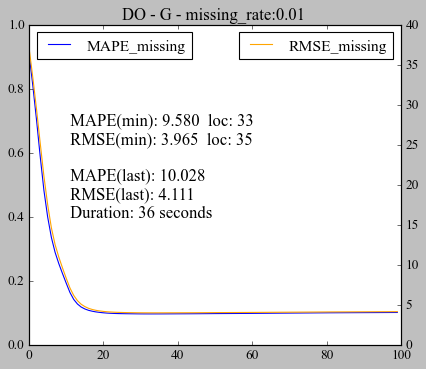

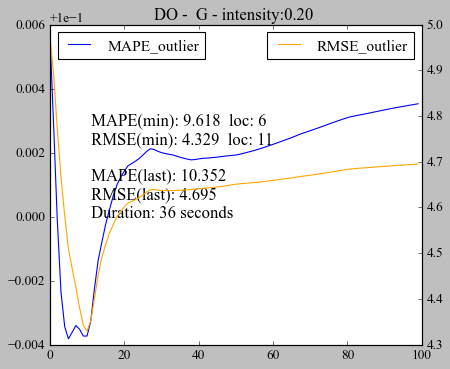

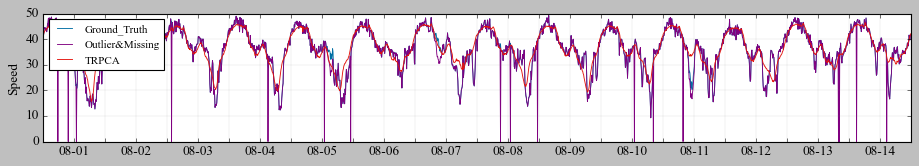

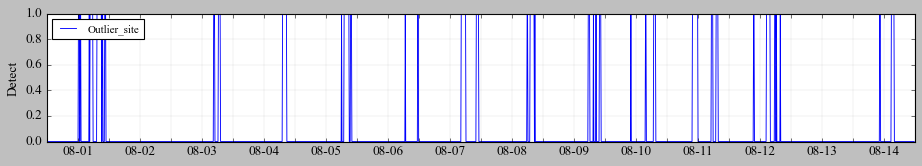

In [79]:
G_DO(0.01,0.2,3,10)

Iter: 100
MAPE_missing: 0.10028
RMSE_missing: 4.11133
MAPE_outlier: 0.103525
RMSE_outlier: 4.69484
MAPE_no_missing_outlier: 0.0974115
RMSE_no_missing_outlier: 4.05207

Total iteration: 100
Tolerance: 0.0002079
Imputation MAPE_missing: 0.10028
Imputation RMSE_missing: 4.11133
Imputation MAPE_outlier: 0.103525
Imputation RMSE_outlier: 4.69484
Imputation MAPE_no_missing_outlier: 0.0974115
Imputation RMSE_no_missing_outlier: 4.05207

Detect_rate: 90.000% 
False_Detect_rate: 9.398% 
Running time: 45 seconds


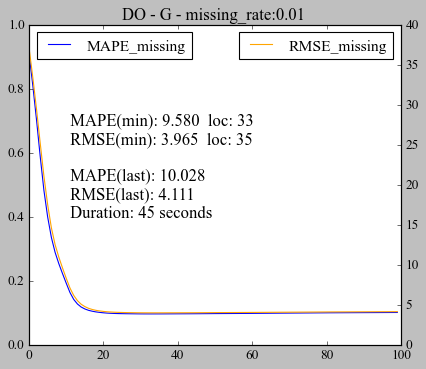

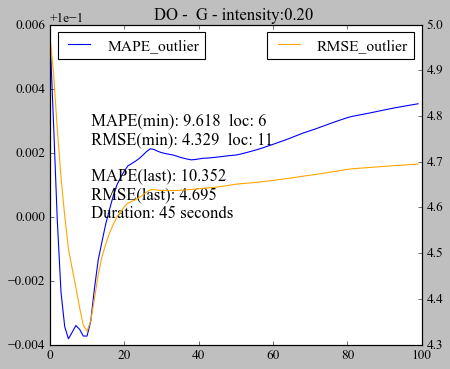

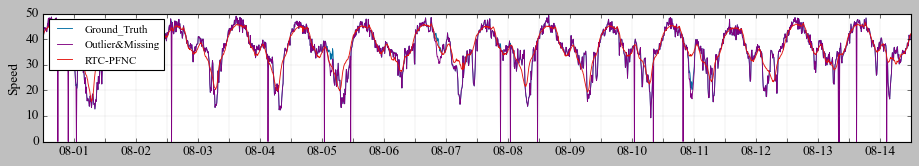

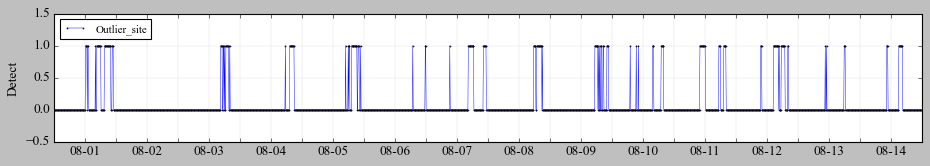

In [324]:
G_DO(0.01,0.2,3,10)#0.2

Iter: 100
MAPE_missing: 0.100277
RMSE_missing: 4.11134
MAPE_outlier: 0.10934
RMSE_outlier: 4.95877

Total iteration: 100
Tolerance: 0.000207932
Imputation MAPE_missing: 0.100277
Imputation RMSE_missing: 4.11134
Imputation MAPE_outlier: 0.10934
Imputation RMSE_outlier: 4.95877

Detect_rate: 95.000% 
False_Detect_rate: 5.955% 
Running time: 36 seconds


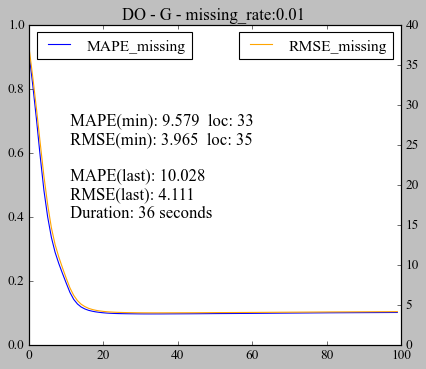

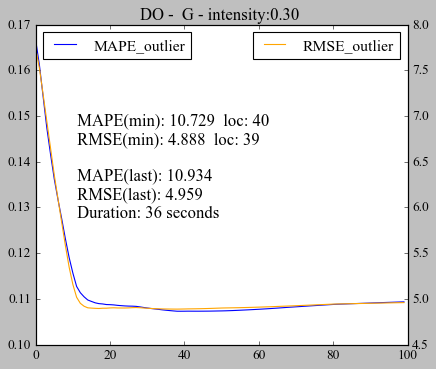

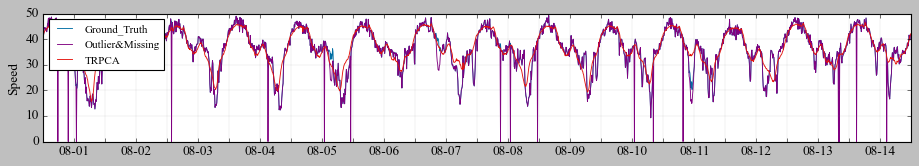

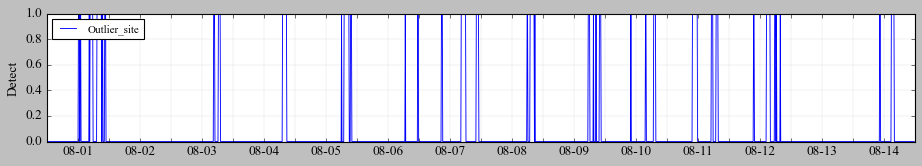

In [80]:
G_DO(0.01,0.3,2,10)

Iter: 100
MAPE_missing: 0.100277
RMSE_missing: 4.11134
MAPE_outlier: 0.10934
RMSE_outlier: 4.95877
MAPE_no_missing_outlier: 0.0974078
RMSE_no_missing_outlier: 4.05207

Total iteration: 100
Tolerance: 0.000207932
Imputation MAPE_missing: 0.100277
Imputation RMSE_missing: 4.11134
Imputation MAPE_outlier: 0.10934
Imputation RMSE_outlier: 4.95877
Imputation MAPE_no_missing_outlier: 0.0974078
Imputation RMSE_no_missing_outlier: 4.05207

Detect_rate: 100.000% 
False_Detect_rate: 9.398% 
Running time: 45 seconds


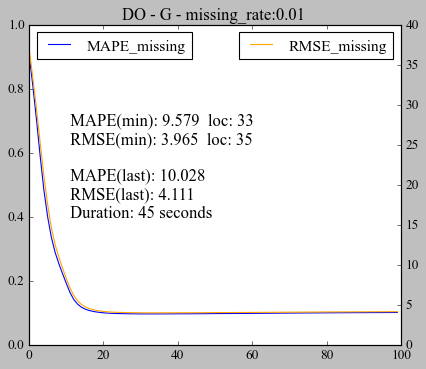

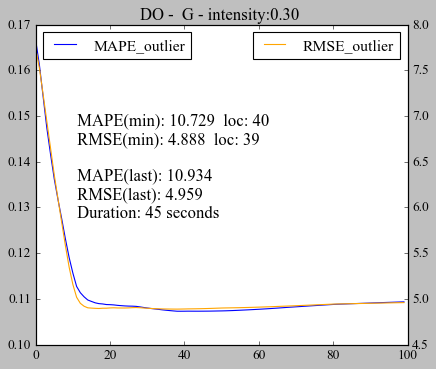

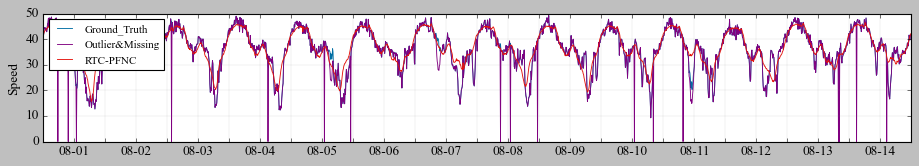

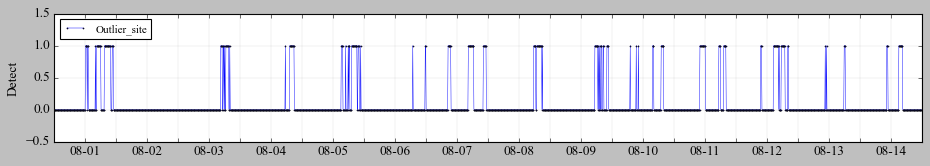

In [325]:
G_DO(0.01,0.3,2,10)#0.2

Iter: 100
MAPE_missing: 0.100271
RMSE_missing: 4.11128
MAPE_outlier: 0.0970887
RMSE_outlier: 4.76318

Total iteration: 100
Tolerance: 0.000207892
Imputation MAPE_missing: 0.100271
Imputation RMSE_missing: 4.11128
Imputation MAPE_outlier: 0.0970887
Imputation RMSE_outlier: 4.76318

Detect_rate: 97.000% 
False_Detect_rate: 5.957% 
Running time: 36 seconds


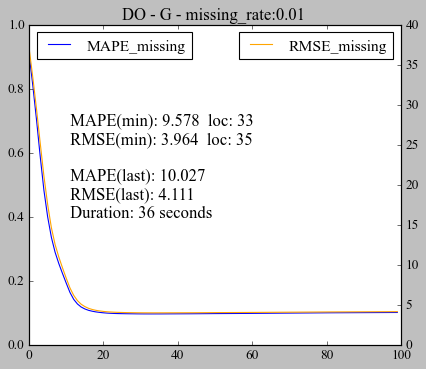

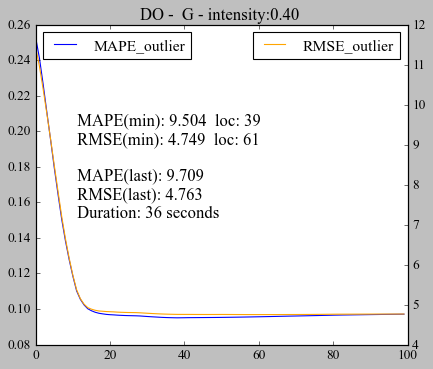

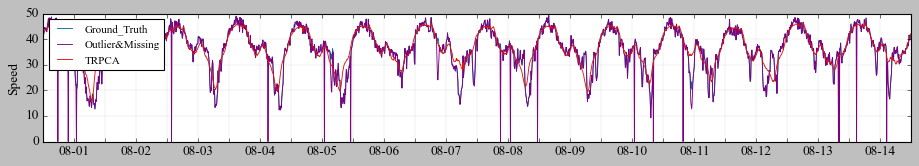

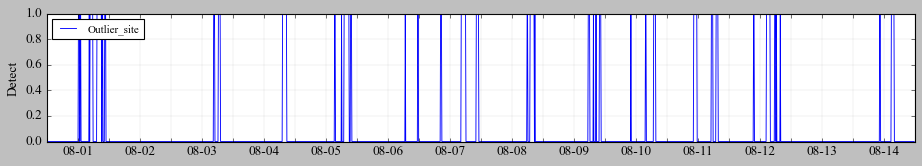

In [81]:
G_DO(0.01,0.4,1,10)

Iter: 100
MAPE_missing: 0.100271
RMSE_missing: 4.11128
MAPE_outlier: 0.0970887
RMSE_outlier: 4.76318
MAPE_no_missing_outlier: 0.0974145
RMSE_no_missing_outlier: 4.05253

Total iteration: 100
Tolerance: 0.000207892
Imputation MAPE_missing: 0.100271
Imputation RMSE_missing: 4.11128
Imputation MAPE_outlier: 0.0970887
Imputation RMSE_outlier: 4.76318
Imputation MAPE_no_missing_outlier: 0.0974145
Imputation RMSE_no_missing_outlier: 4.05253

Detect_rate: 100.000% 
False_Detect_rate: 9.401% 
Running time: 45 seconds


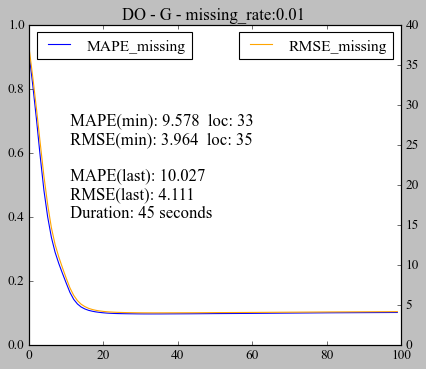

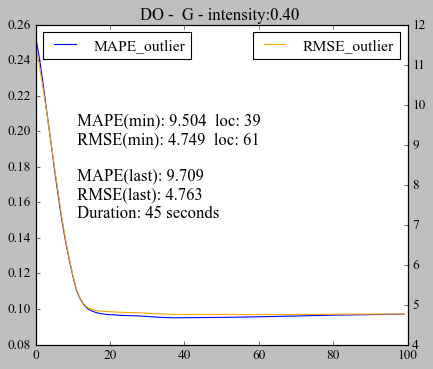

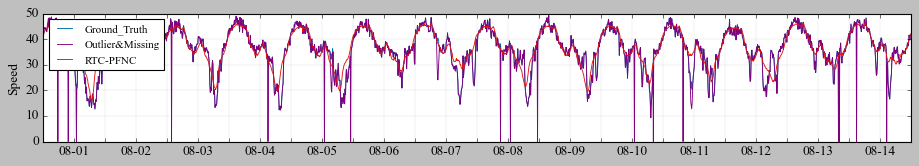

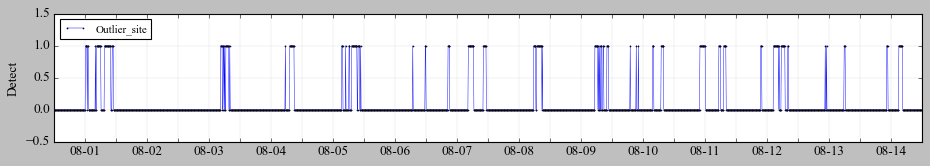

In [326]:
G_DO(0.01,0.4,1,10)#0.2

### 拥堵（各种原因）

Iter: 100
MAPE_missing: 0.0769828
RMSE_missing: 5.55056
MAPE_outlier: 0.137119
RMSE_outlier: 7.8984

Total iteration: 100
Tolerance: 0.000364563
Imputation MAPE_missing: 0.0769828
Imputation RMSE_missing: 5.55056
Imputation MAPE_outlier: 0.137119
Imputation RMSE_outlier: 7.8984

Detect_rate: 87.000% 
False_Detect_rate: 4.292% 
Running time: 58 seconds


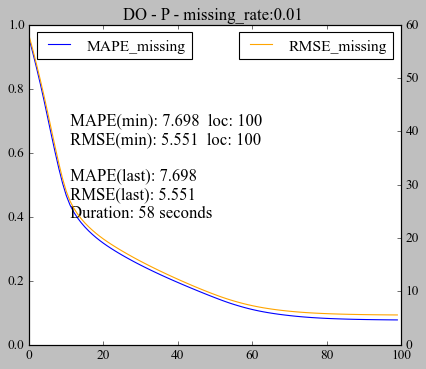

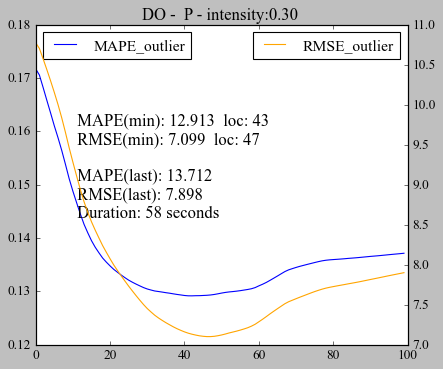

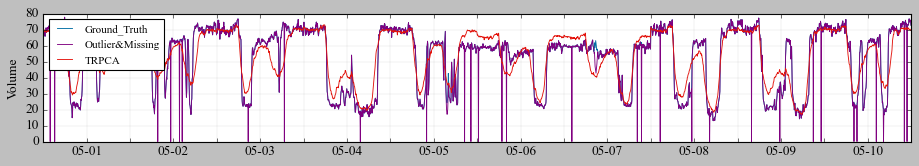

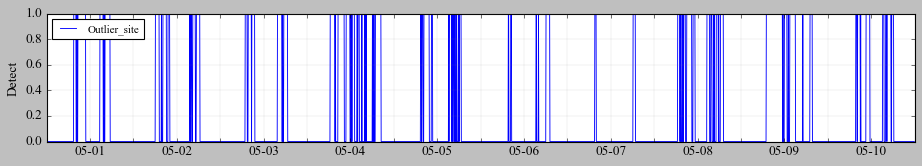

In [86]:
P_DO(0.01,0.3,1,10)

Iter: 100
MAPE_missing: 0.0769828
RMSE_missing: 5.55056
MAPE_outlier: 0.137119
RMSE_outlier: 7.8984
MAPE_no_missing_outlier: 0.0668446
RMSE_no_missing_outlier: 4.85048

Total iteration: 100
Tolerance: 0.000364563
Imputation MAPE_missing: 0.0769828
Imputation RMSE_missing: 5.55056
Imputation MAPE_outlier: 0.137119
Imputation RMSE_outlier: 7.8984
Imputation MAPE_no_missing_outlier: 0.0668446
Imputation RMSE_no_missing_outlier: 4.85048

Detect_rate: 95.000% 
False_Detect_rate: 6.967% 
Running time: 70 seconds


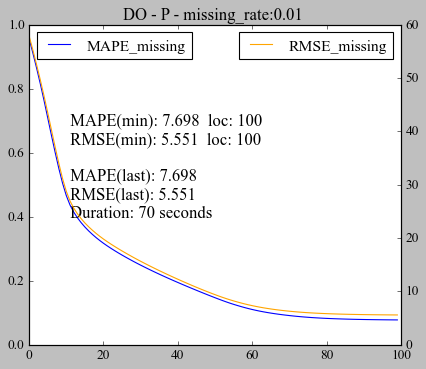

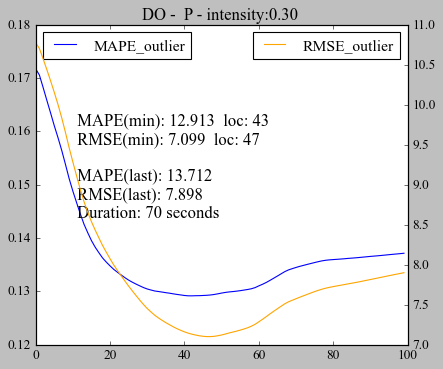

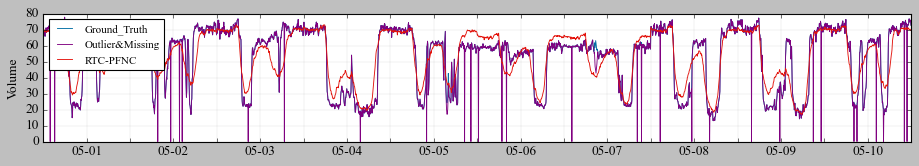

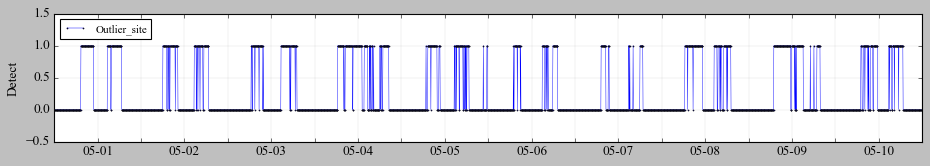

In [333]:
P_DO(0.01,0.3,1,10)#0.2

Iter: 100
MAPE_missing: 0.0769928
RMSE_missing: 5.55066
MAPE_outlier: 0.142136
RMSE_outlier: 8.09966

Total iteration: 100
Tolerance: 0.000364944
Imputation MAPE_missing: 0.0769928
Imputation RMSE_missing: 5.55066
Imputation MAPE_outlier: 0.142136
Imputation RMSE_outlier: 8.09966

Detect_rate: 99.000% 
False_Detect_rate: 4.289% 
Running time: 58 seconds


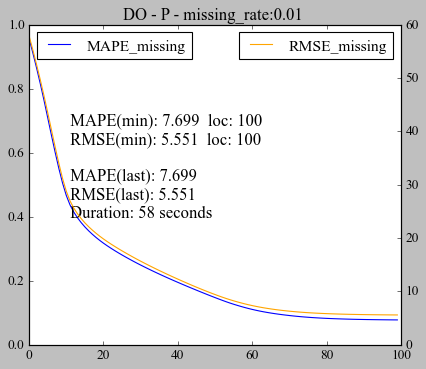

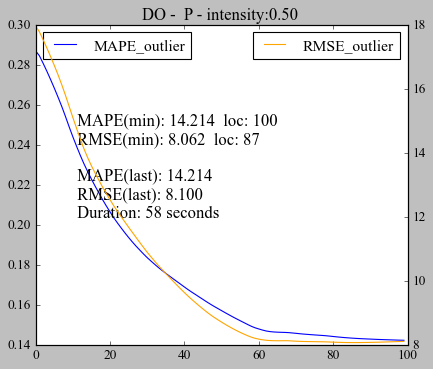

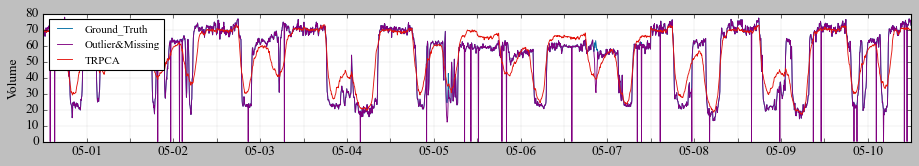

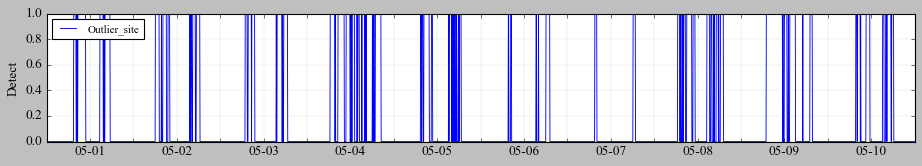

In [87]:
P_DO(0.01,0.5,1,10)

Iter: 100
MAPE_missing: 0.0769928
RMSE_missing: 5.55066
MAPE_outlier: 0.142136
RMSE_outlier: 8.09966
MAPE_no_missing_outlier: 0.0668274
RMSE_no_missing_outlier: 4.84928

Total iteration: 100
Tolerance: 0.000364944
Imputation MAPE_missing: 0.0769928
Imputation RMSE_missing: 5.55066
Imputation MAPE_outlier: 0.142136
Imputation RMSE_outlier: 8.09966
Imputation MAPE_no_missing_outlier: 0.0668274
Imputation RMSE_no_missing_outlier: 4.84928

Detect_rate: 100.000% 
False_Detect_rate: 6.965% 
Running time: 69 seconds


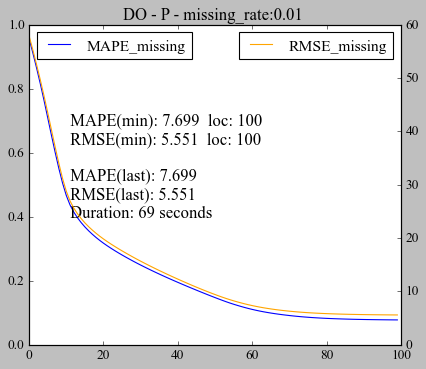

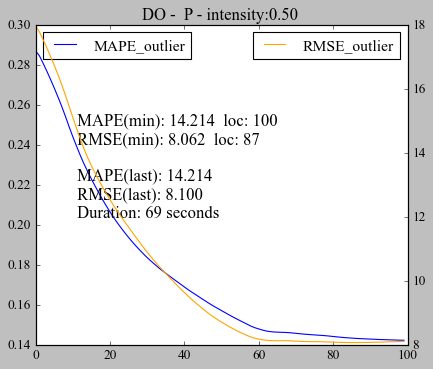

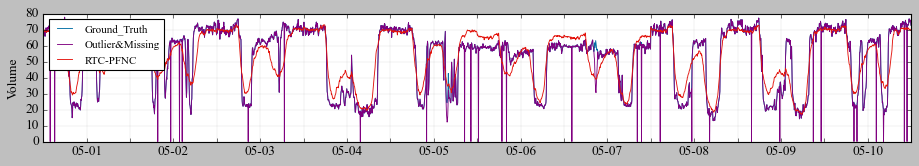

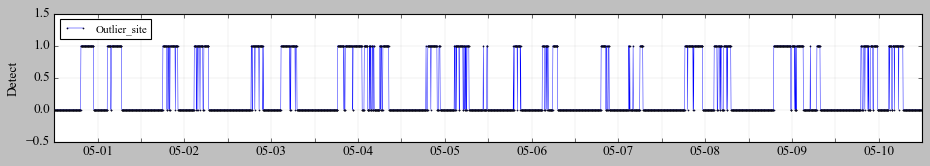

In [334]:
P_DO(0.01,0.5,1,10)#0.2

Iter: 100
MAPE_missing: 0.0770089
RMSE_missing: 5.55079
MAPE_outlier: 0.148136
RMSE_outlier: 8.3699

Total iteration: 100
Tolerance: 0.00036554
Imputation MAPE_missing: 0.0770089
Imputation RMSE_missing: 5.55079
Imputation MAPE_outlier: 0.148136
Imputation RMSE_outlier: 8.3699

Detect_rate: 100.000% 
False_Detect_rate: 4.287% 
Running time: 58 seconds


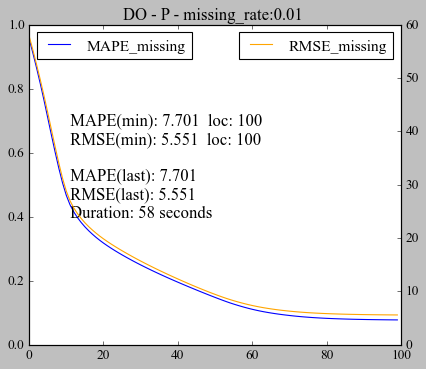

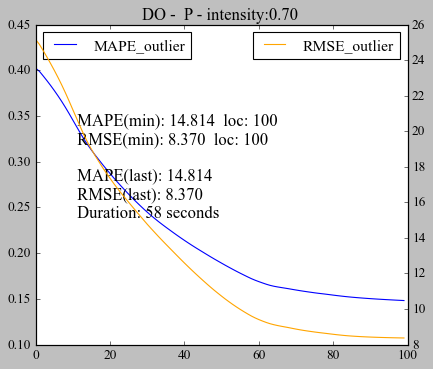

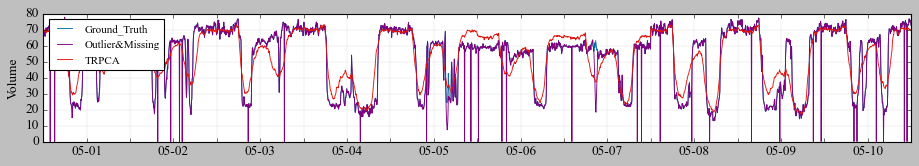

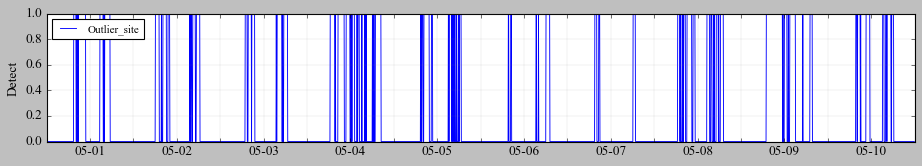

In [88]:
P_DO(0.01,0.7,1,10)

Iter: 100
MAPE_missing: 0.0770089
RMSE_missing: 5.55079
MAPE_outlier: 0.148136
RMSE_outlier: 8.3699
MAPE_no_missing_outlier: 0.0668057
RMSE_no_missing_outlier: 4.84764

Total iteration: 100
Tolerance: 0.00036554
Imputation MAPE_missing: 0.0770089
Imputation RMSE_missing: 5.55079
Imputation MAPE_outlier: 0.148136
Imputation RMSE_outlier: 8.3699
Imputation MAPE_no_missing_outlier: 0.0668057
Imputation RMSE_no_missing_outlier: 4.84764

Detect_rate: 100.000% 
False_Detect_rate: 6.962% 
Running time: 69 seconds


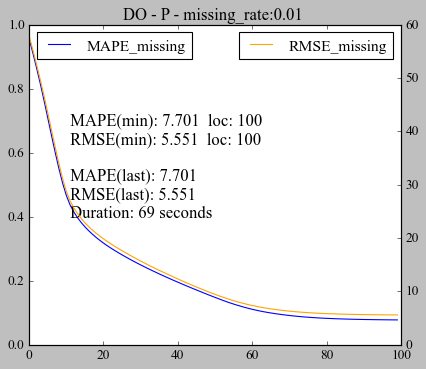

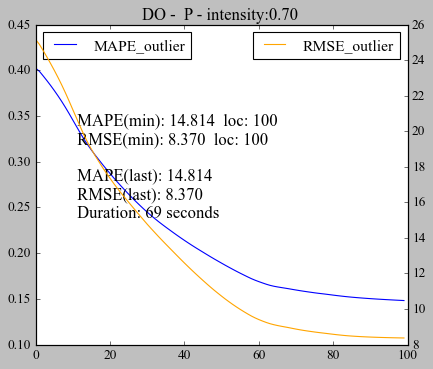

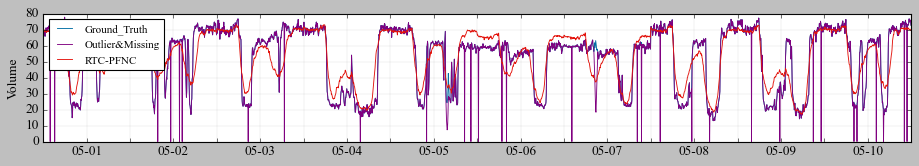

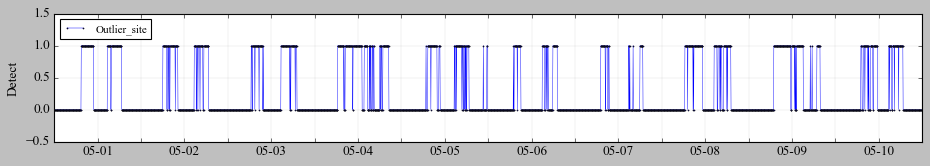

In [335]:
P_DO(0.01,0.7,1,10)#0.2

Iter: 100
MAPE_missing: 0.100272
RMSE_missing: 4.11129
MAPE_outlier: 0.0975863
RMSE_outlier: 4.78584

Total iteration: 100
Tolerance: 0.000207922
Imputation MAPE_missing: 0.100272
Imputation RMSE_missing: 4.11129
Imputation MAPE_outlier: 0.0975863
Imputation RMSE_outlier: 4.78584

Detect_rate: 100.000% 
False_Detect_rate: 5.957% 
Running time: 36 seconds


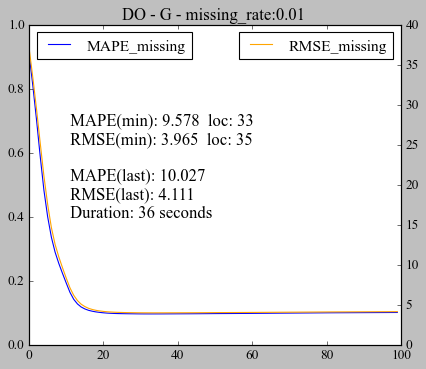

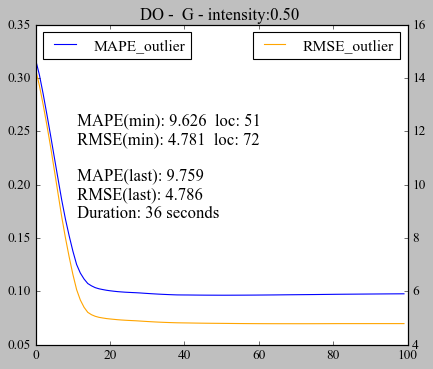

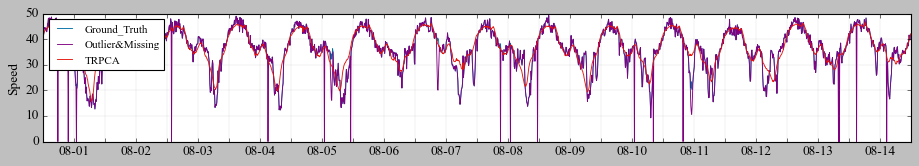

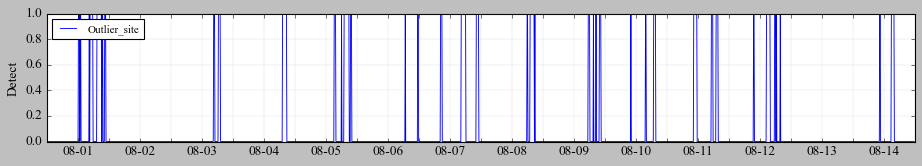

In [89]:
G_DO(0.01,0.5,1,10)

Iter: 100
MAPE_missing: 0.100272
RMSE_missing: 4.11129
MAPE_outlier: 0.0975863
RMSE_outlier: 4.78584
MAPE_no_missing_outlier: 0.0974138
RMSE_no_missing_outlier: 4.0525

Total iteration: 100
Tolerance: 0.000207922
Imputation MAPE_missing: 0.100272
Imputation RMSE_missing: 4.11129
Imputation MAPE_outlier: 0.0975863
Imputation RMSE_outlier: 4.78584
Imputation MAPE_no_missing_outlier: 0.0974138
Imputation RMSE_no_missing_outlier: 4.0525

Detect_rate: 100.000% 
False_Detect_rate: 9.400% 
Running time: 44 seconds


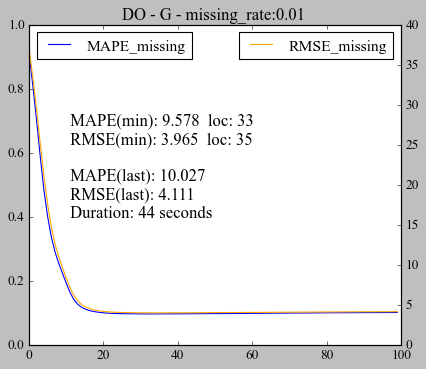

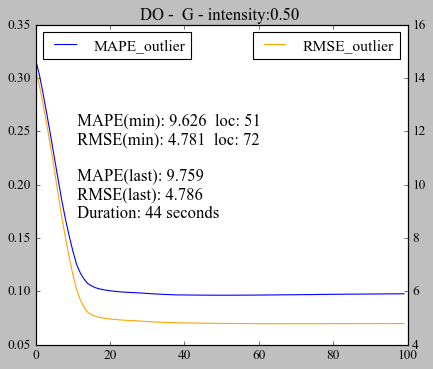

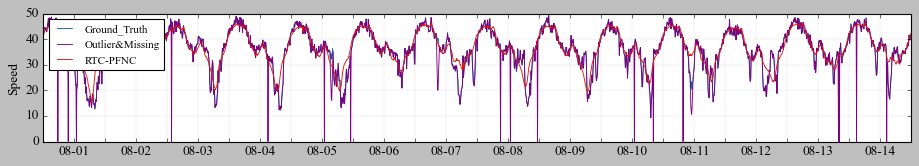

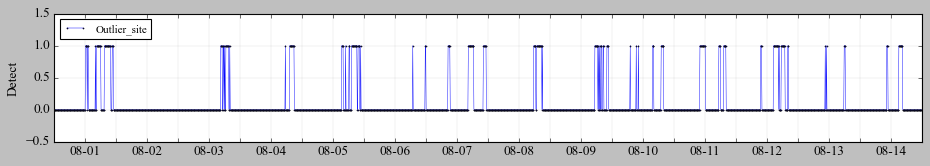

In [336]:
G_DO(0.01,0.5,1,10)#0.2

Iter: 100
MAPE_missing: 0.100273
RMSE_missing: 4.11132
MAPE_outlier: 0.0980039
RMSE_outlier: 4.80548

Total iteration: 100
Tolerance: 0.000207965
Imputation MAPE_missing: 0.100273
Imputation RMSE_missing: 4.11132
Imputation MAPE_outlier: 0.0980039
Imputation RMSE_outlier: 4.80548

Detect_rate: 100.000% 
False_Detect_rate: 5.957% 
Running time: 36 seconds


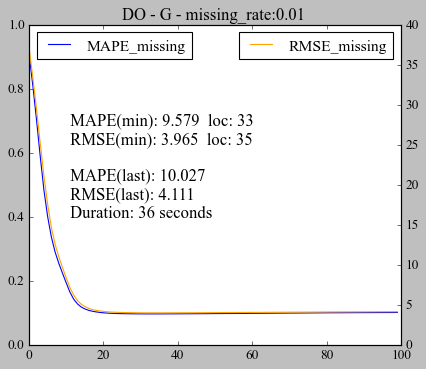

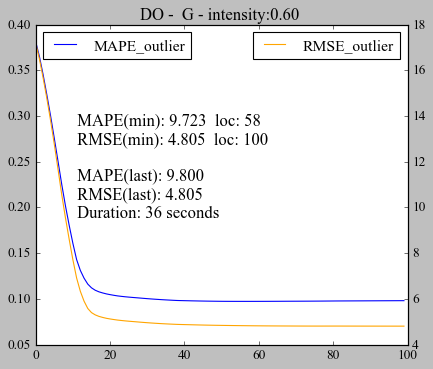

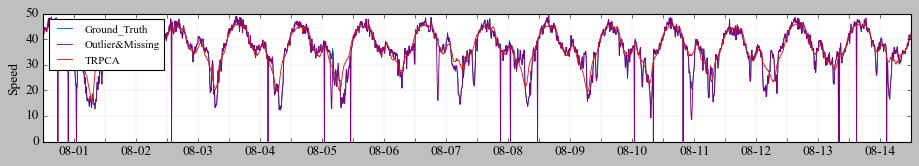

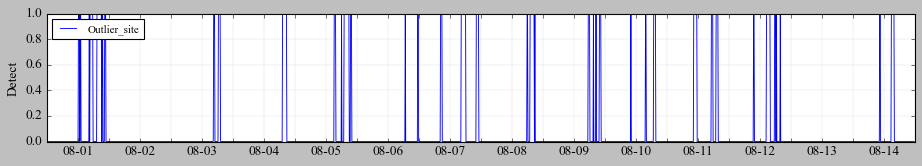

In [90]:
G_DO(0.01,0.6,1,10)

Iter: 100
MAPE_missing: 0.100273
RMSE_missing: 4.11132
MAPE_outlier: 0.0980039
RMSE_outlier: 4.80548
MAPE_no_missing_outlier: 0.0974131
RMSE_no_missing_outlier: 4.05247

Total iteration: 100
Tolerance: 0.000207965
Imputation MAPE_missing: 0.100273
Imputation RMSE_missing: 4.11132
Imputation MAPE_outlier: 0.0980039
Imputation RMSE_outlier: 4.80548
Imputation MAPE_no_missing_outlier: 0.0974131
Imputation RMSE_no_missing_outlier: 4.05247

Detect_rate: 100.000% 
False_Detect_rate: 9.400% 
Running time: 44 seconds


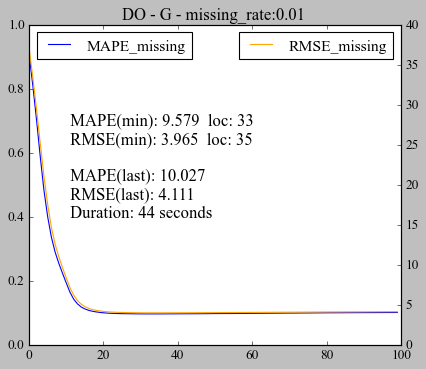

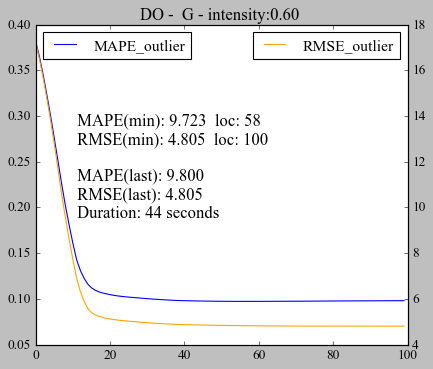

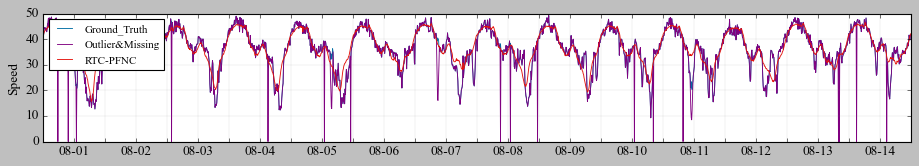

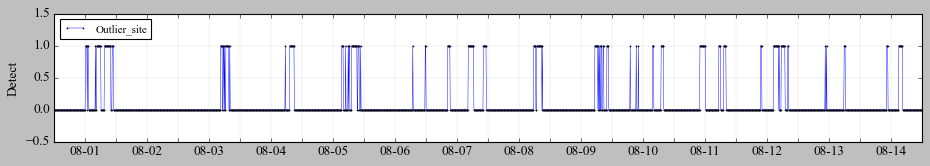

In [337]:
G_DO(0.01,0.6,1,10)#0.2

Iter: 100
MAPE_missing: 0.100273
RMSE_missing: 4.11132
MAPE_outlier: 0.0984553
RMSE_outlier: 4.82547

Total iteration: 100
Tolerance: 0.000208017
Imputation MAPE_missing: 0.100273
Imputation RMSE_missing: 4.11132
Imputation MAPE_outlier: 0.0984553
Imputation RMSE_outlier: 4.82547

Detect_rate: 100.000% 
False_Detect_rate: 5.957% 
Running time: 36 seconds


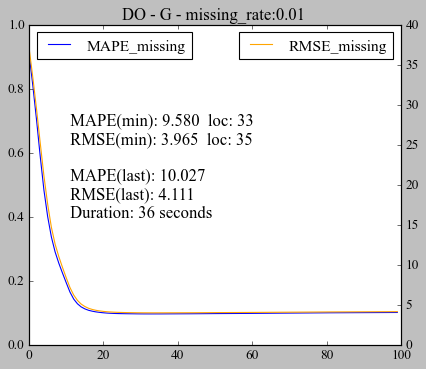

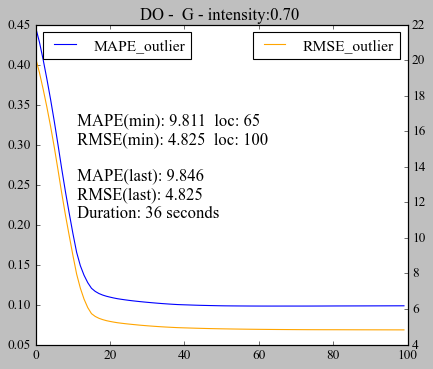

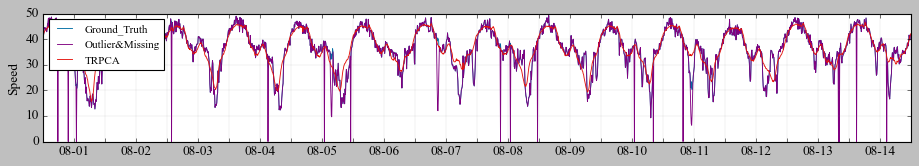

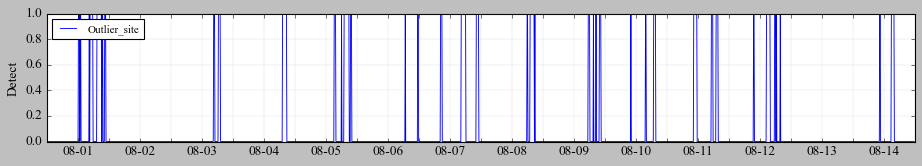

In [91]:
G_DO(0.01,0.7,1,10)

Iter: 100
MAPE_missing: 0.100273
RMSE_missing: 4.11132
MAPE_outlier: 0.0984553
RMSE_outlier: 4.82547
MAPE_no_missing_outlier: 0.0974127
RMSE_no_missing_outlier: 4.05245

Total iteration: 100
Tolerance: 0.000208017
Imputation MAPE_missing: 0.100273
Imputation RMSE_missing: 4.11132
Imputation MAPE_outlier: 0.0984553
Imputation RMSE_outlier: 4.82547
Imputation MAPE_no_missing_outlier: 0.0974127
Imputation RMSE_no_missing_outlier: 4.05245

Detect_rate: 100.000% 
False_Detect_rate: 9.400% 
Running time: 44 seconds


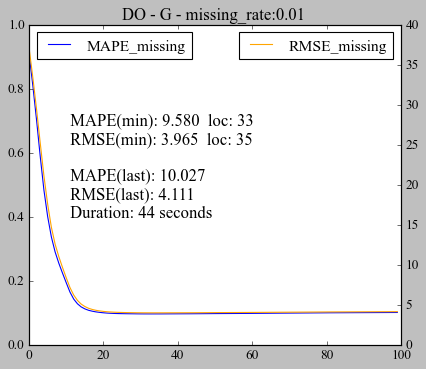

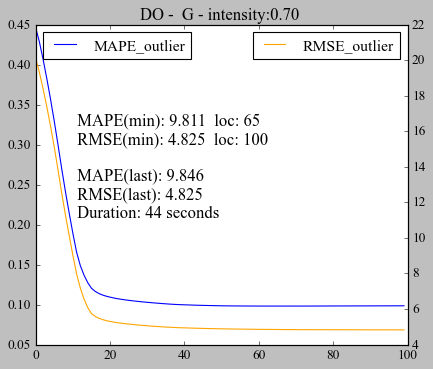

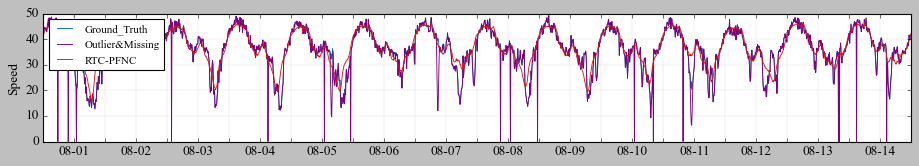

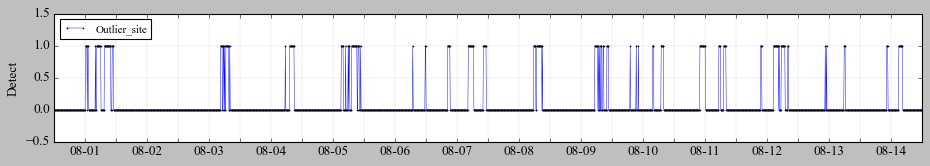

In [338]:
G_DO(0.01,0.7,1,10)#0.2

## 场景3

In [352]:
def add_outlier_3storder(ground_dense_tensor, duration, frequency, dataset):
 
    random.seed(1000)
    dim = ground_dense_tensor.shape
    corrsparse_tensor = ground_dense_tensor.copy()
    outlier_time=[]
    
    if dataset == 1:
        outlier_day = random.sample(range(0, dim[2]),frequency)
        outlier_hour = random.choices(range(0,int(dim[1]-duration*12)),k=frequency)
        #outlier_sensor = random.sample(range(0,dim[0]),spoil_num)
        duration_len = duration*12
        #for i in range(len(outlier_sensor)):
        for j in range(len(outlier_day)):
            corrsparse_tensor[0,outlier_hour[j]:outlier_hour[j]+duration_len,outlier_day[j]]=0
            outlier_time.append([outlier_hour[j],duration_len,outlier_day[j]])
        
    if dataset == 2:
        outlier_day = random.sample(range(0, dim[2]),frequency)
        outlier_hour = random.choices(range(0,int(dim[1]-duration*6)),k=frequency)
        #outlier_sensor = random.sample(range(0,dim[0]),spoil_num)
        duration_len = duration*6
        #for i in range(len(outlier_sensor)):
        for j in range(len(outlier_day)):
            corrsparse_tensor[0,outlier_hour[j]:outlier_hour[j]+duration_len,outlier_day[j]]=0   
            outlier_time.append([outlier_hour[j],duration_len,outlier_day[j]])
            
    outlier_time = np.array(outlier_time)
    
    return corrsparse_tensor,outlier_time
    

In [416]:
def plot_outlier_site2(outlier_sparse_tensor,L,dataset,outlier_time,pos_outlier,pos_missing,threshold):
    outlier_time_dim = outlier_time.shape
    dim = np.array(outlier_sparse_tensor.shape)
    P = np.zeros(dim)
    P2 = np.zeros(dim)
    P3 = np.zeros(dim)
    P4 = np.zeros(dim)
    P3[pos_outlier] = 1
    pos_nonoutlier = np.where(P3 != 1)
    P4[pos_missing] = 1
    pos_nonmissing = np.where(P4 != 1)
    P2[pos_nonmissing] = np.abs(outlier_sparse_tensor[pos_nonmissing]-L[pos_nonmissing])/L[pos_nonmissing]
    pos_outlier_site = np.where(P2>threshold)
    P[pos_outlier_site] = 1
    TP,FN=0,0
    detect_num = 0
    for i in range(1):
    #for i in range(dim[0]):
        for j in range(outlier_time_dim[0]):
            flag = 0 
            for k in range(outlier_time[0,1]):
                if P[i,outlier_time[j,0]+k,outlier_time[j,2]] == 1:
                    flag = 1
                    TP += 1
                elif P[i,outlier_time[j,0]+k,outlier_time[j,2]] == 0:
                    FN += 1
            if flag == 1:
                detect_num += 1
    FP = np.sum(P[pos_nonoutlier]==1)
    Precision = TP/(TP+FP)
    Recall = TP/(TP+FN)
    F1_Score = 2*Precision*Recall/(Precision+Recall)
    detect_rate =  detect_num/(1*outlier_time_dim[0])
    #detect_rate =  detect_num/(dim[0]*outlier_time_dim[0])
    false_detect_rate = FP/(np.sum(P[pos_nonmissing]>=0)-np.sum(P[pos_outlier]>=0))
    print('Detect_rate: %.3f%% '%(detect_rate*100))
    print('False_Detect_rate: %.3f%% '%(false_detect_rate*100))
    print('Precision: %.3f%% '%(Precision*100))
    print('Recall: %.3f%% '%(Recall*100))
    print('F1_Score: %.3f'%(F1_Score))
    
    P = P.swapaxes(1,2)   
    fig = plt.figure(figsize=(14,2))
    if dataset == 1:
        P = P.reshape([dim[0],dim[1]*dim[2]])[0,0:2880]
    elif dataset == 2:
        P = P.reshape([dim[0],dim[1]*dim[2]])[0,0:2016]
    plt.rc('font',family='Times New Roman')
    plt.subplot(111)
    plt.plot(P,'o',color='blue',markersize=1, linestyle='-',linewidth=0.4,label='Outlier_site')
    plt.ylim(-0.5,1.5)
    if dataset == 1:
        plt.xlim(0,2880)
        plt.xticks(np.arange(0, 10*288+144, 144),["","05-01", "","05-02","", "05-03", "","05-04","","05-07","","05-08",
                                                     "","05-09","","05-10","","05-11","","05-14",""])
        plt.ylabel('Detect')
    elif dataset == 2:
        plt.xlim(0,2016)
        plt.xticks(np.arange(0, 14*144+72, 72),["","08-01","", "08-02","", "08-03","", "08-04","",
                    "08-05", "","08-06", "","08-07","", "08-08","","08-09","","08-10","","08-11","","08-12","","08-13","","08-14",""])
        plt.ylabel('Detect')
    plt.grid(color='gray', linestyle='-', linewidth=0.2, alpha=0.5)
    plt.legend(loc='upper left',fontsize=10)

In [359]:
def G_NM_(ms,duration,frequency):
    ''' ms: missing_rate '''
    ground_dense_tensor = scipy.io.loadmat('../datasets/Guangzhou-data-set/tensor.mat')['tensor']
    random_tensor = scipy.io.loadmat('../datasets/Guangzhou-data-set/random_tensor.mat')['random_tensor']
    dataset = 2
    
    ground_dense_tensor = ground_dense_tensor.swapaxes(1,2)
    random_tensor = random_tensor.swapaxes(1,2)
    
    outlier_tensor,outlier_time = add_outlier_3storder(ground_dense_tensor,duration,frequency,dataset)
    dis_tensor = outlier_tensor - ground_dense_tensor
    binary_tensor = np.round(random_tensor + 0.5 - ms)
    outlier_sparse_tensor = np.multiply(outlier_tensor, binary_tensor)
    
    pos_outlier = np.where(dis_tensor != 0)
    pos_test_outlier = pos_outlier
    pos_missing = np.where((outlier_sparse_tensor == 0) & (dis_tensor == 0))
    pos_test_missing = np.where((ground_dense_tensor != 0) & (outlier_sparse_tensor == 0) & (dis_tensor == 0))
    pos_no_missing_outlier = np.where(outlier_sparse_tensor != 0)
    
    import time
    start = time.time()

    ρ = 1e-5
    λ = 1e-6
    ε = np.ones(3) * 1e-6
    α = np.ones(3) / 3
    tol = 1e-6
    K = 100
    
    #alpha = 200
    #rho = 1.01
    #dim1, dim2, dim3 = outlier_tensor.shape
    #beta = alpha / np.sqrt(max(dim1, dim2) * dim3)
    #maxiter = 100
    
    threshold = 0.2
    tensor_hat_np, E, MAPE_missing, RMSE_missing,MAPE_outlier,RMSE_outlier,MAPE_no_missing_outlier,RMSE_no_missing_outlier = RLRTC_PFNC(ground_dense_tensor, outlier_sparse_tensor, ρ, λ, ε, α,
                                                                            tol, K, pos_missing, pos_test_missing, pos_test_outlier,pos_no_missing_outlier)
    #tensor_hat_np,E,MAPE_missing,RMSE_missing,MAPE_outlier,RMSE_outlier= trpca(ground_dense_tensor, outlier_sparse_tensor, dis_tensor,alpha, beta, rho, maxiter,pos_missing, pos_test_missing , pos_test_outlier)
    end = time.time()
    plot_missing(RMSE_missing, MAPE_missing, 'G', ms, 'NM', end - start)
    plot_outlier(RMSE_outlier, MAPE_outlier, ' G', 0, 'NM', end - start)
    plot_time_series(ground_dense_tensor,outlier_tensor,outlier_sparse_tensor,tensor_hat_np,dataset)
    plot_outlier_site2(outlier_sparse_tensor,tensor_hat_np,dataset,outlier_time,pos_outlier,pos_missing,threshold)
    print('Running time: %d seconds'%(end - start))

In [360]:
def P_NM_(ms,duration,frequency):
    ''' ms: missing_rate '''
    ground_mat = np.load('../datasets/PeMS-data-set/pems.npy')
    random_tensor = np.load('../datasets/PeMS-data-set/random_tensor.npy')
    ground_dense_tensor = mat2ten(ground_mat, np.array(random_tensor.shape), 0)
    dataset = 1
    
    outlier_tensor,outlier_time = add_outlier_3storder(ground_dense_tensor,duration,frequency,dataset)
    dis_tensor = outlier_tensor - ground_dense_tensor
    binary_tensor = np.round(random_tensor + 0.5 - ms)
    outlier_sparse_tensor = np.multiply(outlier_tensor, binary_tensor)
    
    pos_outlier = np.where(dis_tensor != 0)
    pos_test_outlier = pos_outlier
    pos_missing = np.where((outlier_sparse_tensor == 0) & (dis_tensor == 0))
    pos_test_missing = np.where((ground_dense_tensor != 0) & (outlier_sparse_tensor == 0) & (dis_tensor == 0))
    pos_no_missing_outlier = np.where(outlier_sparse_tensor != 0)
    
    import time
    start = time.time()

    ρ = 1e-5
    λ = 1e-6
    ε = np.ones(3) * 1e-6
    α = np.ones(3) / 3
    tol = 1e-6
    K = 100
    
    #alpha = 200
    #rho = 1.01
    #dim1, dim2, dim3 = outlier_tensor.shape
    #beta = alpha / np.sqrt(max(dim1, dim2) * dim3)
    #maxiter = 100
    
    threshold = 0.2
    tensor_hat_np, E, MAPE_missing, RMSE_missing,MAPE_outlier,RMSE_outlier,MAPE_no_missing_outlier,RMSE_no_missing_outlier = RLRTC_PFNC(ground_dense_tensor, outlier_sparse_tensor, ρ, λ, ε, α,
                                                                            tol, K, pos_missing, pos_test_missing, pos_test_outlier,pos_no_missing_outlier)
    #tensor_hat_np,E,MAPE_missing,RMSE_missing,MAPE_outlier,RMSE_outlier= trpca(ground_dense_tensor, outlier_sparse_tensor, dis_tensor,alpha, beta, rho, maxiter,pos_missing, pos_test_missing , pos_test_outlier)
    end = time.time()
    plot_missing(RMSE_missing, MAPE_missing, 'P', ms, 'NM', end - start)
    plot_outlier(RMSE_outlier, MAPE_outlier, ' P', 0 , 'NM', end - start)
    plot_time_series(ground_dense_tensor,outlier_tensor,outlier_sparse_tensor,tensor_hat_np,dataset)
    plot_outlier_site2(outlier_sparse_tensor,tensor_hat_np,dataset,outlier_time,pos_outlier,pos_missing,threshold)
    print('Running time: %d seconds'%(end - start))

### 数据缺失

Iter: 100
MAPE_missing: 0.0769336
RMSE_missing: 5.54869
MAPE_outlier: 0.191722
RMSE_outlier: 12.6401

Total iteration: 100
Tolerance: 0.000365665
Imputation MAPE_missing: 0.0769336
Imputation RMSE_missing: 5.54869
Imputation MAPE_outlier: 0.191722
Imputation RMSE_outlier: 12.6401

Detect_rate: 100.000% 
False_Detect_rate: 3.419% 
Running time: 59 seconds


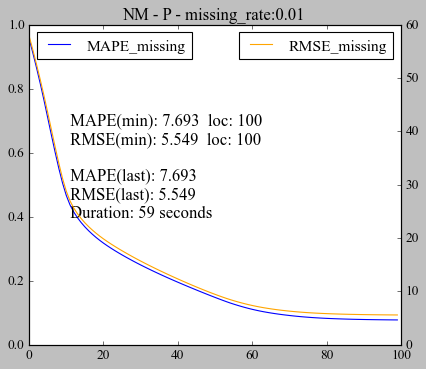

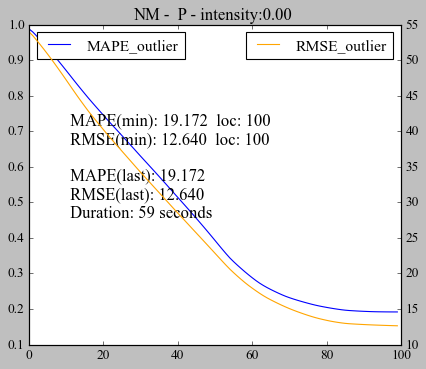

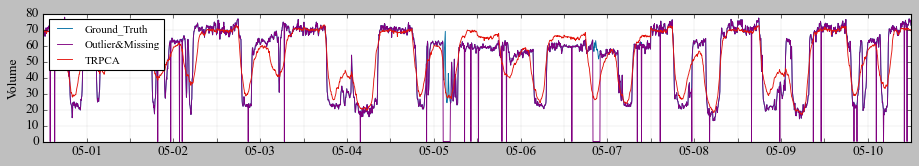

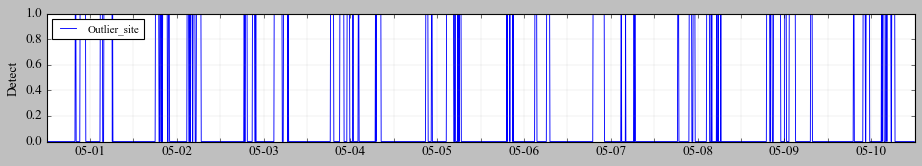

In [100]:
P_NM_(0.01,2,10)

Iter: 100
MAPE_missing: 0.0769336
RMSE_missing: 5.54869
MAPE_outlier: 0.191722
RMSE_outlier: 12.6401
MAPE_no_missing_outlier: 0.0668213
RMSE_no_missing_outlier: 4.84992

Total iteration: 100
Tolerance: 0.000365665
Imputation MAPE_missing: 0.0769336
Imputation RMSE_missing: 5.54869
Imputation MAPE_outlier: 0.191722
Imputation RMSE_outlier: 12.6401
Imputation MAPE_no_missing_outlier: 0.0668213
Imputation RMSE_no_missing_outlier: 4.84992

Detect_rate: 100.000% 
False_Detect_rate: 6.655% 
Running time: 69 seconds


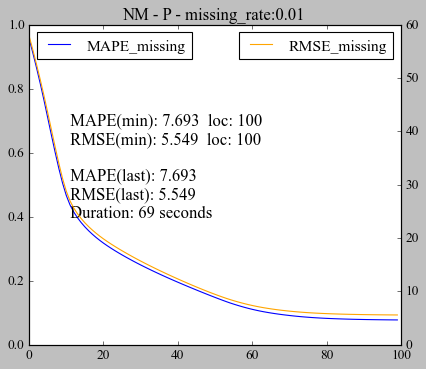

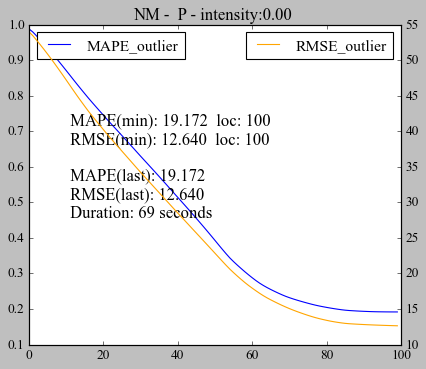

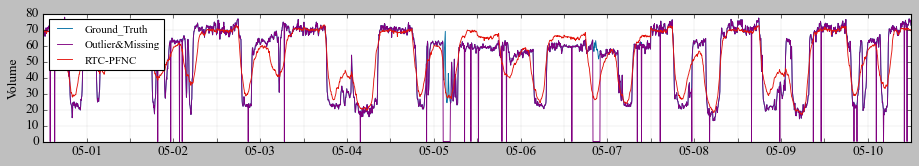

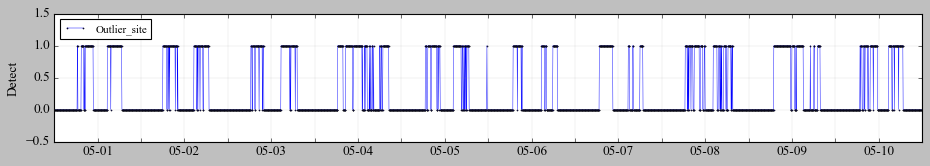

In [361]:
P_NM_(0.01,2,10)#0.2

Iter: 100
MAPE_missing: 0.0769487
RMSE_missing: 5.54999
MAPE_outlier: 0.240252
RMSE_outlier: 16.6888

Total iteration: 100
Tolerance: 0.000367693
Imputation MAPE_missing: 0.0769487
Imputation RMSE_missing: 5.54999
Imputation MAPE_outlier: 0.240252
Imputation RMSE_outlier: 16.6888

Detect_rate: 100.000% 
False_Detect_rate: 3.418% 
Running time: 58 seconds


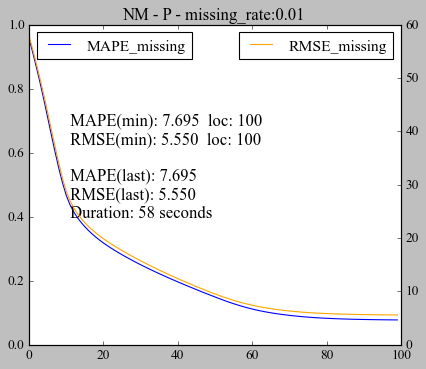

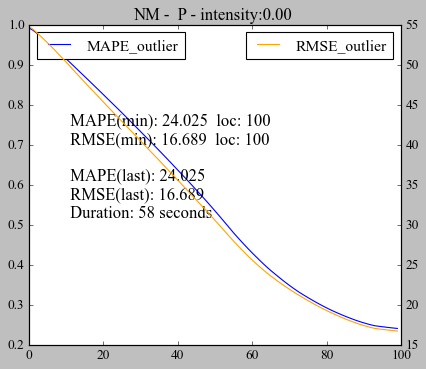

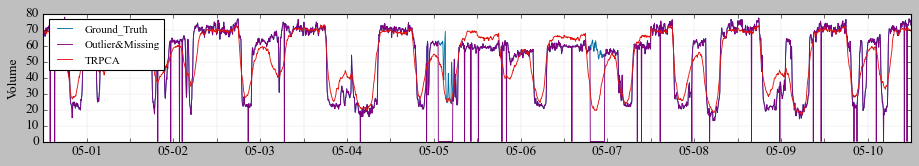

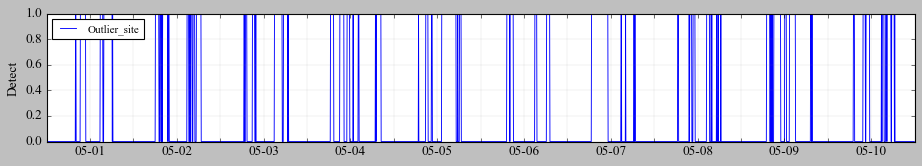

In [101]:
P_NM_(0.01,4,10)

Iter: 100
MAPE_missing: 0.0769487
RMSE_missing: 5.54999
MAPE_outlier: 0.240252
RMSE_outlier: 16.6888
MAPE_no_missing_outlier: 0.0667573
RMSE_no_missing_outlier: 4.84692

Total iteration: 100
Tolerance: 0.000367693
Imputation MAPE_missing: 0.0769487
Imputation RMSE_missing: 5.54999
Imputation MAPE_outlier: 0.240252
Imputation RMSE_outlier: 16.6888
Imputation MAPE_no_missing_outlier: 0.0667573
Imputation RMSE_no_missing_outlier: 4.84692

Detect_rate: 100.000% 
False_Detect_rate: 6.648% 
Running time: 69 seconds


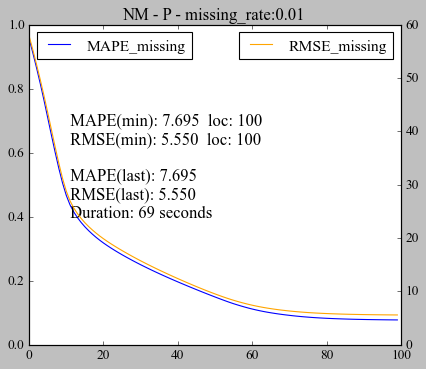

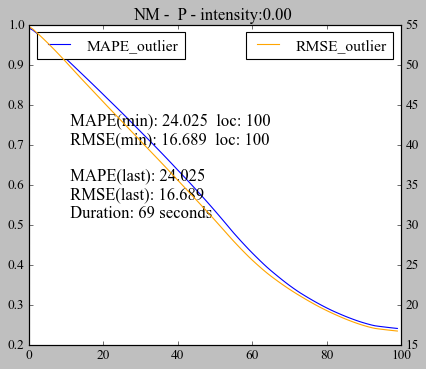

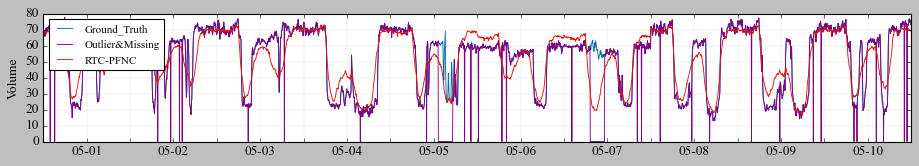

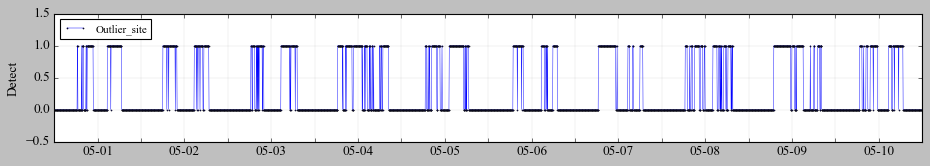

In [362]:
P_NM_(0.01,4,10)#0.2

Iter: 100
MAPE_missing: 0.0770184
RMSE_missing: 5.55605
MAPE_outlier: 0.409905
RMSE_outlier: 24.9161

Total iteration: 100
Tolerance: 0.000386295
Imputation MAPE_missing: 0.0770184
Imputation RMSE_missing: 5.55605
Imputation MAPE_outlier: 0.409905
Imputation RMSE_outlier: 24.9161

Detect_rate: 100.000% 
False_Detect_rate: 3.406% 
Running time: 59 seconds


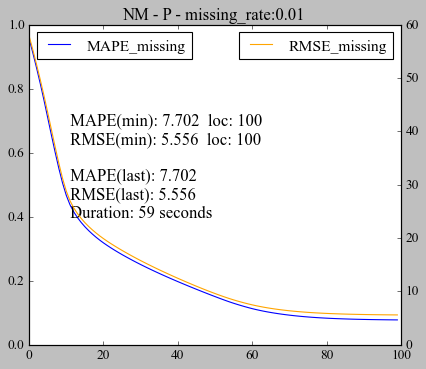

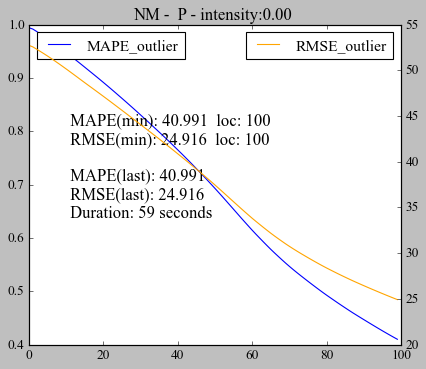

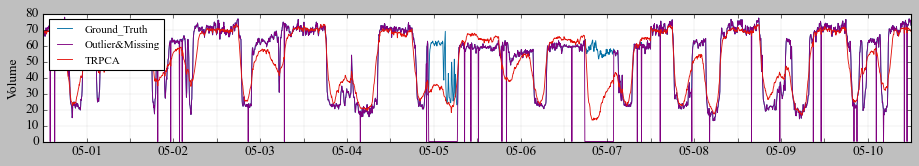

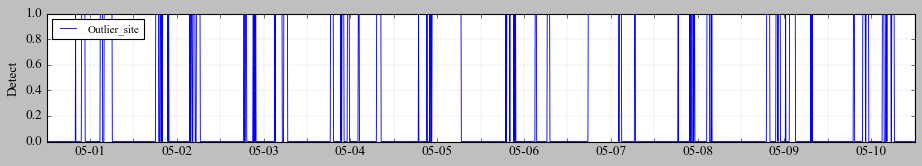

In [102]:
P_NM_(0.01,8,10)

Iter: 100
MAPE_missing: 0.0770184
RMSE_missing: 5.55605
MAPE_outlier: 0.409905
RMSE_outlier: 24.9161
MAPE_no_missing_outlier: 0.0666152
RMSE_no_missing_outlier: 4.83952

Total iteration: 100
Tolerance: 0.000386295
Imputation MAPE_missing: 0.0770184
Imputation RMSE_missing: 5.55605
Imputation MAPE_outlier: 0.409905
Imputation RMSE_outlier: 24.9161
Imputation MAPE_no_missing_outlier: 0.0666152
Imputation RMSE_no_missing_outlier: 4.83952

Detect_rate: 100.000% 
False_Detect_rate: 6.628% 
Running time: 69 seconds


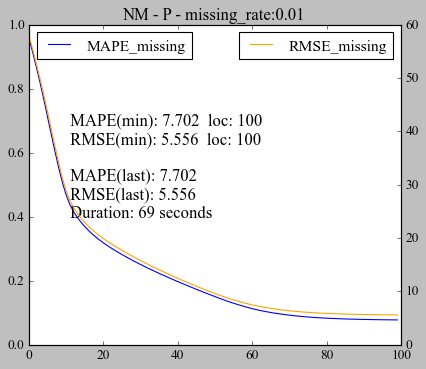

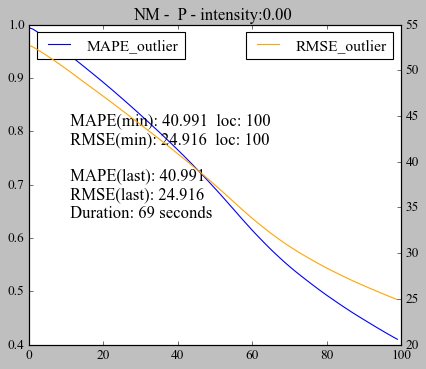

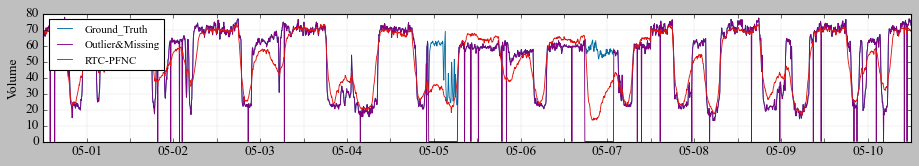

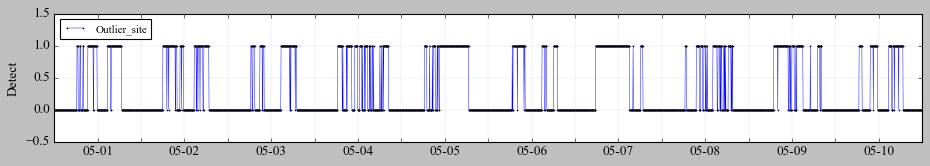

In [363]:
P_NM_(0.01,8,10)#0.2

Iter: 100
MAPE_missing: 0.100279
RMSE_missing: 4.11139
MAPE_outlier: 0.118612
RMSE_outlier: 4.85946

Total iteration: 100
Tolerance: 0.000208033
Imputation MAPE_missing: 0.100279
Imputation RMSE_missing: 4.11139
Imputation MAPE_outlier: 0.118612
Imputation RMSE_outlier: 4.85946

Detect_rate: 100.000% 
False_Detect_rate: 4.790% 
Running time: 36 seconds


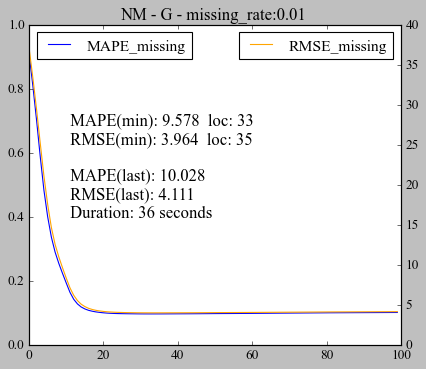

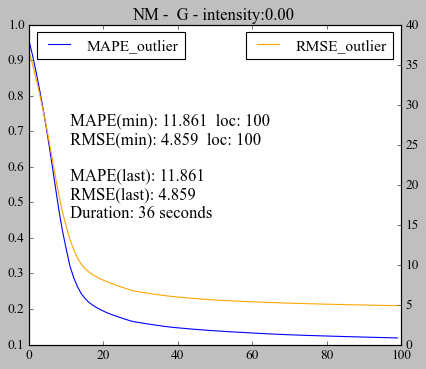

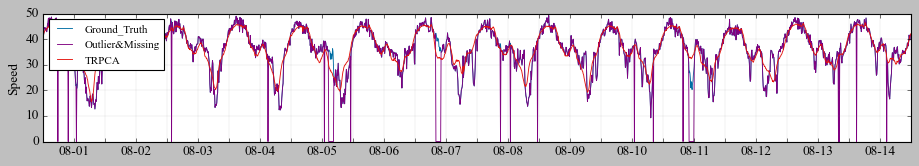

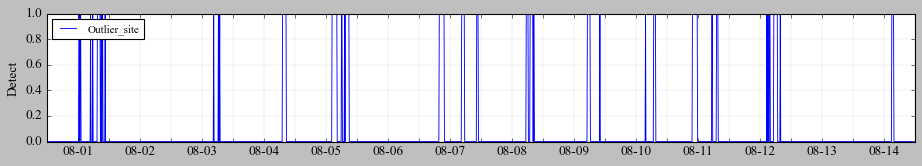

In [103]:
G_NM_(0.01,2,10)

Iter: 100
MAPE_missing: 0.100279
RMSE_missing: 4.11139
MAPE_outlier: 0.118612
RMSE_outlier: 4.85946
MAPE_no_missing_outlier: 0.0974176
RMSE_no_missing_outlier: 4.05281

Total iteration: 100
Tolerance: 0.000208033
Imputation MAPE_missing: 0.100279
Imputation RMSE_missing: 4.11139
Imputation MAPE_outlier: 0.118612
Imputation RMSE_outlier: 4.85946
Imputation MAPE_no_missing_outlier: 0.0974176
Imputation RMSE_no_missing_outlier: 4.05281

Detect_rate: 100.000% 
False_Detect_rate: 9.151% 
Running time: 44 seconds


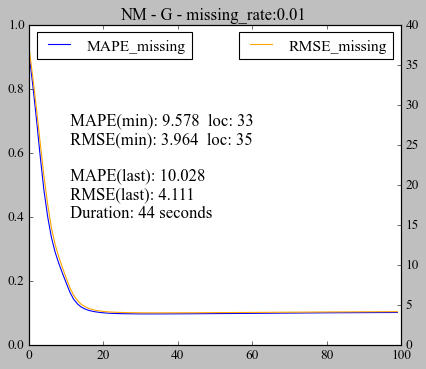

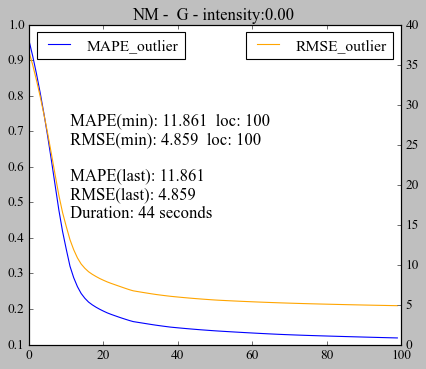

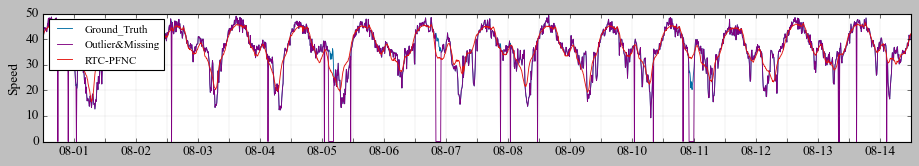

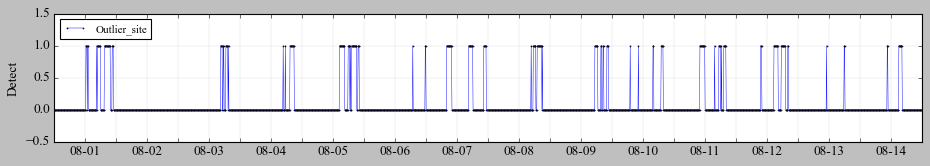

In [364]:
G_NM_(0.01,2,10)#0.2

Iter: 100
MAPE_missing: 0.1003
RMSE_missing: 4.11205
MAPE_outlier: 0.145411
RMSE_outlier: 6.06298

Total iteration: 100
Tolerance: 0.000208102
Imputation MAPE_missing: 0.1003
Imputation RMSE_missing: 4.11205
Imputation MAPE_outlier: 0.145411
Imputation RMSE_outlier: 6.06298

Detect_rate: 100.000% 
False_Detect_rate: 4.790% 
Running time: 36 seconds


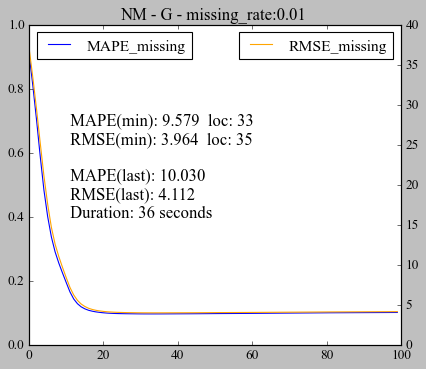

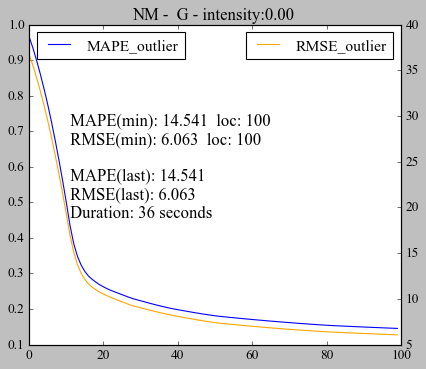

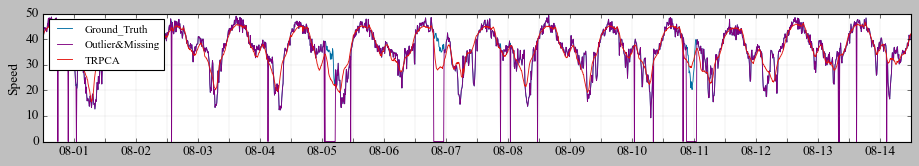

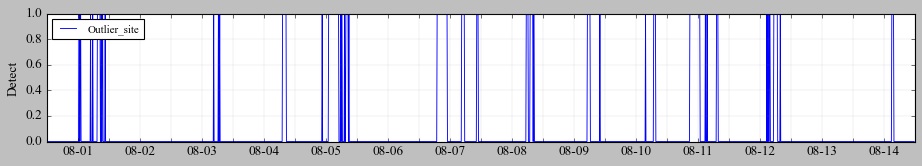

In [104]:
G_NM_(0.01,4,10)

Iter: 100
MAPE_missing: 0.1003
RMSE_missing: 4.11205
MAPE_outlier: 0.145411
RMSE_outlier: 6.06298
MAPE_no_missing_outlier: 0.0974245
RMSE_no_missing_outlier: 4.05295

Total iteration: 100
Tolerance: 0.000208102
Imputation MAPE_missing: 0.1003
Imputation RMSE_missing: 4.11205
Imputation MAPE_outlier: 0.145411
Imputation RMSE_outlier: 6.06298
Imputation MAPE_no_missing_outlier: 0.0974245
Imputation RMSE_no_missing_outlier: 4.05295

Detect_rate: 100.000% 
False_Detect_rate: 9.153% 
Running time: 44 seconds


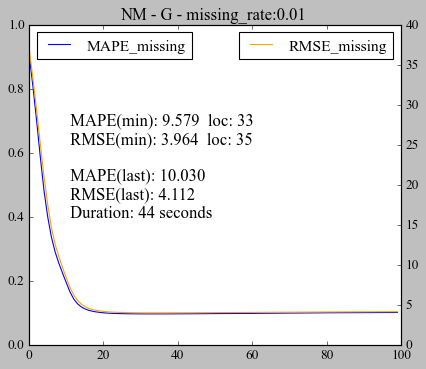

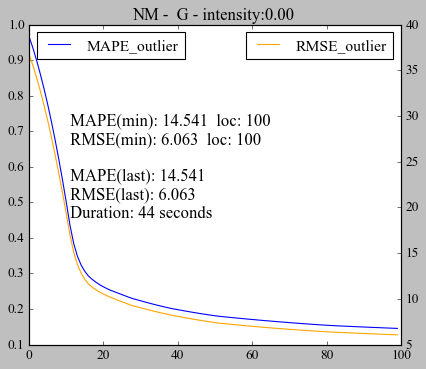

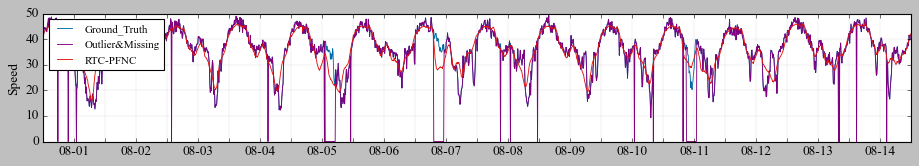

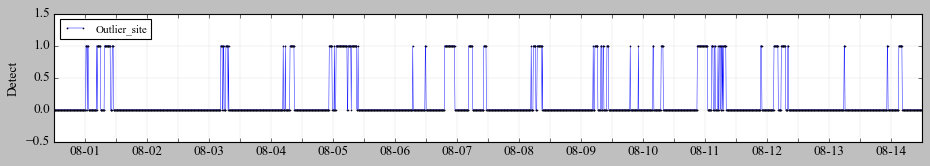

In [365]:
G_NM_(0.01,4,10)#0.2

Iter: 100
MAPE_missing: 0.100305
RMSE_missing: 4.11248
MAPE_outlier: 0.248794
RMSE_outlier: 9.82925

Total iteration: 100
Tolerance: 0.000208305
Imputation MAPE_missing: 0.100305
Imputation RMSE_missing: 4.11248
Imputation MAPE_outlier: 0.248794
Imputation RMSE_outlier: 9.82925

Detect_rate: 100.000% 
False_Detect_rate: 4.790% 
Running time: 36 seconds


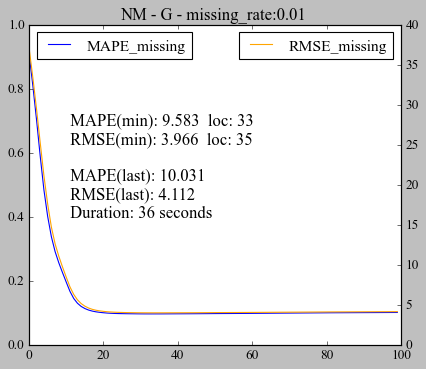

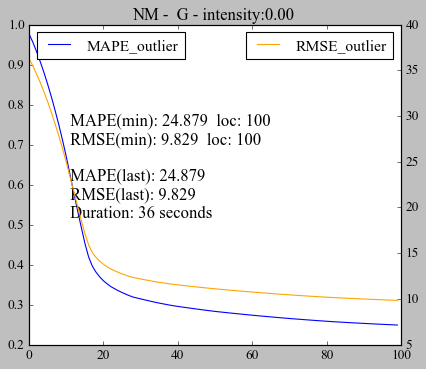

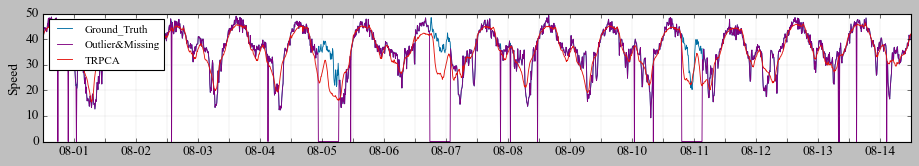

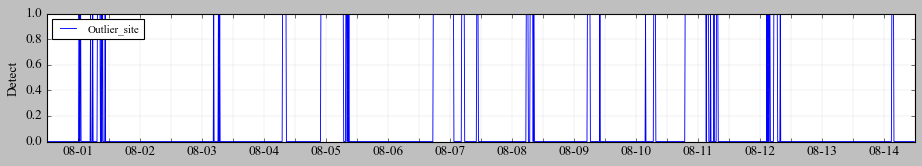

In [105]:
G_NM_(0.01,8,10)

Iter: 100
MAPE_missing: 0.100305
RMSE_missing: 4.11248
MAPE_outlier: 0.248794
RMSE_outlier: 9.82925
MAPE_no_missing_outlier: 0.0974243
RMSE_no_missing_outlier: 4.05288

Total iteration: 100
Tolerance: 0.000208305
Imputation MAPE_missing: 0.100305
Imputation RMSE_missing: 4.11248
Imputation MAPE_outlier: 0.248794
Imputation RMSE_outlier: 9.82925
Imputation MAPE_no_missing_outlier: 0.0974243
Imputation RMSE_no_missing_outlier: 4.05288

Detect_rate: 100.000% 
False_Detect_rate: 9.152% 
Running time: 45 seconds


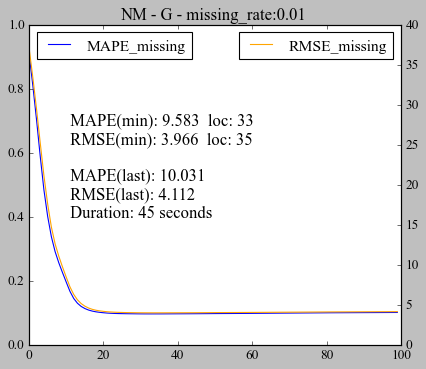

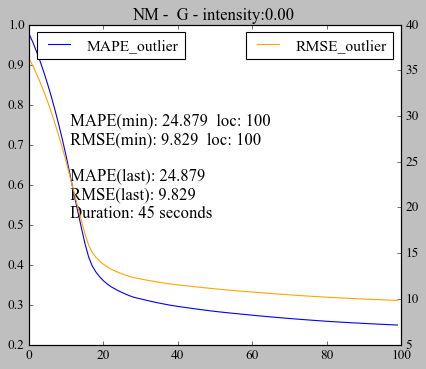

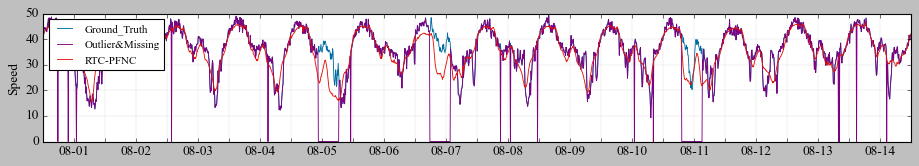

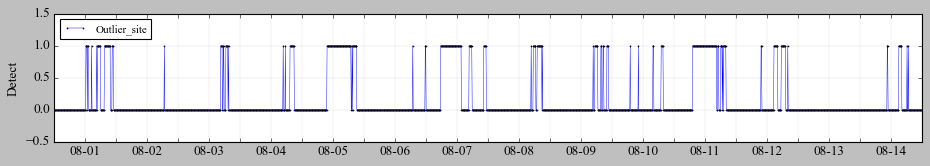

In [366]:
G_NM_(0.01,8,10)#0.2

## 场景4

### 数据扰动

Iter: 100
MAPE_missing: 0.0771708
RMSE_missing: 5.55643
MAPE_outlier: 0.187376
RMSE_outlier: 9.95895

Total iteration: 100
Tolerance: 0.000364521
Imputation MAPE_missing: 0.0771708
Imputation RMSE_missing: 5.55643
Imputation MAPE_outlier: 0.187376
Imputation RMSE_outlier: 9.95895

Detect_rate: 100.000% 
False_Detect_rate: 4.295% 
Running time: 58 seconds


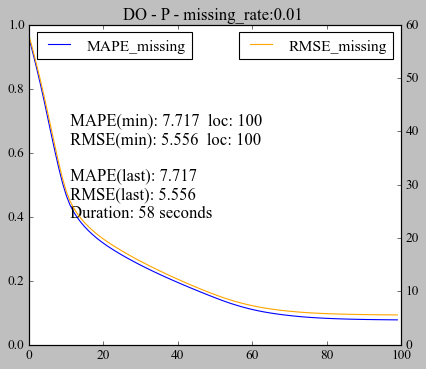

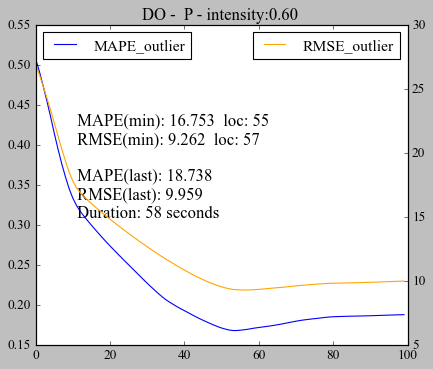

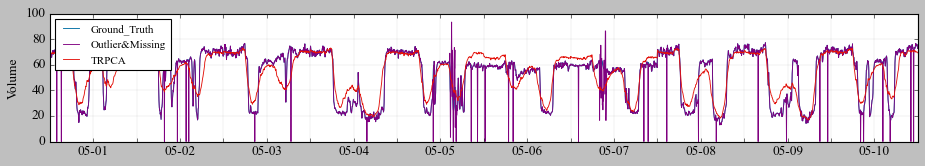

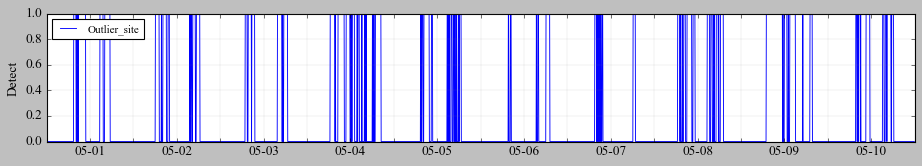

In [116]:
P_DO(0.01,0.6,2,10)

Iter: 100
MAPE_missing: 0.0771708
RMSE_missing: 5.55643
MAPE_outlier: 0.187376
RMSE_outlier: 9.95895
MAPE_no_missing_outlier: 0.0668715
RMSE_no_missing_outlier: 4.85212

Total iteration: 100
Tolerance: 0.000364521
Imputation MAPE_missing: 0.0771708
Imputation RMSE_missing: 5.55643
Imputation MAPE_outlier: 0.187376
Imputation RMSE_outlier: 9.95895
Imputation MAPE_no_missing_outlier: 0.0668715
Imputation RMSE_no_missing_outlier: 4.85212

Detect_rate: 100.000% 
False_Detect_rate: 6.970% 
Running time: 69 seconds


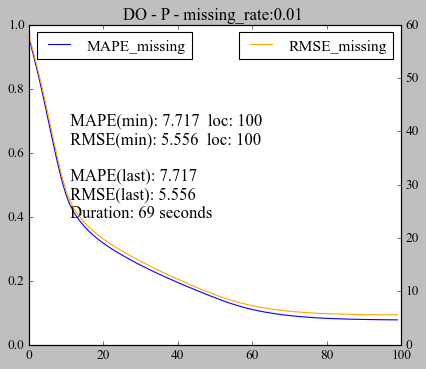

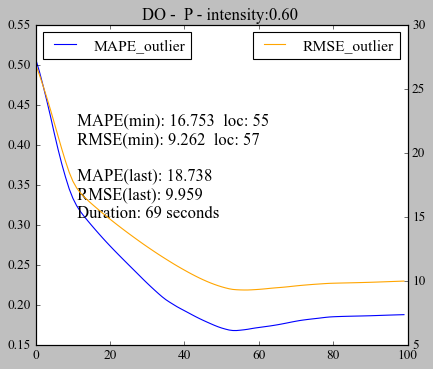

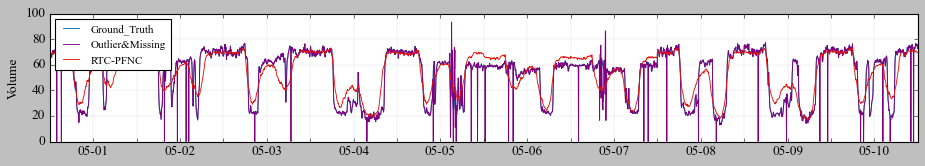

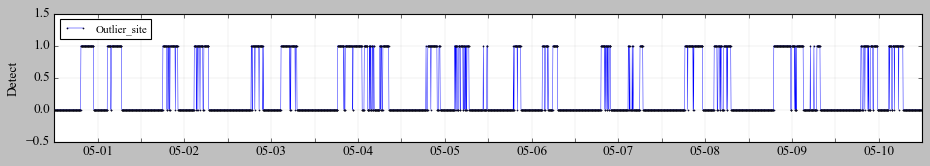

In [367]:
P_DO(0.01,0.6,2,10)#0.2

Iter: 100
MAPE_missing: 0.0770836
RMSE_missing: 5.5528
MAPE_outlier: 0.166972
RMSE_outlier: 9.06208

Total iteration: 100
Tolerance: 0.000364465
Imputation MAPE_missing: 0.0770836
Imputation RMSE_missing: 5.5528
Imputation MAPE_outlier: 0.166972
Imputation RMSE_outlier: 9.06208

Detect_rate: 100.000% 
False_Detect_rate: 4.294% 
Running time: 58 seconds


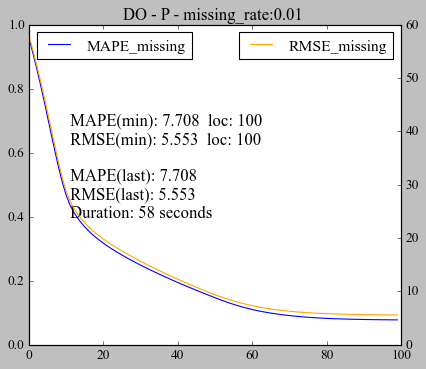

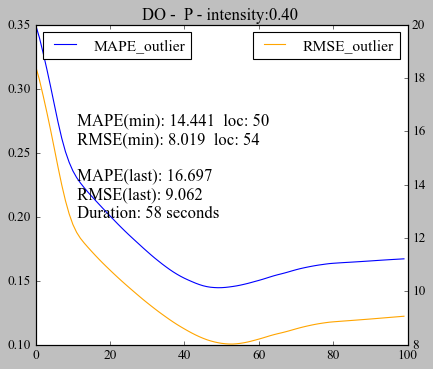

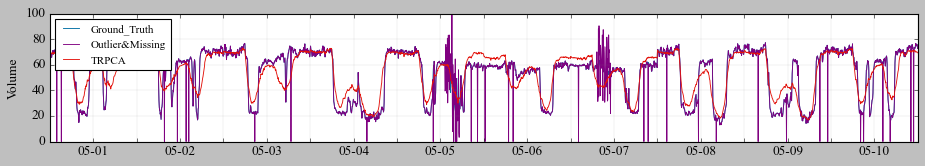

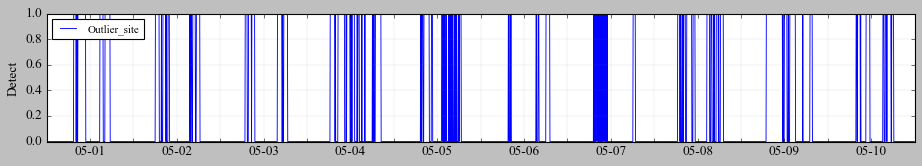

In [117]:
P_DO(0.01,0.4,4,10)

Iter: 100
MAPE_missing: 0.0770836
RMSE_missing: 5.5528
MAPE_outlier: 0.166972
RMSE_outlier: 9.06208
MAPE_no_missing_outlier: 0.0668648
RMSE_no_missing_outlier: 4.85179

Total iteration: 100
Tolerance: 0.000364465
Imputation MAPE_missing: 0.0770836
Imputation RMSE_missing: 5.5528
Imputation MAPE_outlier: 0.166972
Imputation RMSE_outlier: 9.06208
Imputation MAPE_no_missing_outlier: 0.0668648
Imputation RMSE_no_missing_outlier: 4.85179

Detect_rate: 100.000% 
False_Detect_rate: 6.967% 
Running time: 69 seconds


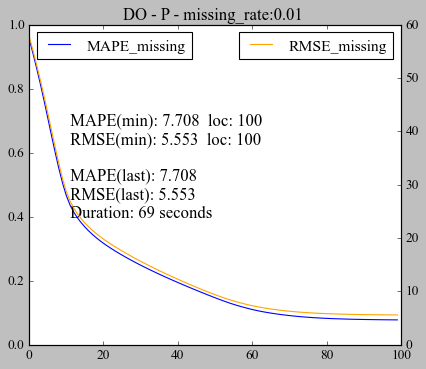

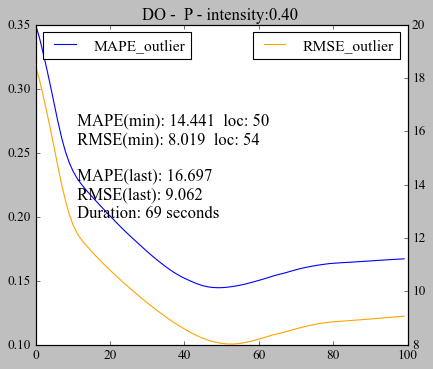

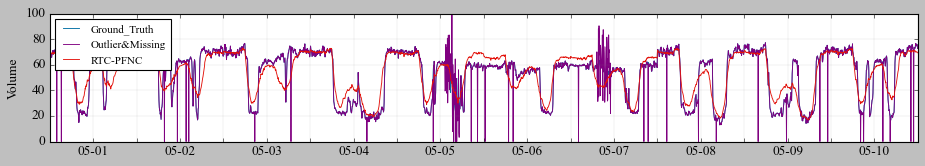

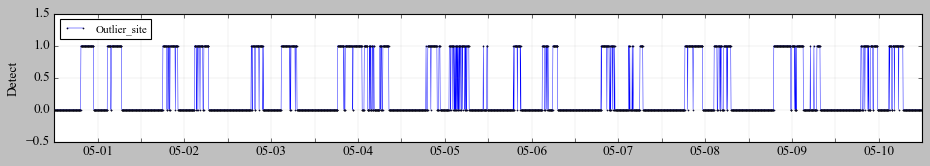

In [368]:
P_DO(0.01,0.4,4,10)#0.2

Iter: 100
MAPE_missing: 0.0769774
RMSE_missing: 5.55062
MAPE_outlier: 0.186027
RMSE_outlier: 9.45763

Total iteration: 100
Tolerance: 0.000364403
Imputation MAPE_missing: 0.0769774
Imputation RMSE_missing: 5.55062
Imputation MAPE_outlier: 0.186027
Imputation RMSE_outlier: 9.45763

Detect_rate: 100.000% 
False_Detect_rate: 4.292% 
Running time: 58 seconds


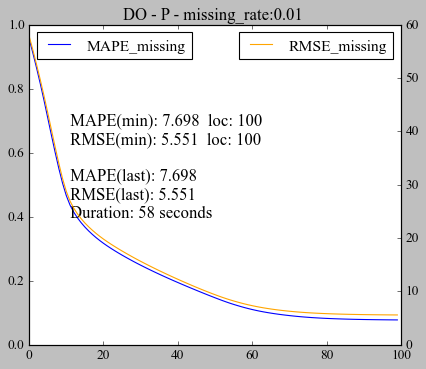

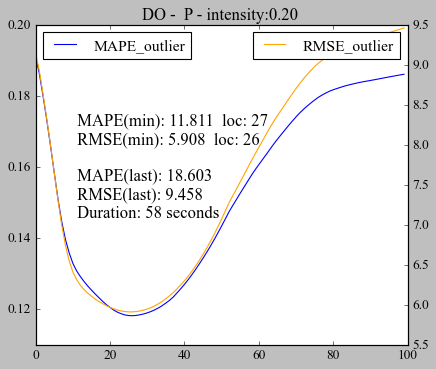

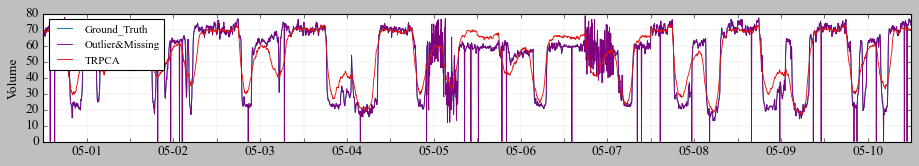

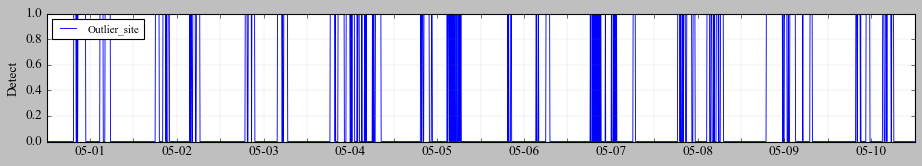

In [118]:
P_DO(0.01,0.2,8,10)

Iter: 100
MAPE_missing: 0.0769774
RMSE_missing: 5.55062
MAPE_outlier: 0.186027
RMSE_outlier: 9.45763
MAPE_no_missing_outlier: 0.0668461
RMSE_no_missing_outlier: 4.85075

Total iteration: 100
Tolerance: 0.000364403
Imputation MAPE_missing: 0.0769774
Imputation RMSE_missing: 5.55062
Imputation MAPE_outlier: 0.186027
Imputation RMSE_outlier: 9.45763
Imputation MAPE_no_missing_outlier: 0.0668461
Imputation RMSE_no_missing_outlier: 4.85075

Detect_rate: 100.000% 
False_Detect_rate: 6.963% 
Running time: 99 seconds


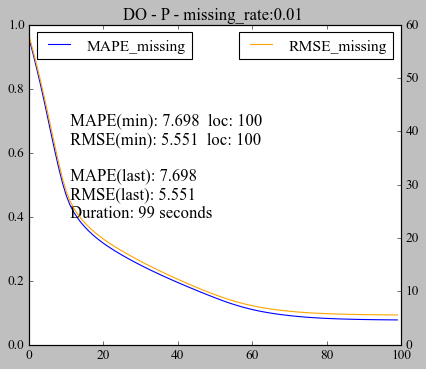

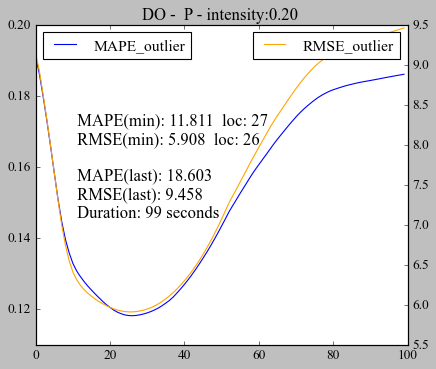

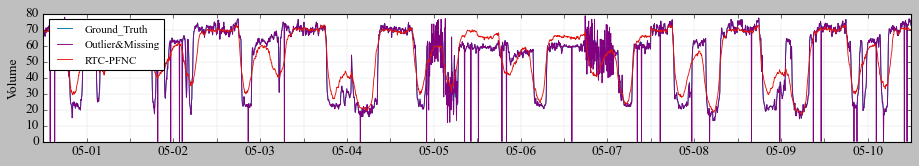

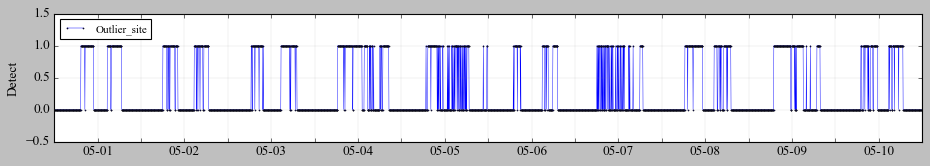

In [369]:
P_DO(0.01,0.2,8,10)#0.2

Iter: 100
MAPE_missing: 0.100247
RMSE_missing: 4.11121
MAPE_outlier: 0.0890711
RMSE_outlier: 4.08989

Total iteration: 100
Tolerance: 0.000207864
Imputation MAPE_missing: 0.100247
Imputation RMSE_missing: 4.11121
Imputation MAPE_outlier: 0.0890711
Imputation RMSE_outlier: 4.08989

Detect_rate: 100.000% 
False_Detect_rate: 5.960% 
Running time: 36 seconds


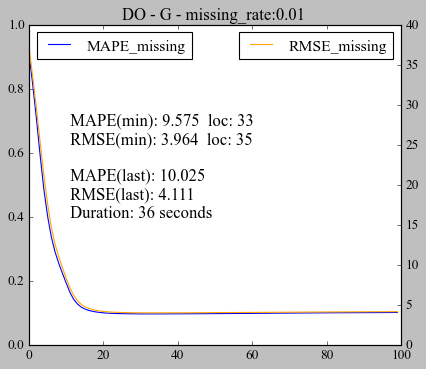

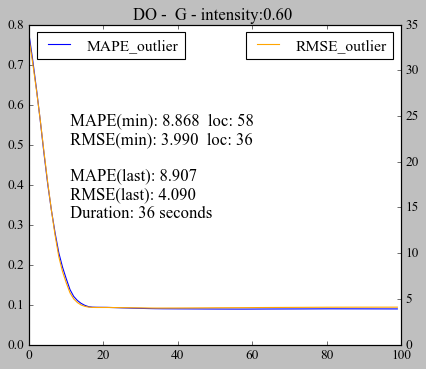

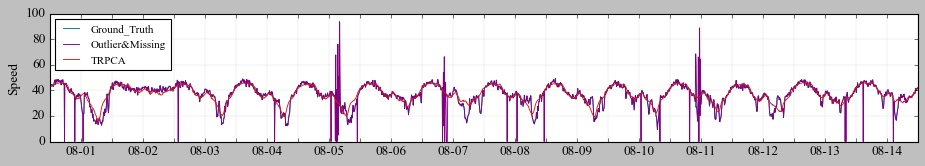

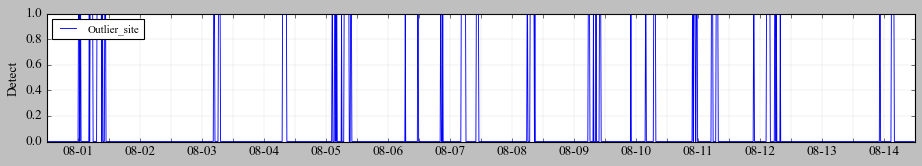

In [119]:
G_DO(0.01,0.6,2,10)

Iter: 100
MAPE_missing: 0.100247
RMSE_missing: 4.11121
MAPE_outlier: 0.0890711
RMSE_outlier: 4.08989
MAPE_no_missing_outlier: 0.0974167
RMSE_no_missing_outlier: 4.05288

Total iteration: 100
Tolerance: 0.000207864
Imputation MAPE_missing: 0.100247
Imputation RMSE_missing: 4.11121
Imputation MAPE_outlier: 0.0890711
Imputation RMSE_outlier: 4.08989
Imputation MAPE_no_missing_outlier: 0.0974167
Imputation RMSE_no_missing_outlier: 4.05288

Detect_rate: 100.000% 
False_Detect_rate: 9.401% 
Running time: 94 seconds


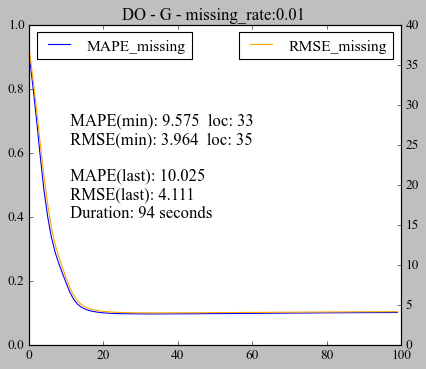

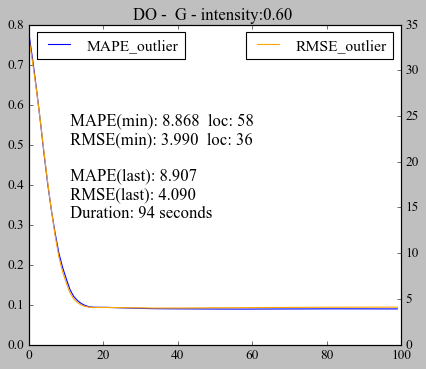

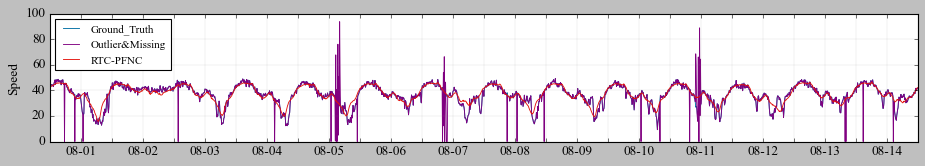

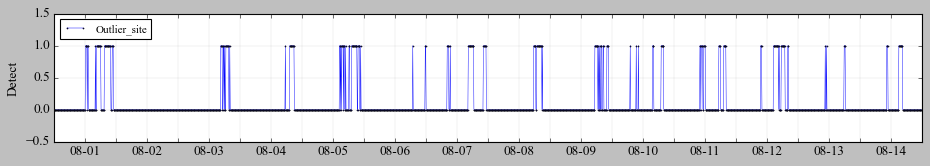

In [370]:
G_DO(0.01,0.6,2,10)#0.2

Iter: 100
MAPE_missing: 0.100264
RMSE_missing: 4.11123
MAPE_outlier: 0.0679688
RMSE_outlier: 3.21938

Total iteration: 100
Tolerance: 0.000207899
Imputation MAPE_missing: 0.100264
Imputation RMSE_missing: 4.11123
Imputation MAPE_outlier: 0.0679688
Imputation RMSE_outlier: 3.21938

Detect_rate: 100.000% 
False_Detect_rate: 1.662% 
Running time: 36 seconds


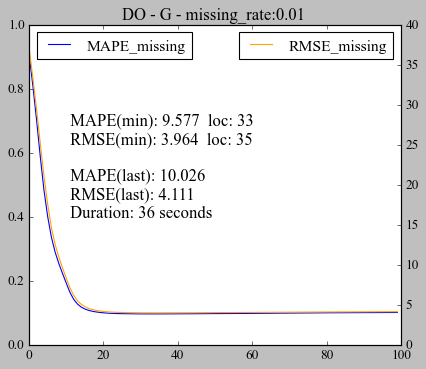

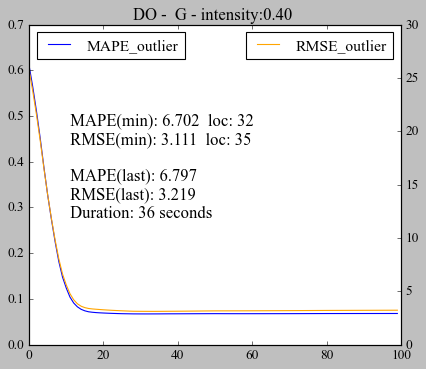

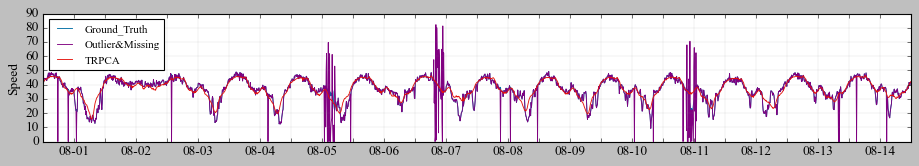

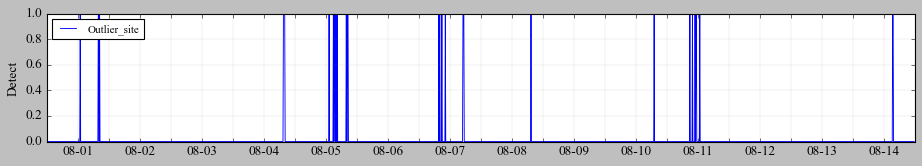

In [134]:
G_DO(0.01,0.4,4,10)

Iter: 100
MAPE_missing: 0.100264
RMSE_missing: 4.11123
MAPE_outlier: 0.0679688
RMSE_outlier: 3.21938
MAPE_no_missing_outlier: 0.0974198
RMSE_no_missing_outlier: 4.05294

Total iteration: 100
Tolerance: 0.000207899
Imputation MAPE_missing: 0.100264
Imputation RMSE_missing: 4.11123
Imputation MAPE_outlier: 0.0679688
Imputation RMSE_outlier: 3.21938
Imputation MAPE_no_missing_outlier: 0.0974198
Imputation RMSE_no_missing_outlier: 4.05294

Detect_rate: 100.000% 
False_Detect_rate: 9.401% 
Running time: 95 seconds


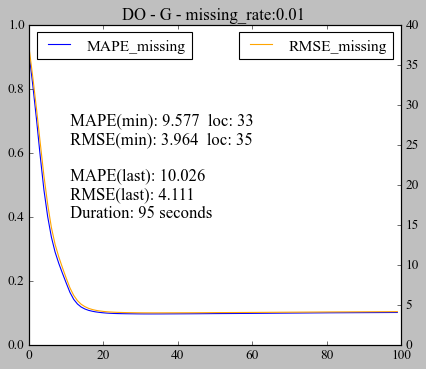

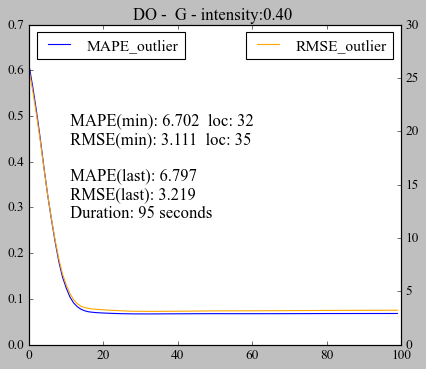

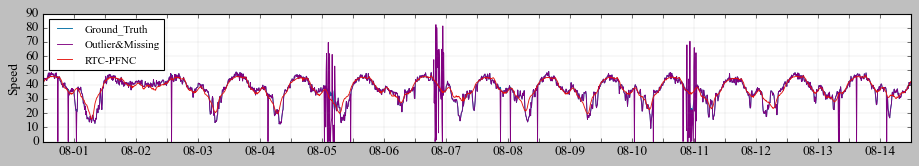

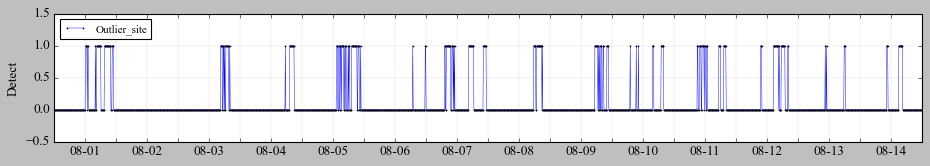

In [371]:
G_DO(0.01,0.4,4,10)#0.2

Iter: 100
MAPE_missing: 0.100273
RMSE_missing: 4.11126
MAPE_outlier: 0.0793677
RMSE_outlier: 3.47973

Total iteration: 100
Tolerance: 0.000207875
Imputation MAPE_missing: 0.100273
Imputation RMSE_missing: 4.11126
Imputation MAPE_outlier: 0.0793677
Imputation RMSE_outlier: 3.47973

Detect_rate: 100.000% 
False_Detect_rate: 1.662% 
Running time: 36 seconds


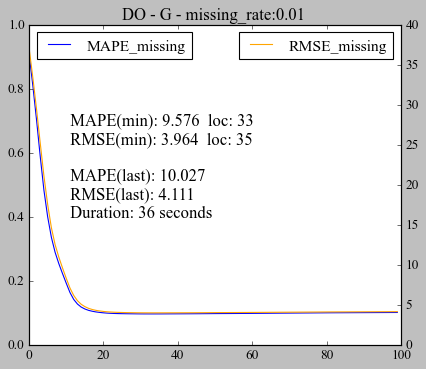

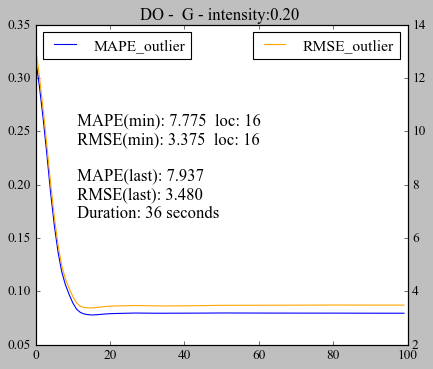

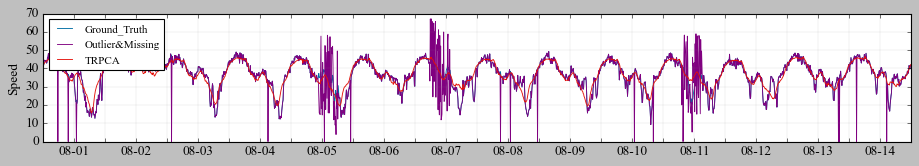

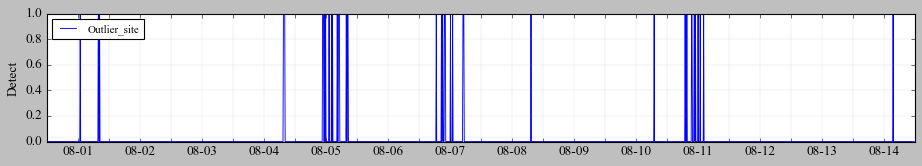

In [135]:
G_DO(0.01,0.2,8,10)

Iter: 100
MAPE_missing: 0.100273
RMSE_missing: 4.11126
MAPE_outlier: 0.0793677
RMSE_outlier: 3.47973
MAPE_no_missing_outlier: 0.0974218
RMSE_no_missing_outlier: 4.05299

Total iteration: 100
Tolerance: 0.000207875
Imputation MAPE_missing: 0.100273
Imputation RMSE_missing: 4.11126
Imputation MAPE_outlier: 0.0793677
Imputation RMSE_outlier: 3.47973
Imputation MAPE_no_missing_outlier: 0.0974218
Imputation RMSE_no_missing_outlier: 4.05299

Detect_rate: 100.000% 
False_Detect_rate: 9.401% 
Running time: 94 seconds


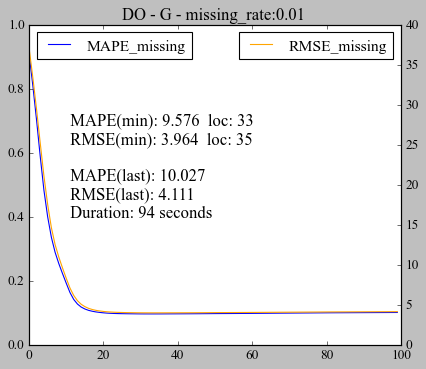

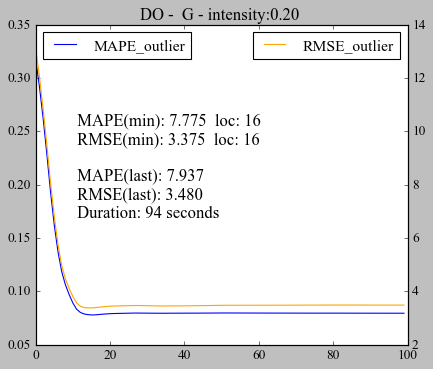

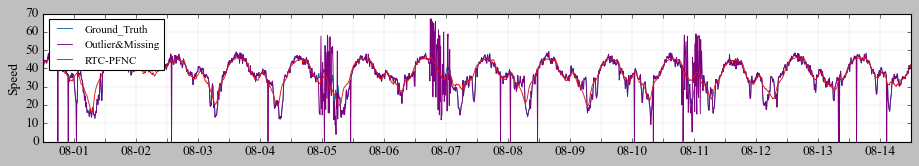

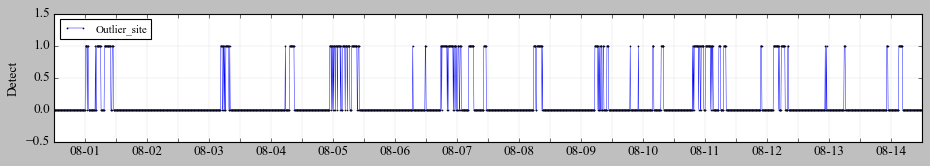

In [372]:
G_DO(0.01,0.2,8,10)#0.2